# County-level Material Stock Analysis USA

## Load packages

In [1]:
require(moments)
require(sf)
require(dplyr)
require(cartogram)
require(factoextra)
require(viridis)
require(IRdisplay)

Lade nötiges Paket: moments

Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
“es gibt kein Paket namens ‘moments’”
Lade nötiges Paket: sf

Linking to GEOS 3.6.2, GDAL 2.2.3, PROJ 4.9.3

Lade nötiges Paket: dplyr


Attache Paket: ‘dplyr’


Die folgenden Objekte sind maskiert von ‘package:stats’:

    filter, lag


Die folgenden Objekte sind maskiert von ‘package:base’:

    intersect, setdiff, setequal, union


Lade nötiges Paket: cartogram

Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
“es gibt kein Paket namens ‘cartogram’”
Lade nötiges Paket: factoextra

Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
“es gibt kein Paket namens ‘factoextra’”
Lade nötiges Paket: viridis

Lade nötiges Paket: viridisLite

Lade nötiges Paket: IRdisplay



## Paths

In [2]:
dcsv  <- "../csv/"
dshp  <- "../shp"
dplot <- "dorling-county"

## Read data

In [3]:
sf <- st_read(sprintf("%s/county_proj_climate.shp", dshp))

stats <- read.csv(sprintf("%s/stats-all-counties/area_pop_per_county.csv", dcsv))

stocks <- read.csv(sprintf("%s/mass-per-county/zonal_mass_ENLOCALE.csv", dcsv), sep = ",")
colnames(stocks)[1] <- "ID"

#str(stats)
#str(stocks)

Reading layer `county_proj_climate' from data source `/home/frantzda/mat_stocks/paper/USA/shp/county_proj_climate.shp' using driver `ESRI Shapefile'
Simple feature collection with 3102 features and 6 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: 6003199 ymin: 1957227 xmax: 10627540 ymax: 4863395
proj4string:   +proj=aeqd +lat_0=52 +lon_0=-97.5 +x_0=8264722.17686 +y_0=4867518.35323 +datum=WGS84 +units=m +no_defs 


## Prepare data

- join shapefile with all tables
- compute total stock
- compute population density
- compute building to infrastructure ratio
- compute stocks per area and per capita

In [4]:
sf <- sf %>%
        inner_join(stats, by = "ID") %>%
        inner_join(stocks, by = "ID")

In [5]:
sf <- sf %>%
        mutate(POP_PER_AREA = POPESTIMATE2018 / AREA)

In [6]:
sf <- sf %>%
        mutate(ratio = mass_building / (mass_street + mass_rail + mass_other) * 100)

In [7]:
sf_area <- sf %>% mutate_at(
                    vars(starts_with("mass")), 
                    funs(. / AREA))
sf_pop  <- sf %>% mutate_at(
                    vars(starts_with("mass")), 
                    funs(. / POPESTIMATE2018))

Warning message:
“`funs()` was deprecated in dplyr 0.8.0.
Please use a list of either functions or lambdas: 

  # Simple named list: 
  list(mean = mean, median = median)

  # Auto named with `tibble::lst()`: 
  tibble::lst(mean, median)

  # Using lambdas
  list(~ mean(., trim = .2), ~ median(., na.rm = TRUE))
This warning is displayed once every 8 hours.
Call `lifecycle::last_warnings()` to see where this warning was generated.”


## Basic Stats

#### Total area in km²

In [8]:
sum(sf$AREA)

[1] 7943446

#### Total population in 2000, 2010, 2018 + 20-year development

[1] 280325700

[1] 307243793

[1] 324531769

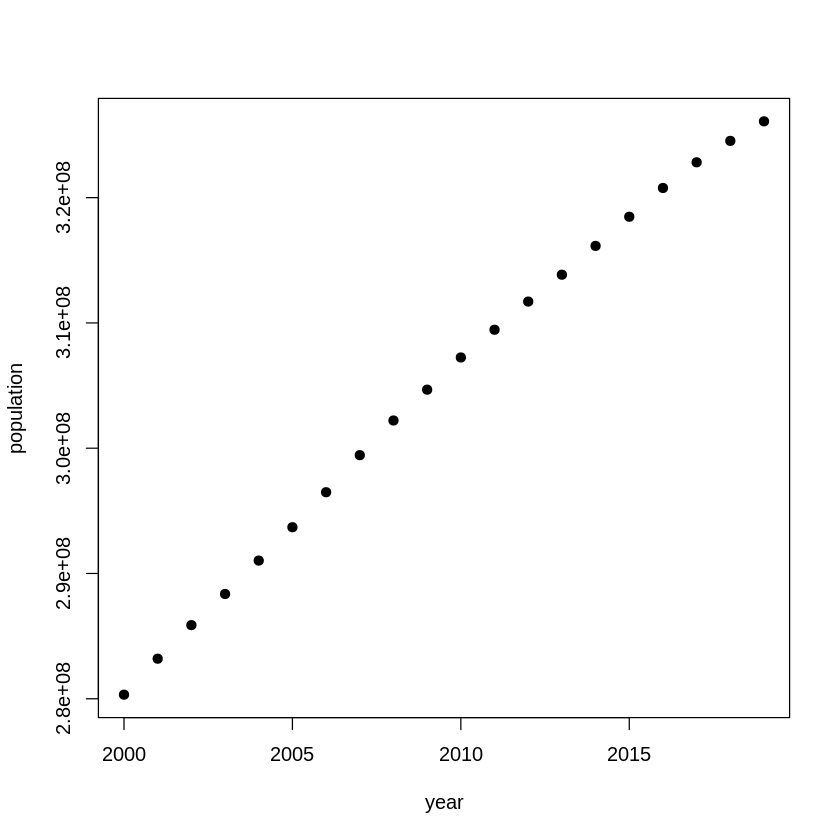

In [9]:
sum(sf$POPESTIMATE2000)
sum(sf$POPESTIMATE2010)
sum(sf$POPESTIMATE2018)

popsum <- st_drop_geometry(sf) %>%
    select(starts_with("POPESTIMATE")) %>%
    apply(2, sum)
popy <- names(popsum) %>% 
    gsub("POPESTIMATE", "", .) %>%
    as.integer()

plot(popy, popsum, 
     type = "p",
     pch = 19,
     xlab = "year",
     ylab = "population")

## Total stocks for entire CONUS

#### Total stock in t, kt, Mt, Gt

In [10]:
sum(sf$mass_grand_t_10m2)     # total in tons
sum(sf$mass_grand_t_10m2)/1e3 # total in kilo-tons
sum(sf$mass_grand_t_10m2)/1e6 # total in mega-tons
sum(sf$mass_grand_t_10m2)/1e9 # total in giga-tons

[1] 127335265075

[1] 127335265

[1] 127335.3

[1] 127.3353

#### Total stock in t/km², t/cap

In [12]:
sum(sf$mass_grand_t_10m2) / sum(sf$AREA)            # tons per km²
sum(sf$mass_grand_t_10m2) / sum(sf$POPESTIMATE2018) # tons per cap

[1] 16030.23

[1] 392.3661

#### Individual sums in Mt

In [11]:
st_drop_geometry(sf) %>% 
    select(starts_with("mass")) %>%
    summarise_if(is.numeric, sum) / 1e6

mass_grand_t_10m2,mass_building_commercial_industrial,mass_building_commercial_innercity,mass_building_highrise,mass_building_lightweight,mass_building_multifamily,mass_building_singlefamily,mass_building_skyscraper,mass_building,mass_other_airport,⋯,mass_street_local,mass_street_motorway_elevated,mass_street_motorway,mass_street_other_elevated,mass_street_primary,mass_street_secondary,mass_street_tertiary,mass_street,mass_street_track,mass_street_tunnel
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
127335.3,17827.33,1417.145,379.2414,4036.883,4986.499,33734.1,470.8369,62852.03,1171.185,⋯,25045.71,118.5593,6827.473,65.03251,2644.461,4253.825,5094.985,45718.5,861.7454,54.76524


#### Distribution

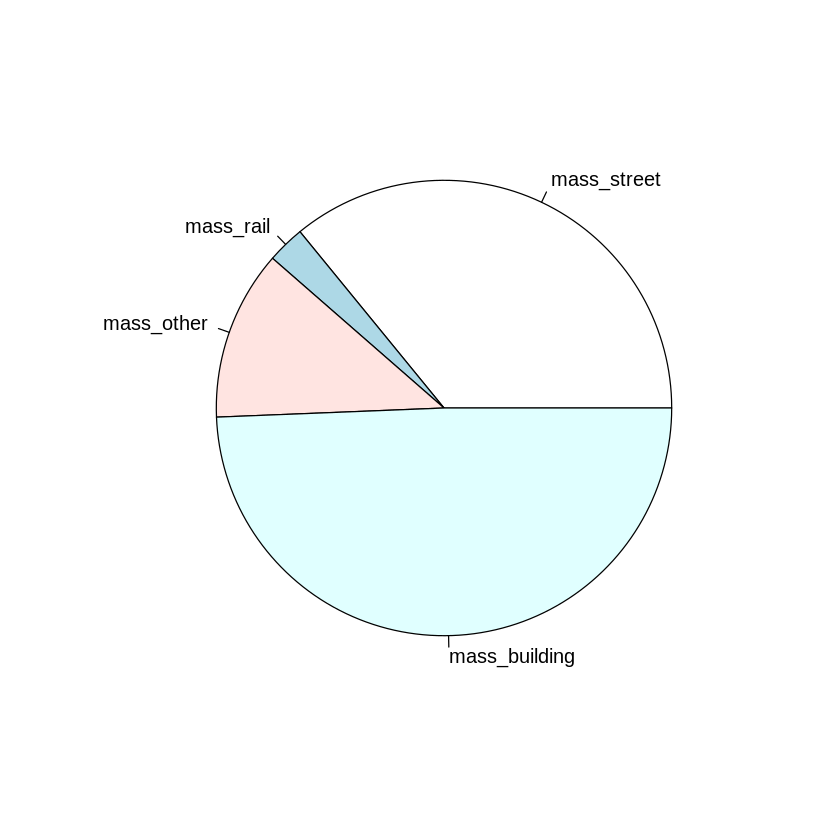

In [89]:
st_drop_geometry(sf) %>%
    select(c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building")) %>%
    apply(2, sum) %>% 
    pie()

#### Distribution per type

[1] "5755.50 t/km²"
[1] "140.88 t/cap"


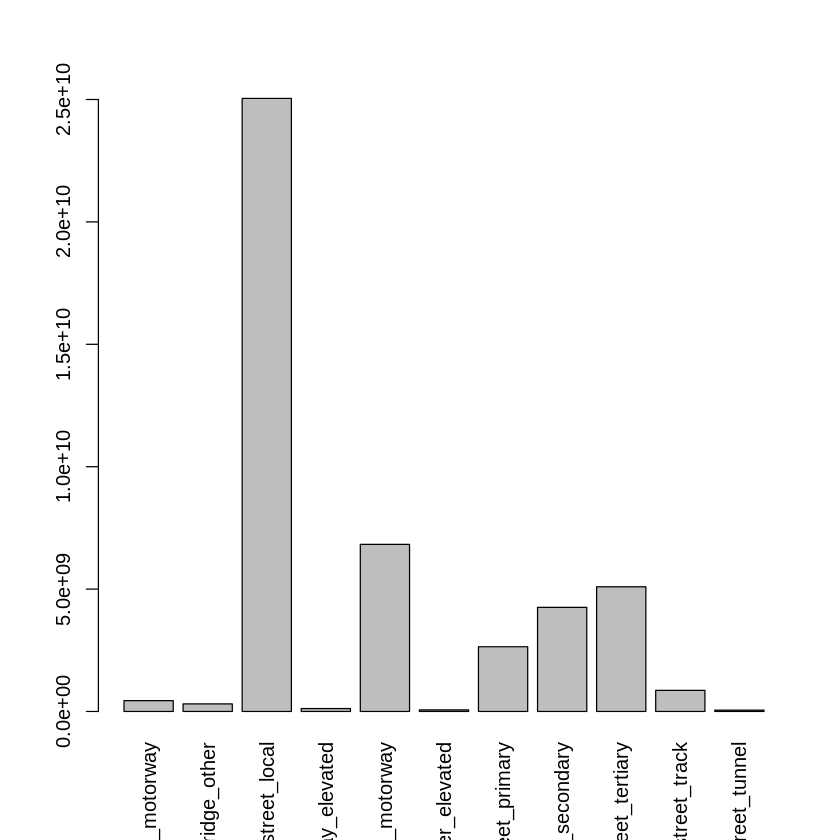

[1] "428.81 t/km²"
[1] "10.50 t/cap"


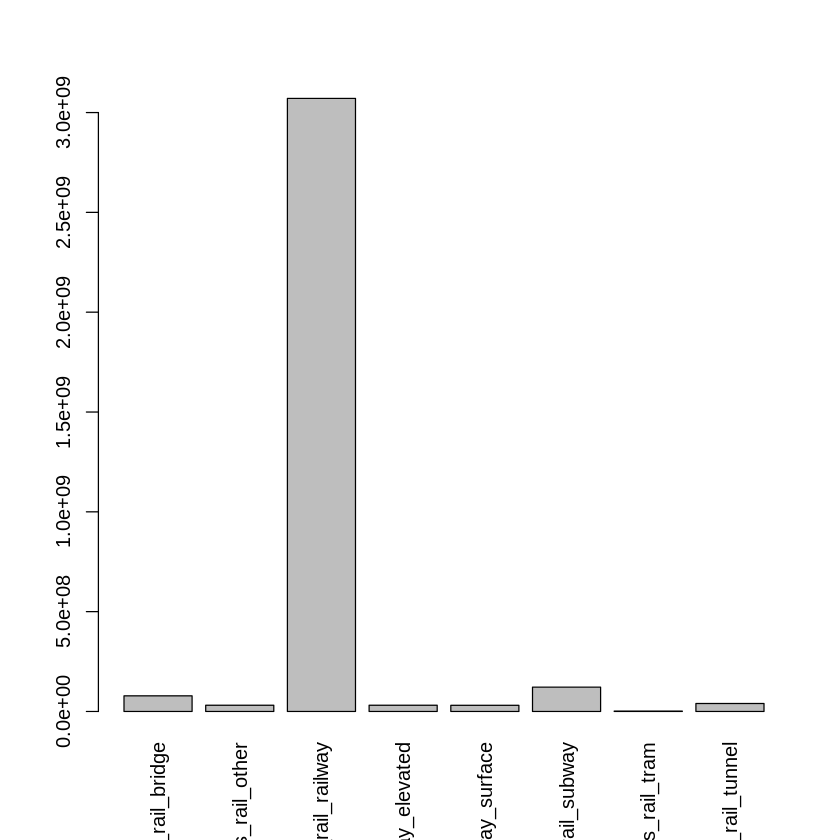

[1] "1933.48 t/km²"
[1] "47.33 t/cap"


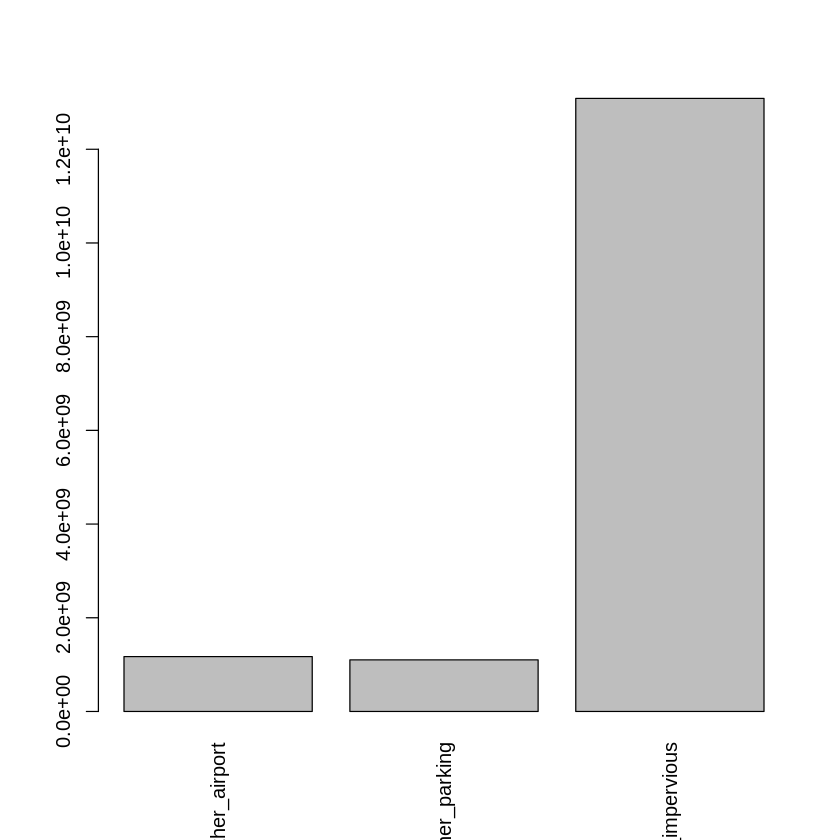

[1] "7912.44 t/km²"
[1] "193.67 t/cap"


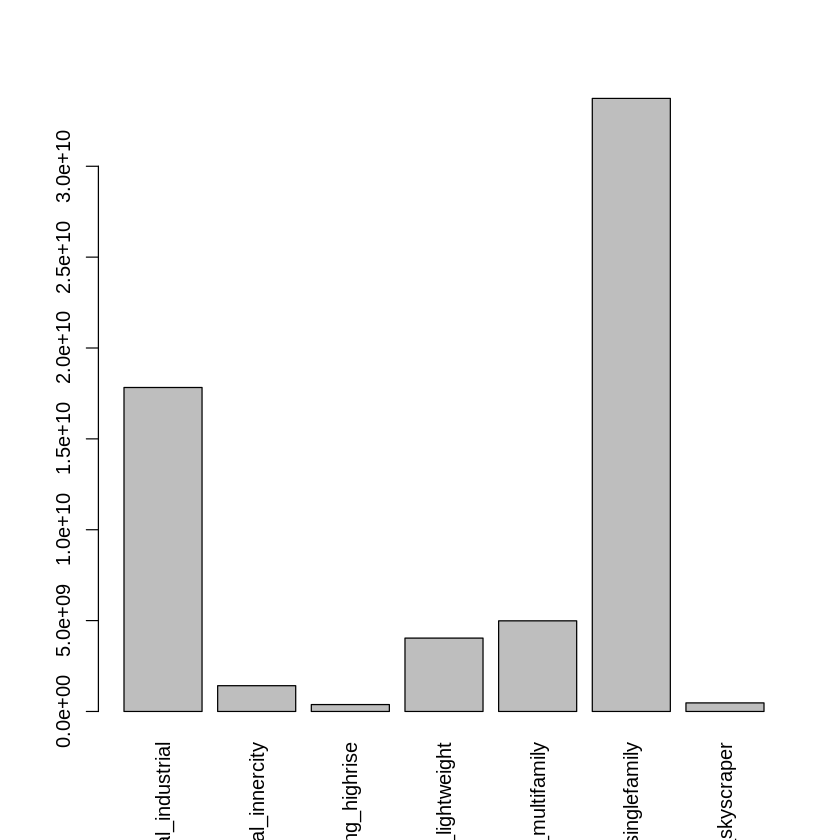

In [92]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building")

for (i in 1:length(names)){
    st_drop_geometry(sf) %>%
        select(starts_with(names[i])) %>%
        select(!names[i]) %>%
        apply(2, sum) %>%
        barplot(las = 3)
    
    st_drop_geometry(sf) %>%
        select(names[i]) %>%
        sum() %>%
        `/`(sum(sf$AREA)) %>%
        sprintf("%.2f t/km²", .) %>%
        print()

    st_drop_geometry(sf) %>%
        select(names[i]) %>%
        sum() %>%
        `/`(sum(sf$POPESTIMATE2018)) %>%
        sprintf("%.2f t/cap", .) %>%
        print()

}

## Histograms for counties

#### range in t/cap

In [12]:
range(sf_pop$mass_grand_t_10m2)

[1]    90.59084 42921.12838

#### Histograms per capita
red line = 1000 t/cap

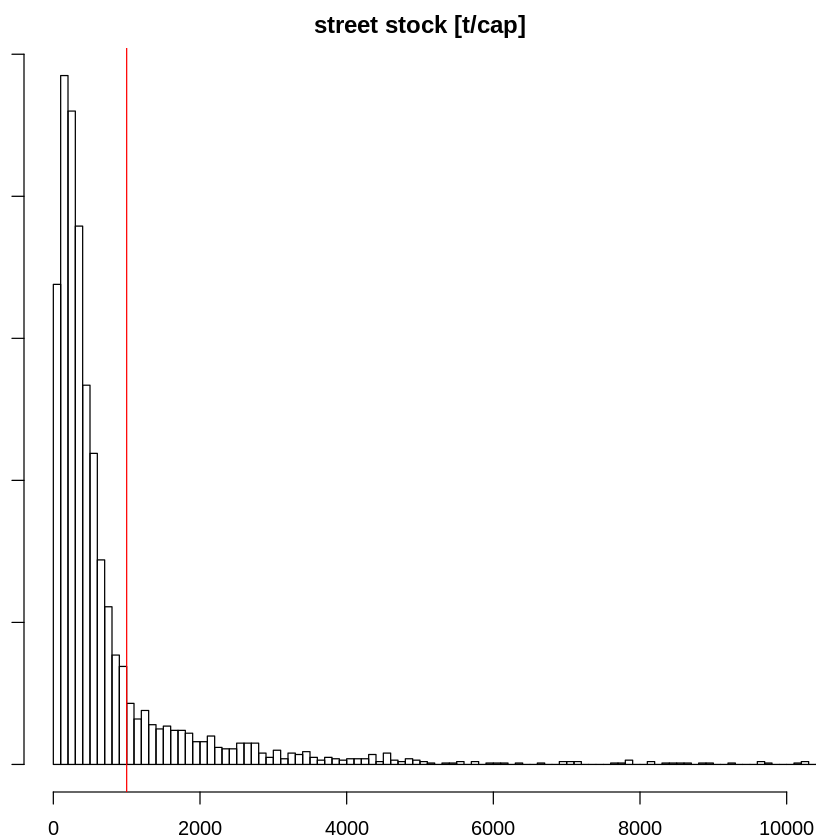

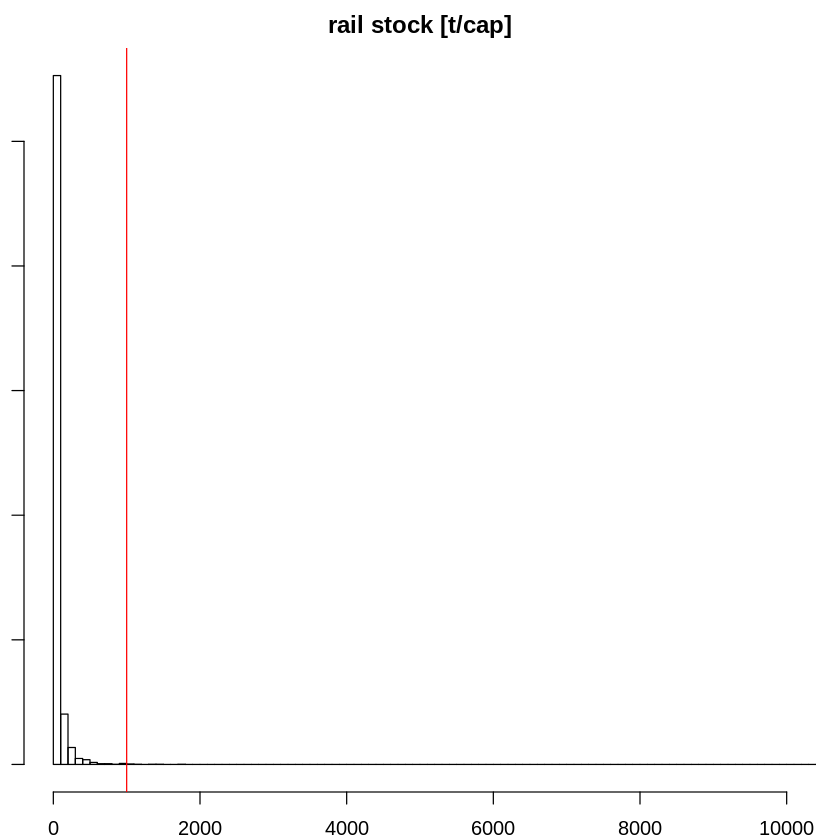

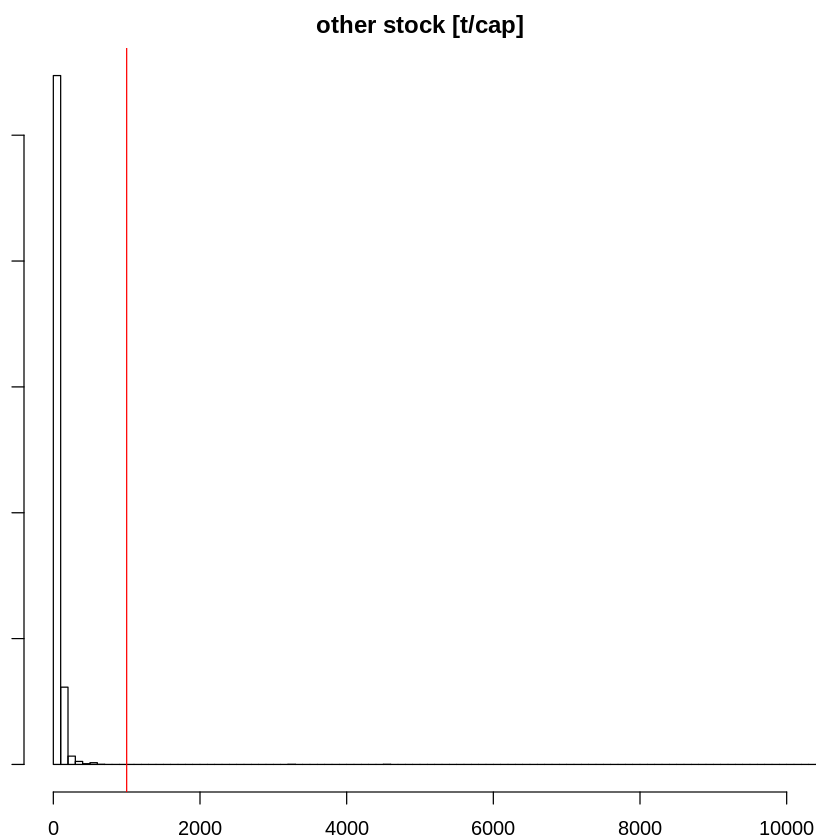

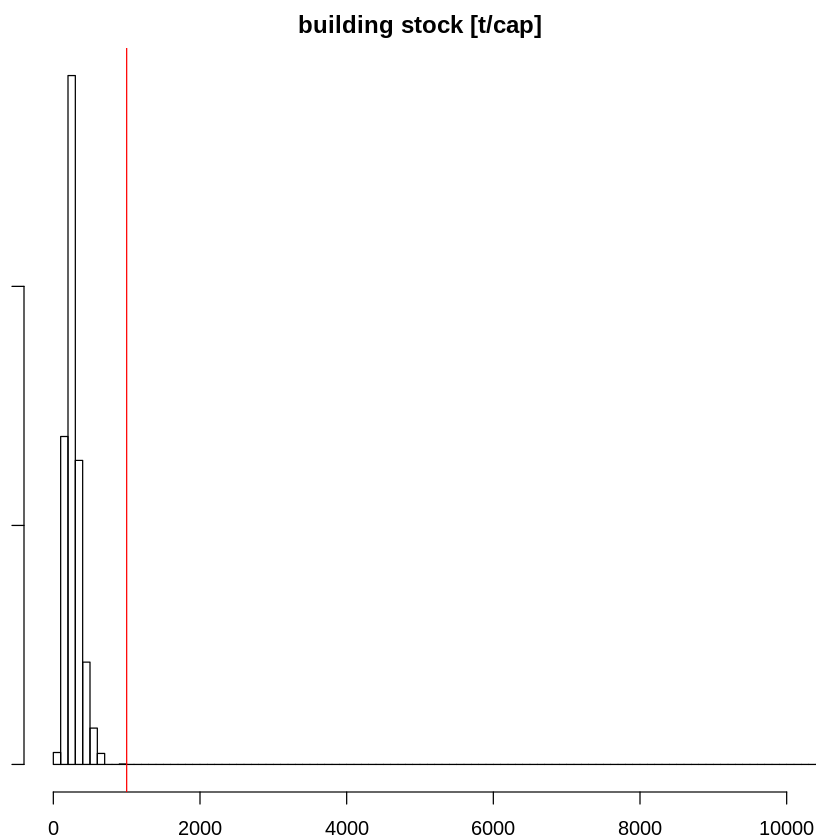

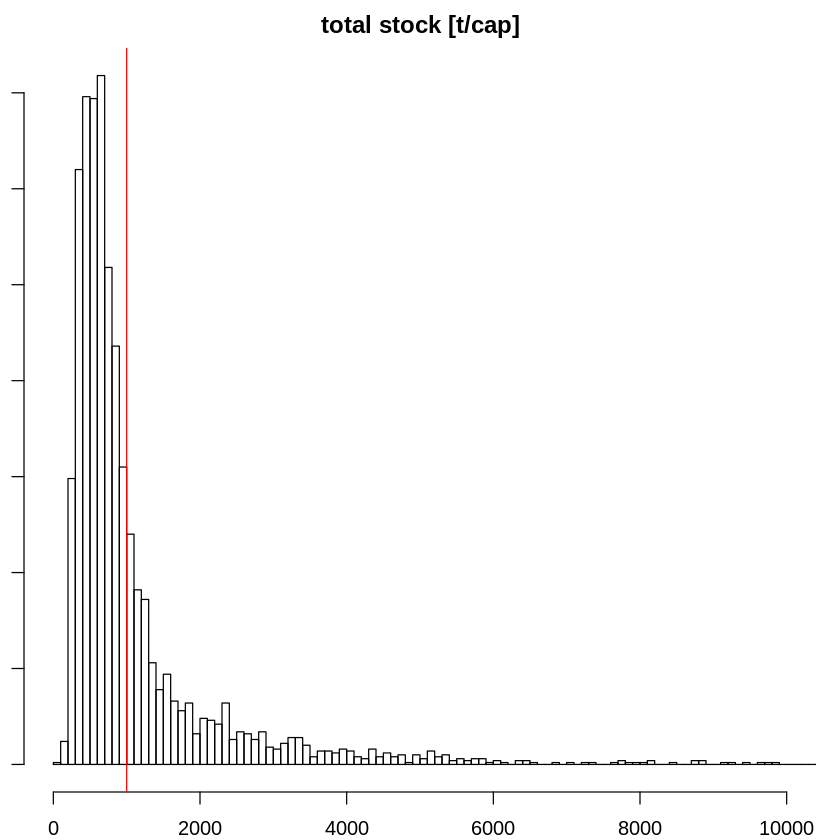

In [34]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2")

lab <- c("street stock [t/cap]", 
         "rail stock [t/cap]", 
         "other stock [t/cap]", 
         "building stock [t/cap]", 
         "total stock [t/cap]")

for (i in 1:length(names)){

    mai  <- c(0.4, 0.2, 0.4, 0.2)

    sf_ <- sf_pop

    par(mai = mai, cex = 1)

    hist(
        st_drop_geometry(sf_)[names[i]] %>% unlist(), 
        xlim = c(0, 10000),
        main = lab[i],
        breaks = seq(0, 1e5, 1e2))
    
    abline(v = 1000, col = 2)

}

#### range in t/km²

In [14]:
range(sf_area$mass_grand_t_10m2)

[1]     587.1032 4133673.9997

#### Histograms per area

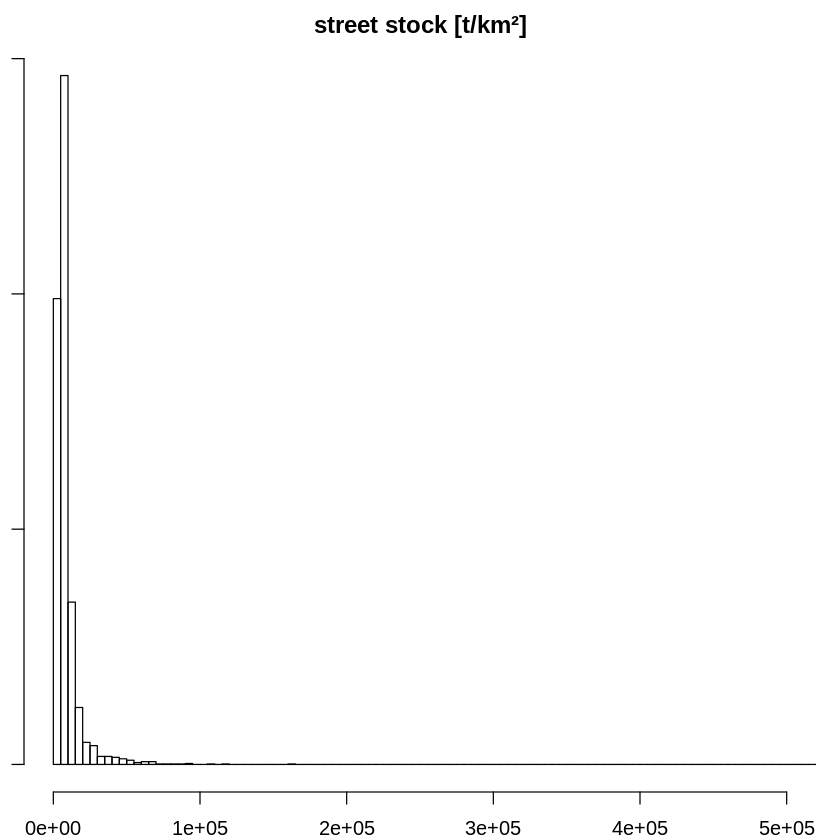

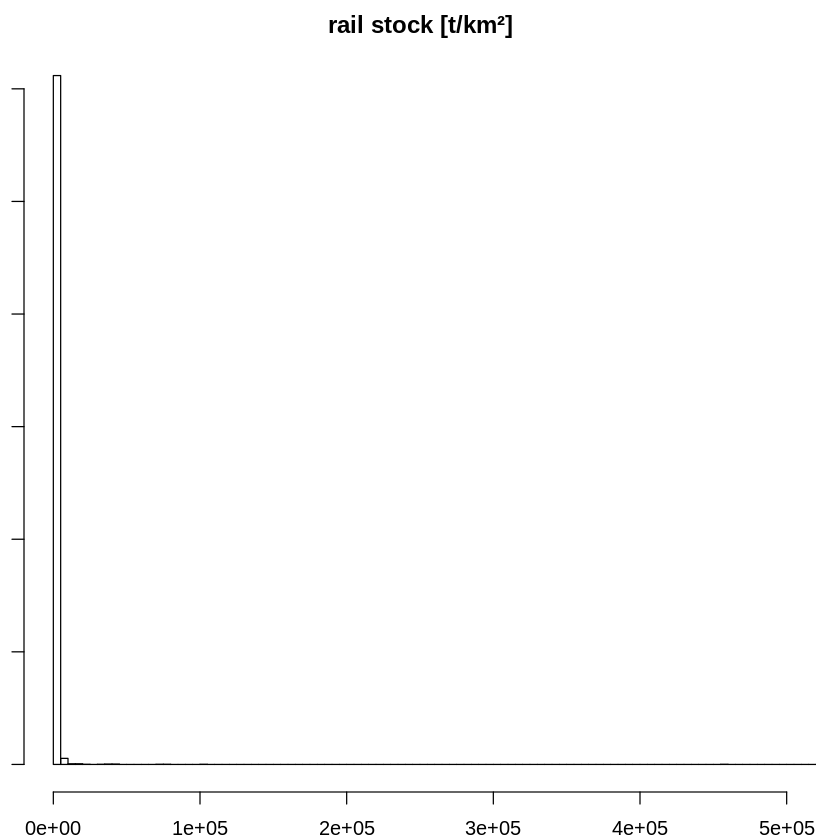

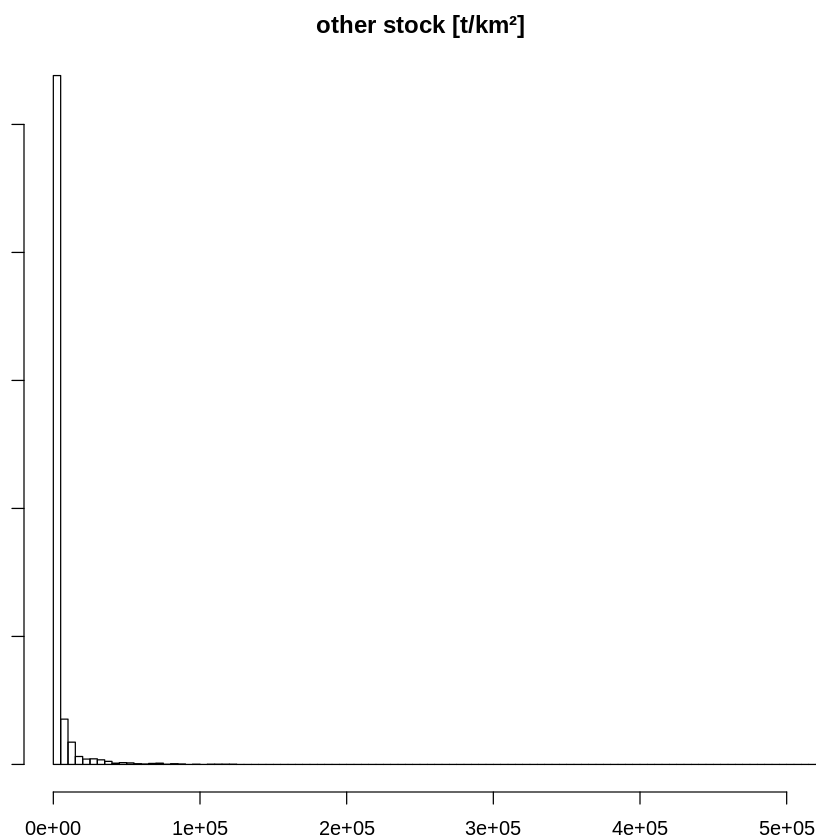

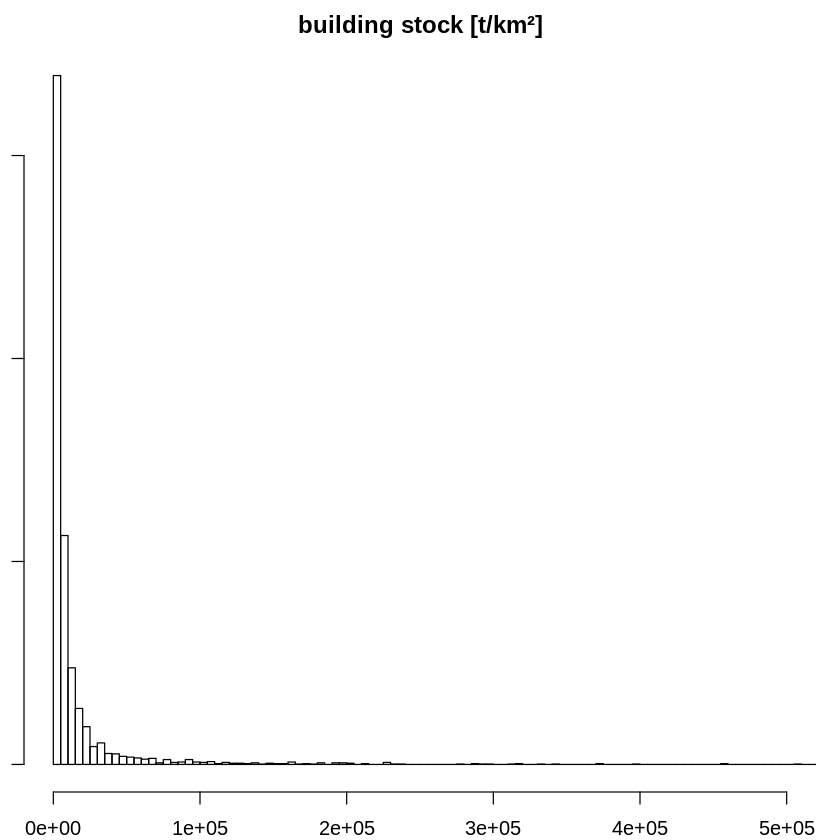

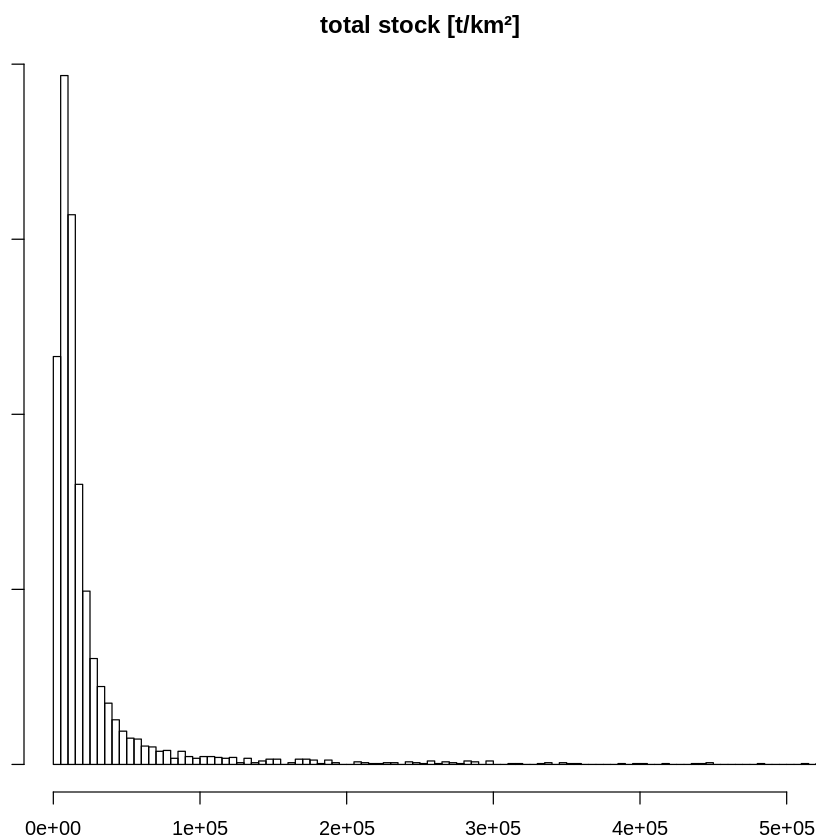

In [33]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2")

lab <- c("street stock [t/km²]", 
         "rail stock [t/km²]", 
         "other stock [t/km²]", 
         "building stock [t/km²]", 
         "total stock [t/km²]")

for (i in 1:length(names)){

    mai  <- c(0.4, 0.2, 0.4, 0.2)

    sf_ <- sf_area

    par(mai = mai, cex = 1)

    hist(
        st_drop_geometry(sf_)[names[i]] %>% unlist(), 
        xlim = c(0, 5e5),
        main = lab[i],
        breaks = seq(0, 5e6, 5e3))

}

## Population density of counties with more than 1000 t/cap

### mean population density USA
- Austria: 109 cap/km²
- Germany: 232 cap/km²
- USA:     33 cap/km²

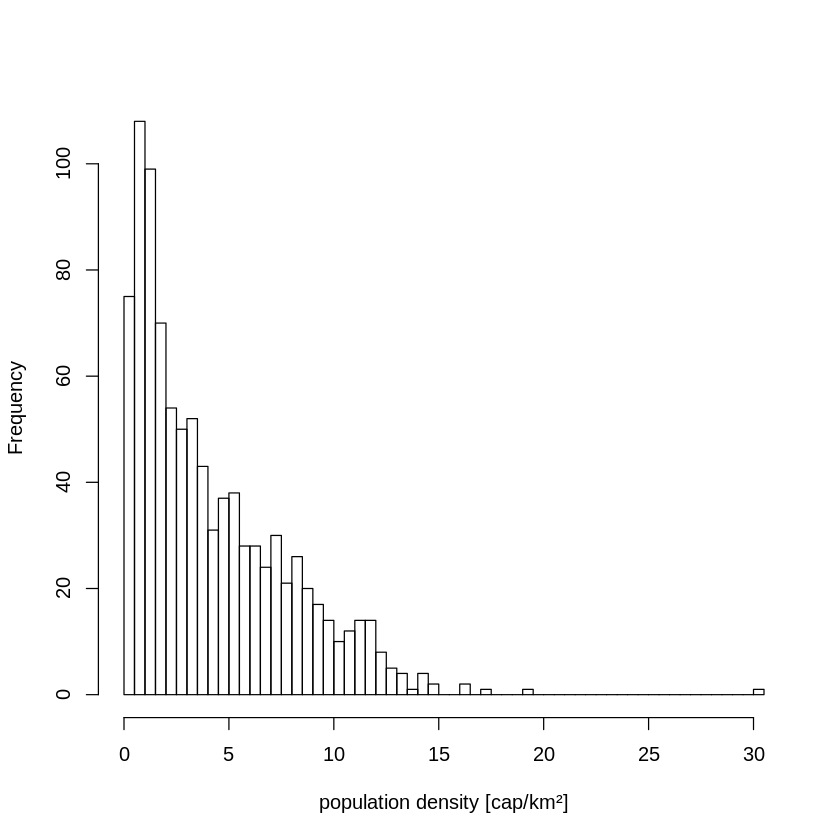

In [16]:
st_drop_geometry(sf_pop) %>% 
filter(mass_grand_t_10m2 > 1000) %>%
select(POP_PER_AREA) %>%
unlist() %>%
hist(breaks=100, 
     main = "",
     xlab = "population density [cap/km²]")
abline(v = 33, col = 4) # mean population density in USA
abline(v = 109, col = 2) # mean population density in Austria
abline(v = 232, col = 1) # mean population density in Germany

## Population density vs stocks per cap
Version 1: log-log plots


Call:
lm(formula = lsf_)

Residuals:
    Min      1Q  Median      3Q     Max 
-4.1839 -0.1586  0.0213  0.1729  1.4238 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)   7.72437    0.01090   708.7   <2e-16 ***
POP_PER_AREA -0.62604    0.00331  -189.1   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3157 on 3098 degrees of freedom
Multiple R-squared:  0.9203,	Adjusted R-squared:  0.9203 
F-statistic: 3.577e+04 on 1 and 3098 DF,  p-value: < 2.2e-16



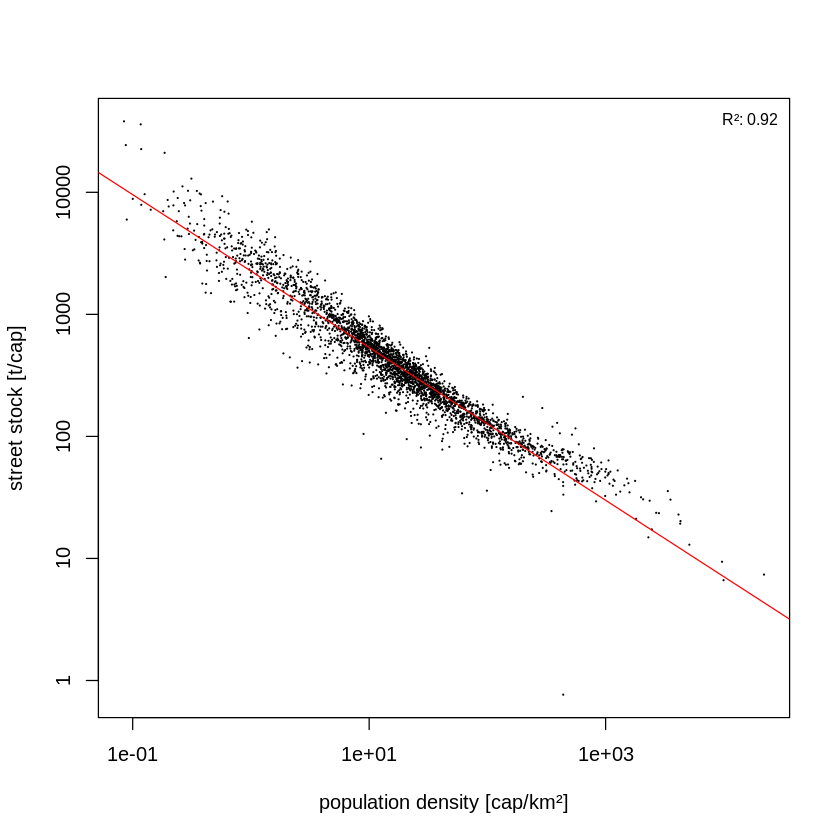


Call:
lm(formula = lsf_)

Residuals:
    Min      1Q  Median      3Q     Max 
-8.1597 -0.2856  0.2610  0.7445  3.7706 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)   4.46485    0.05258   84.92   <2e-16 ***
POP_PER_AREA -0.52020    0.01553  -33.49   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.384 on 2819 degrees of freedom
Multiple R-squared:  0.2847,	Adjusted R-squared:  0.2844 
F-statistic:  1122 on 1 and 2819 DF,  p-value: < 2.2e-16



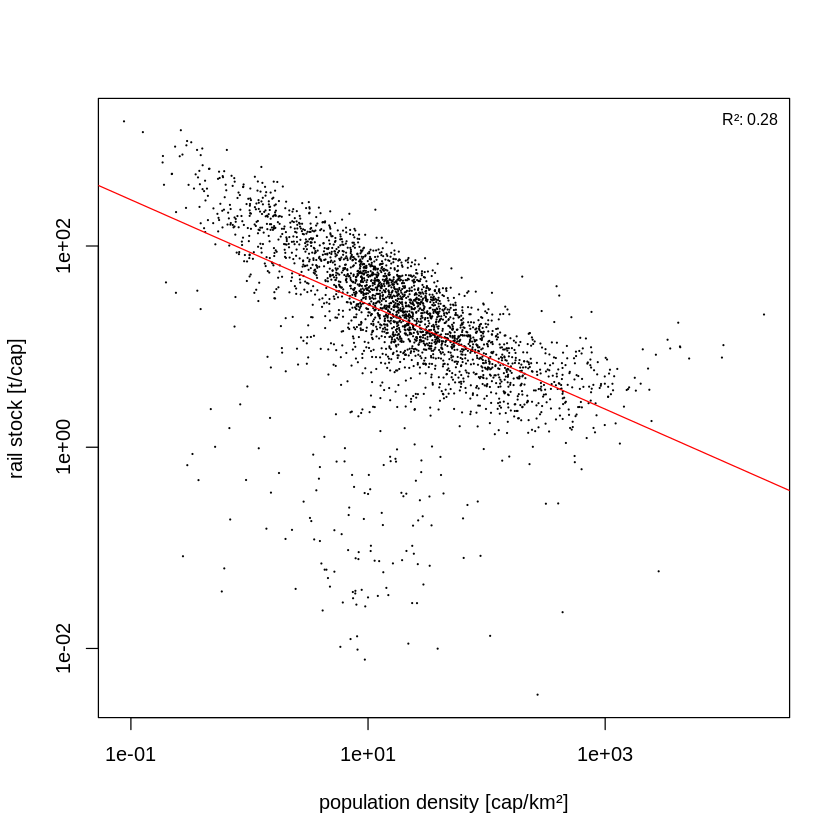


Call:
lm(formula = lsf_)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.0869 -0.3200  0.0306  0.3543  3.7364 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)   4.345484   0.018939  229.45   <2e-16 ***
POP_PER_AREA -0.139922   0.005747  -24.35   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5489 on 3100 degrees of freedom
Multiple R-squared:  0.1605,	Adjusted R-squared:  0.1603 
F-statistic: 592.8 on 1 and 3100 DF,  p-value: < 2.2e-16



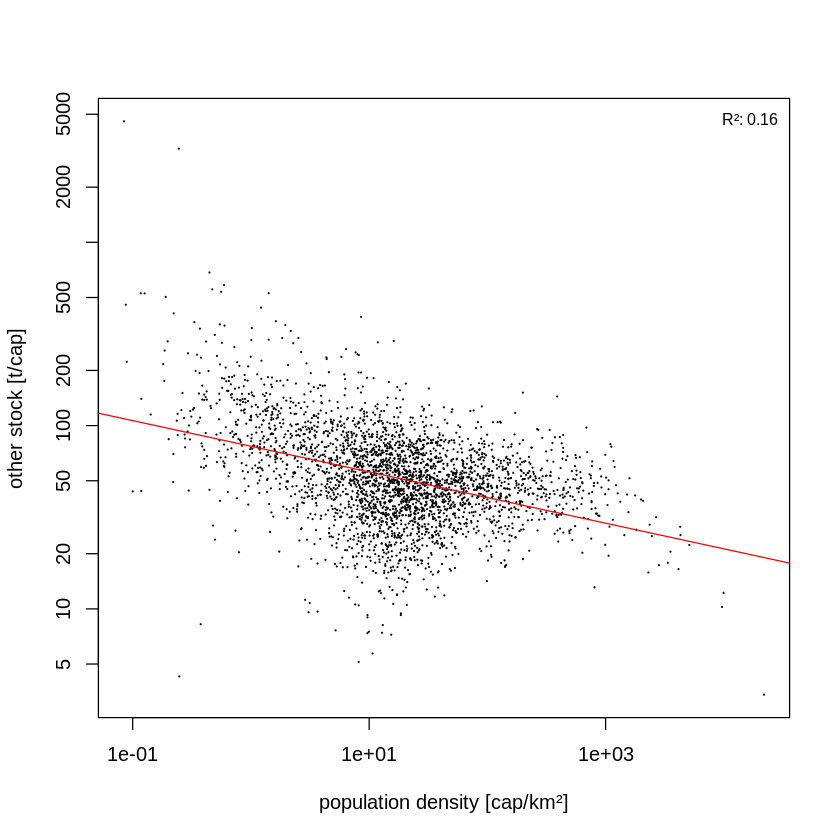


Call:
lm(formula = lsf_)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.39553 -0.20016  0.04175  0.21461  0.97985 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)   5.777626   0.011225  514.73   <2e-16 ***
POP_PER_AREA -0.084517   0.003406  -24.81   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3253 on 3100 degrees of freedom
Multiple R-squared:  0.1657,	Adjusted R-squared:  0.1654 
F-statistic: 615.7 on 1 and 3100 DF,  p-value: < 2.2e-16



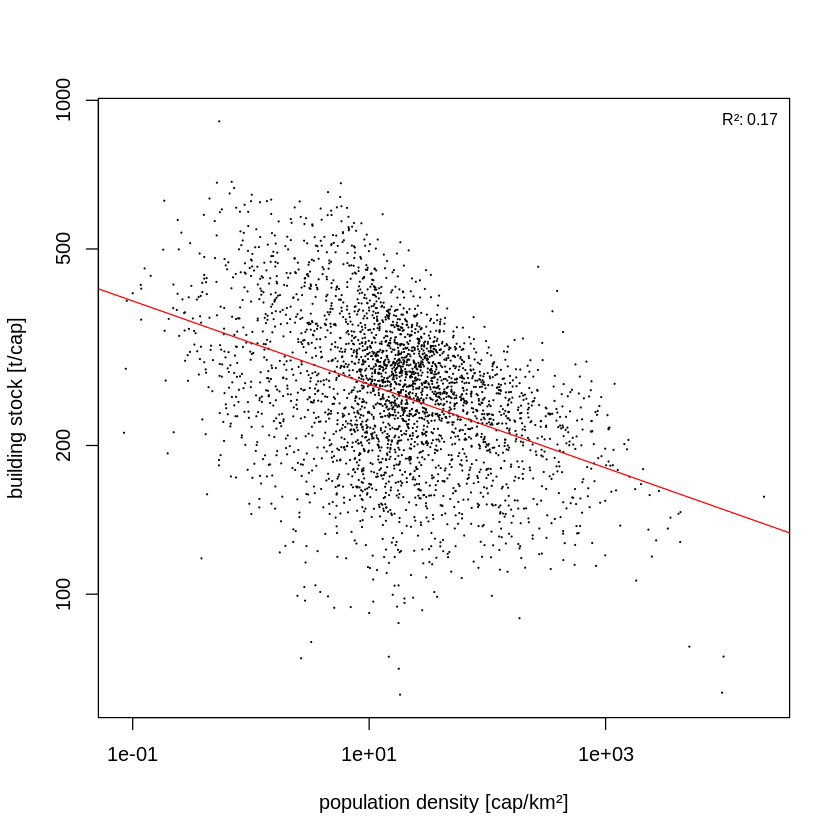


Call:
lm(formula = lsf_)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.00471 -0.18827 -0.01033  0.16345  1.86258 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)   7.817895   0.010701   730.6   <2e-16 ***
POP_PER_AREA -0.399163   0.003247  -122.9   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3101 on 3100 degrees of freedom
Multiple R-squared:  0.8298,	Adjusted R-squared:  0.8297 
F-statistic: 1.511e+04 on 1 and 3100 DF,  p-value: < 2.2e-16



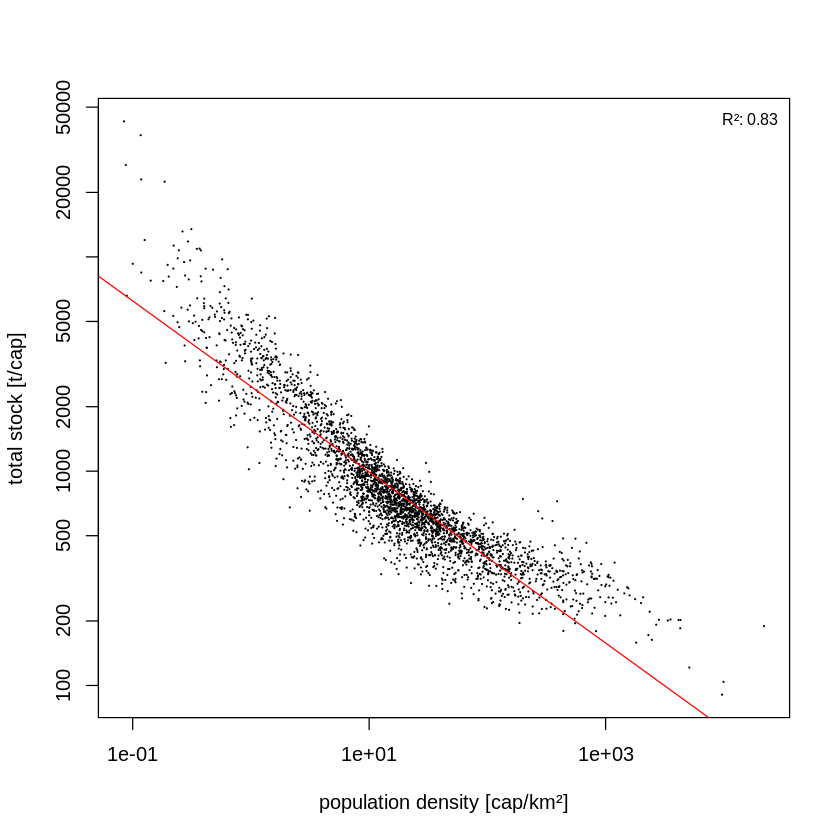


Call:
lm(formula = lsf_)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.1890 -0.1863  0.0505  0.2391  1.3194 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.63655    0.01252   210.5   <2e-16 ***
POP_PER_AREA  0.46394    0.00380   122.1   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.363 on 3100 degrees of freedom
Multiple R-squared:  0.8278,	Adjusted R-squared:  0.8278 
F-statistic: 1.491e+04 on 1 and 3100 DF,  p-value: < 2.2e-16



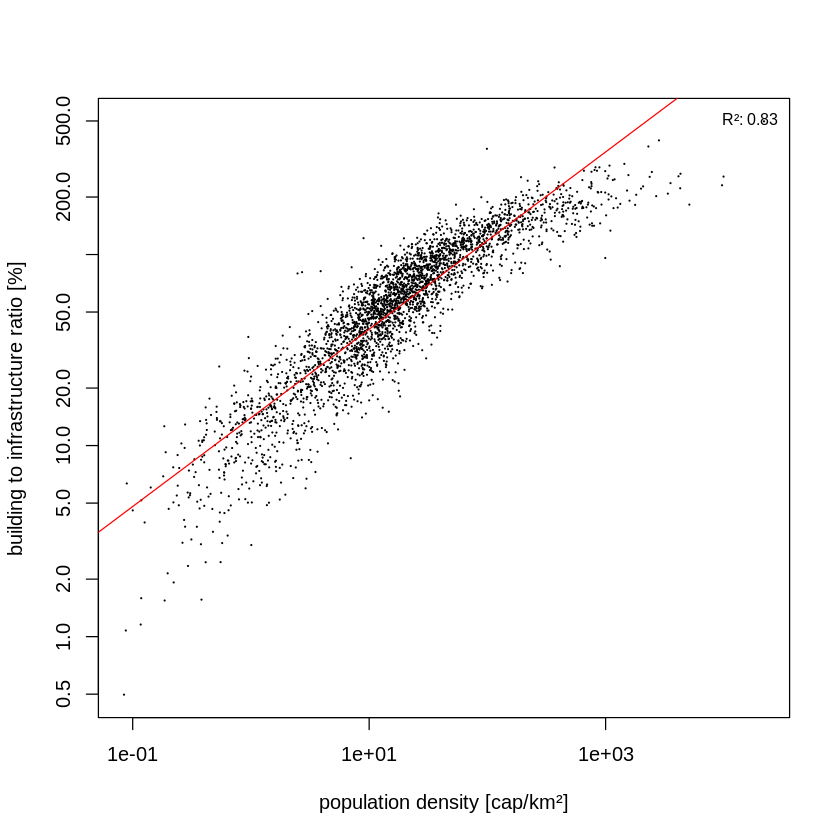

In [17]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t/cap]", 
         "rail stock [t/cap]", 
         "other stock [t/cap]", 
         "building stock [t/cap]", 
         "total stock [t/cap]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    st_drop_geometry(sf_pop) %>% 
    #filter(total > 1000) %>%
    select(POP_PER_AREA, names[i]) %>%
    filter(.data[[names[i]]] > 0) %>%
    plot(log = "xy", 
        xlab = "population density [cap/km²]",
        ylab = lab[i],
        pch = 19,
        cex = 0.1)
    #abline(v =  33, col = 4) # mean population density in USA
    #abline(v = 109, col = 2) # mean population density in Austria
    #abline(v = 232, col = 1) # mean population density in Germany

    lsf_ <- st_drop_geometry(sf_pop) %>% 
            select(names[i], POP_PER_AREA) %>%
            filter(.data[[names[i]]] > 0) %>%
            mutate(across(where(is.numeric), log))

    mod <- lm(lsf_)
    summary(mod) %>% print()

    line <- data.frame(POP_PER_AREA = seq(-1e2,1e2,0.1))
    predict(mod, newdata = line) %>% exp() %>%
    lines(exp(line$POP_PER_AREA), ., col = "red")

    legend("topright", legend = sprintf("R²: %.2f", summary(mod)$r.squared), bty = "n", cex = 0.8)

}

## Population density vs stocks per cap
Version 2: no log plots (just for completeness)

In [ ]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t/cap]", 
         "rail stock [t/cap]", 
         "other stock [t/cap]", 
         "building stock [t/cap]", 
         "total stock [t/cap]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    st_drop_geometry(sf_pop) %>% 
    select(POP_PER_AREA, names[i]) %>%
    plot(log = "", 
        xlab = "population density [cap/km²]",
        ylab = lab[i],
        pch = 19,
        cex = 0.1)
    #abline(v =  33, col = 4) # mean population density in USA
    #abline(v = 109, col = 2) # mean population density in Austria
    #abline(v = 232, col = 1) # mean population density in Germany

    lsf_ <- st_drop_geometry(sf_pop) %>% 
            select(names[i], POP_PER_AREA) #%>%
            #filter(.data[[names[i]]] > 0) #%>%
            #mutate(across(where(is.numeric), log))

    mod <- lm(lsf_)
    abline(mod, col = "red")
    summary(mod) %>% print()

    #line <- data.frame(POP_PER_AREA = seq(-1e2,1e2,0.1))
    #predict(mod, newdata = line) %>% #exp() %>%
    #lines(exp(line$POP_PER_AREA), ., col = "red")

    legend("topright", legend = sprintf("R²: %.2f", summary(mod)$r.squared), bty = "n", cex = 0.8)

}

## Population density vs stocks per area
Version 1: log-log plots


Call:
lm(formula = lsf_)

Residuals:
    Min      1Q  Median      3Q     Max 
-4.1839 -0.1586  0.0213  0.1729  1.4238 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)   7.72437    0.01090   708.7   <2e-16 ***
POP_PER_AREA  0.37396    0.00331   113.0   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3157 on 3098 degrees of freedom
Multiple R-squared:  0.8047,	Adjusted R-squared:  0.8046 
F-statistic: 1.276e+04 on 1 and 3098 DF,  p-value: < 2.2e-16



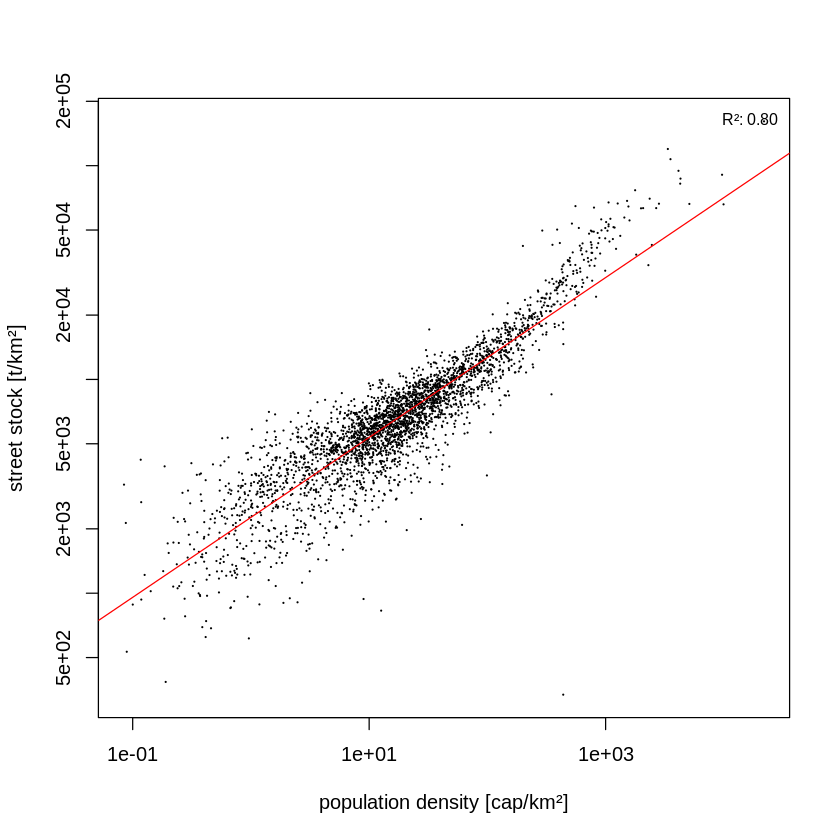


Call:
lm(formula = lsf_)

Residuals:
    Min      1Q  Median      3Q     Max 
-8.1597 -0.2856  0.2610  0.7445  3.7706 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)   4.46485    0.05258   84.92   <2e-16 ***
POP_PER_AREA  0.47980    0.01553   30.89   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.384 on 2819 degrees of freedom
Multiple R-squared:  0.2529,	Adjusted R-squared:  0.2526 
F-statistic: 954.3 on 1 and 2819 DF,  p-value: < 2.2e-16



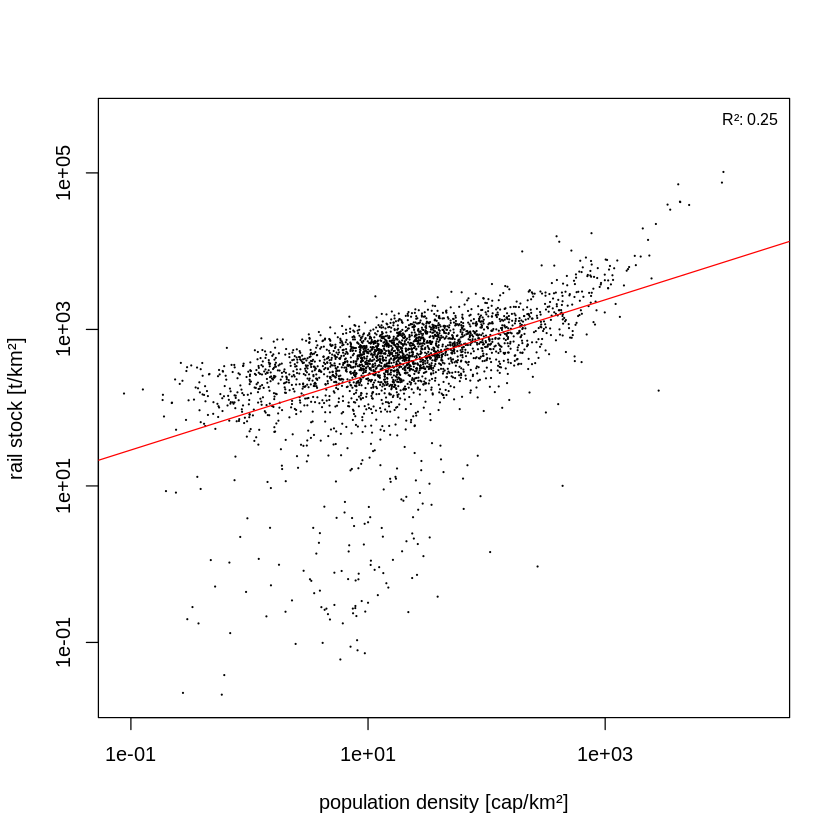


Call:
lm(formula = lsf_)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.0869 -0.3200  0.0306  0.3543  3.7364 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  4.345484   0.018939   229.4   <2e-16 ***
POP_PER_AREA 0.860078   0.005747   149.7   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5489 on 3100 degrees of freedom
Multiple R-squared:  0.8784,	Adjusted R-squared:  0.8784 
F-statistic: 2.24e+04 on 1 and 3100 DF,  p-value: < 2.2e-16



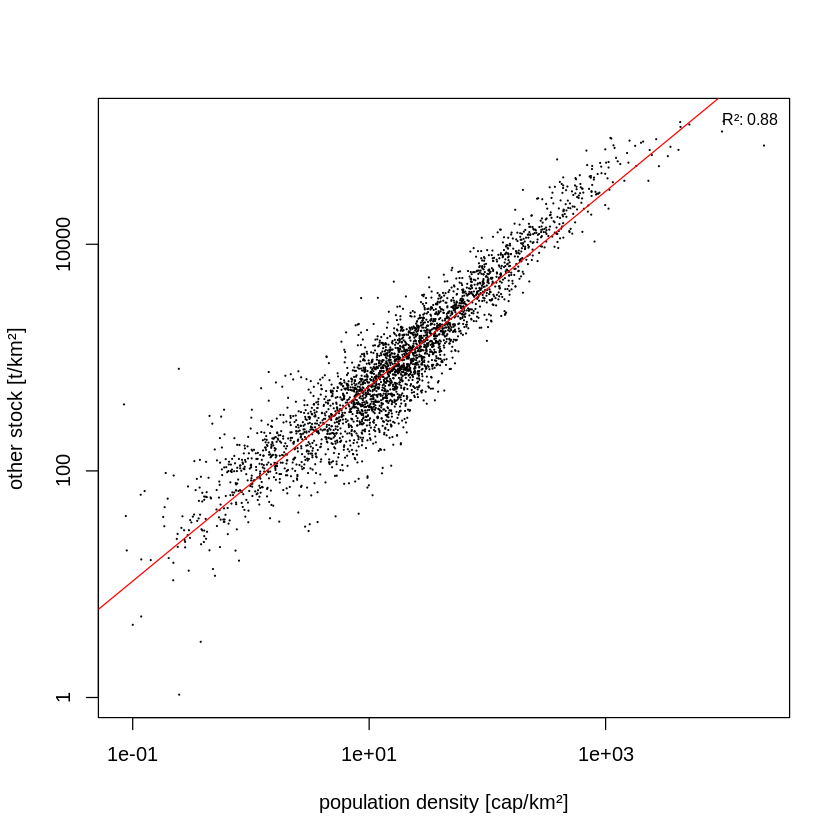


Call:
lm(formula = lsf_)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.39553 -0.20016  0.04175  0.21461  0.97985 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.777626   0.011225   514.7   <2e-16 ***
POP_PER_AREA 0.915483   0.003406   268.8   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3253 on 3100 degrees of freedom
Multiple R-squared:  0.9589,	Adjusted R-squared:  0.9588 
F-statistic: 7.224e+04 on 1 and 3100 DF,  p-value: < 2.2e-16



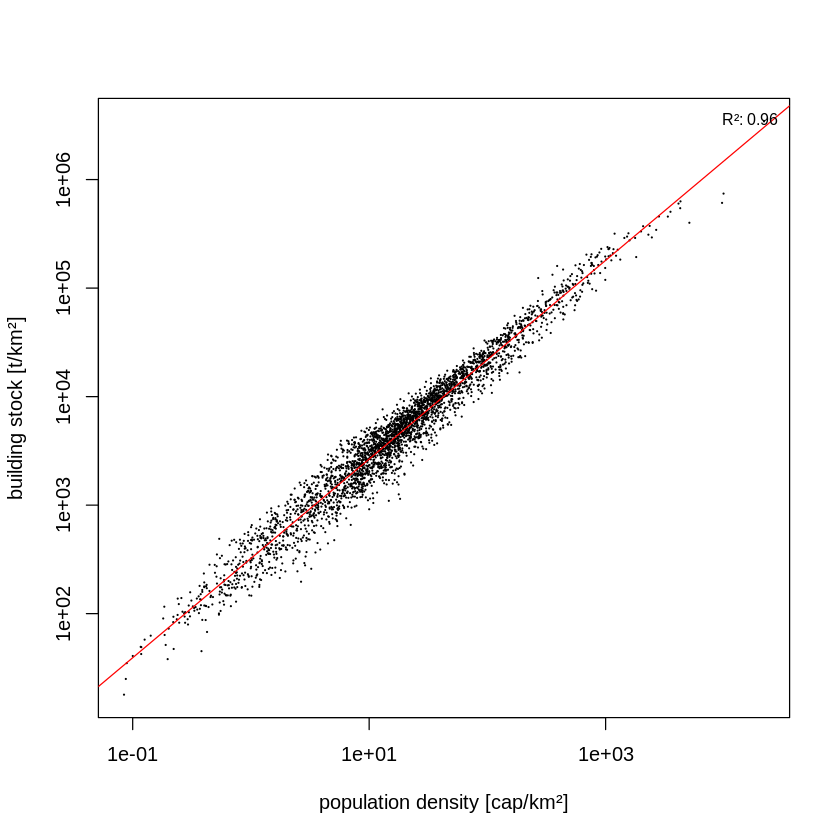


Call:
lm(formula = lsf_)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.00471 -0.18827 -0.01033  0.16345  1.86258 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  7.817895   0.010701   730.6   <2e-16 ***
POP_PER_AREA 0.600837   0.003247   185.0   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3101 on 3100 degrees of freedom
Multiple R-squared:  0.917,	Adjusted R-squared:  0.9169 
F-statistic: 3.424e+04 on 1 and 3100 DF,  p-value: < 2.2e-16



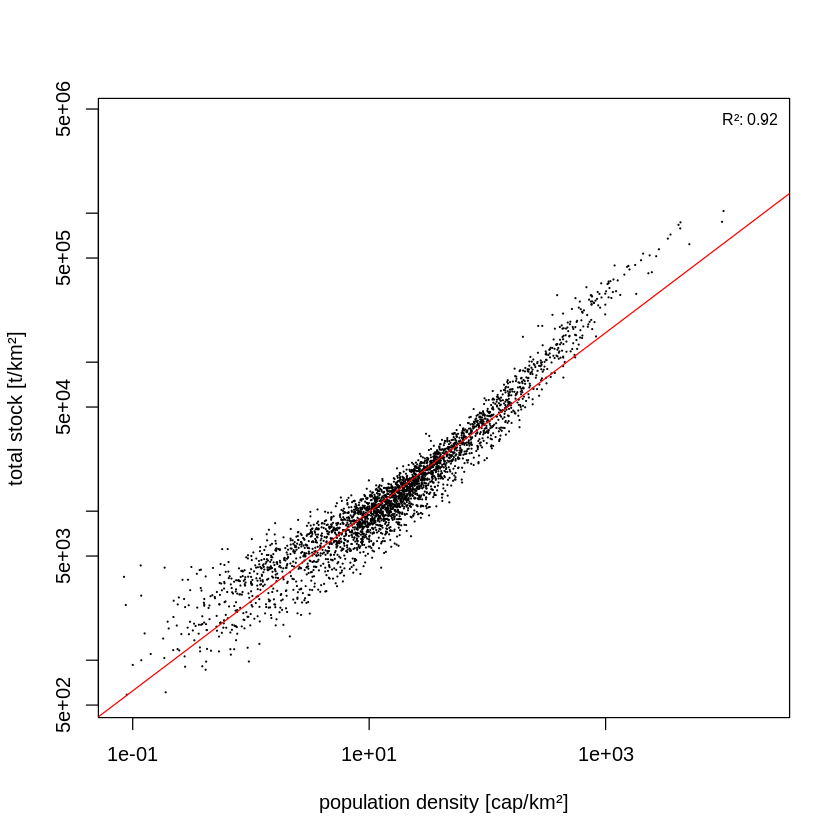


Call:
lm(formula = lsf_)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.1890 -0.1863  0.0505  0.2391  1.3194 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.63655    0.01252   210.5   <2e-16 ***
POP_PER_AREA  0.46394    0.00380   122.1   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.363 on 3100 degrees of freedom
Multiple R-squared:  0.8278,	Adjusted R-squared:  0.8278 
F-statistic: 1.491e+04 on 1 and 3100 DF,  p-value: < 2.2e-16



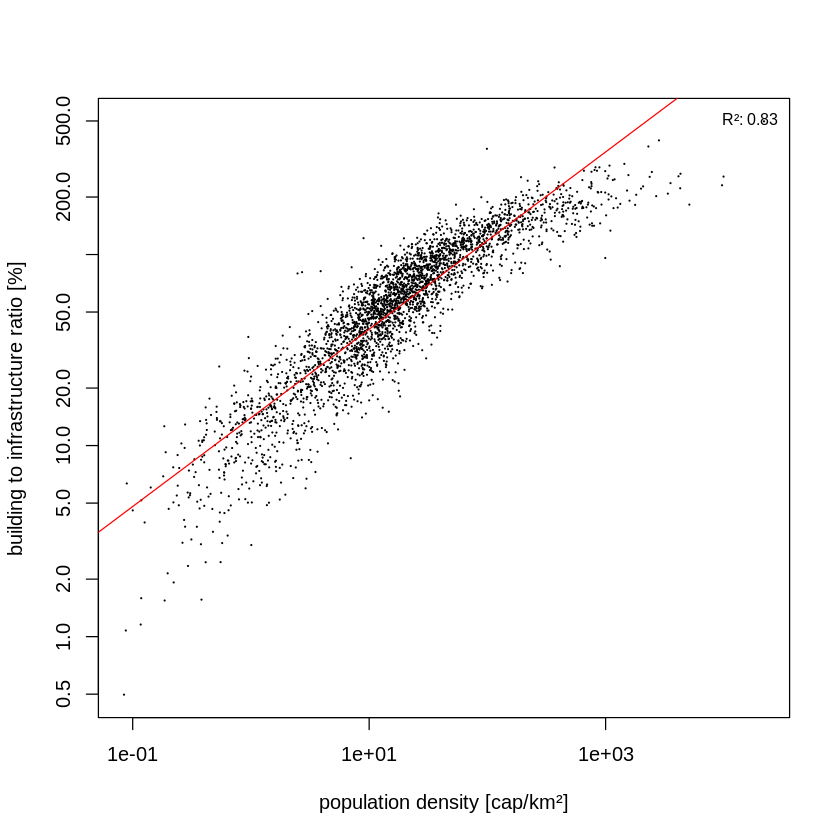

In [19]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t/km²]", 
         "rail stock [t/km²]", 
         "other stock [t/km²]", 
         "building stock [t/km²]", 
         "total stock [t/km²]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    st_drop_geometry(sf_area) %>% 
    select(POP_PER_AREA, names[i]) %>%
    filter(.data[[names[i]]] > 0) %>%
    plot(log = "xy", 
        xlab = "population density [cap/km²]",
        ylab = lab[i],
        pch = 19,
        cex = 0.1)
    #abline(v =  33, col = 4) # mean population density in USA
    #abline(v = 109, col = 2) # mean population density in Austria
    #abline(v = 232, col = 1) # mean population density in Germany

    lsf_ <- st_drop_geometry(sf_area) %>% 
            select(names[i], POP_PER_AREA) %>%
            filter(.data[[names[i]]] > 0) %>%
            mutate(across(where(is.numeric), log))

    mod <- lm(lsf_)
    summary(mod) %>% print()

    line <- data.frame(POP_PER_AREA = seq(-1e2,1e2,0.1))
    predict(mod, newdata = line) %>% exp() %>%
    lines(exp(line$POP_PER_AREA), ., col = "red")

    legend("topright", legend = sprintf("R²: %.2f", summary(mod)$r.squared), bty = "n", cex = 0.8)

}

## Population density vs stocks per area
Version 2: no log plots (just for completeness)

In [ ]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t/km²]", 
         "rail stock [t/km²]", 
         "other stock [t/km²]", 
         "building stock [t/km²]", 
         "total stock [t/km²]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    st_drop_geometry(sf_area) %>% 
    select(POP_PER_AREA, names[i]) %>%
    plot(log = "", 
        xlab = "population density [cap/km²]",
        ylab = lab[i],
        pch = 19,
        cex = 0.1)
    #abline(v =  33, col = 4) # mean population density in USA
    #abline(v = 109, col = 2) # mean population density in Austria
    #abline(v = 232, col = 1) # mean population density in Germany

    lsf_ <- st_drop_geometry(sf_area) %>% 
            select(names[i], POP_PER_AREA) #%>%
            #filter(.data[[names[i]]] > 1) #%>%
            #mutate(across(where(is.numeric), log))

    mod <- lm(lsf_)
    summary(mod) %>% print()
    abline(mod, col = "red")

    #line <- data.frame(POP_PER_AREA = seq(-1e2,1e2,0.1))
    #predict(mod, newdata = line) %>% exp() %>%
    #lines(exp(line$POP_PER_AREA), ., col = "red")

    legend("topright", legend = sprintf("R²: %.2f", summary(mod)$r.squared), bty = "n", cex = 0.8)

}

## Dorling Plots

#### Maps for absolute stocks in t
Caution: depends on county size

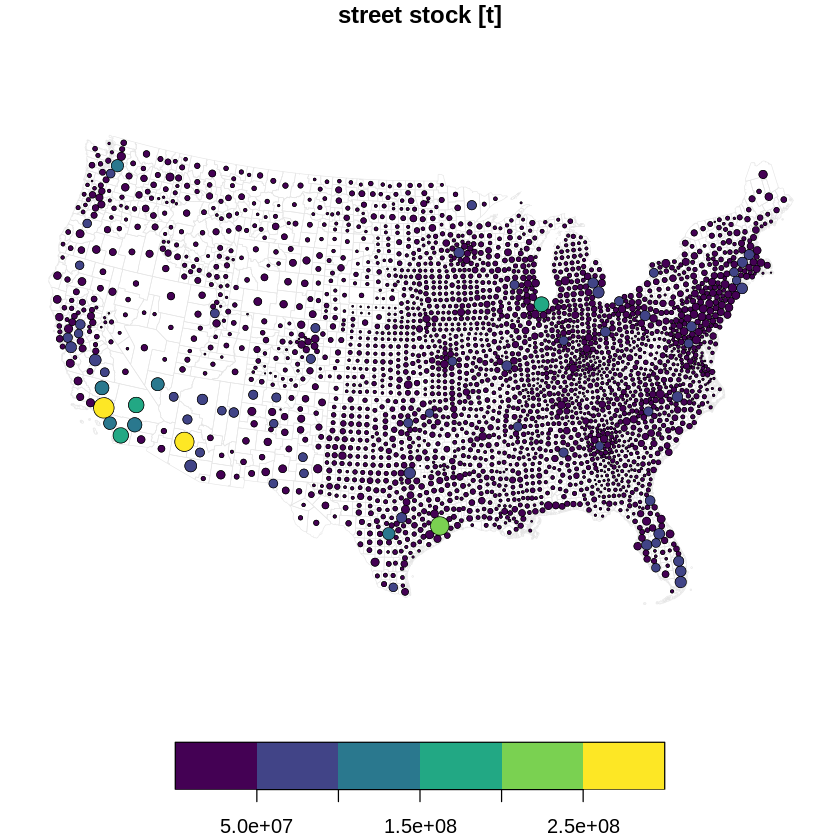

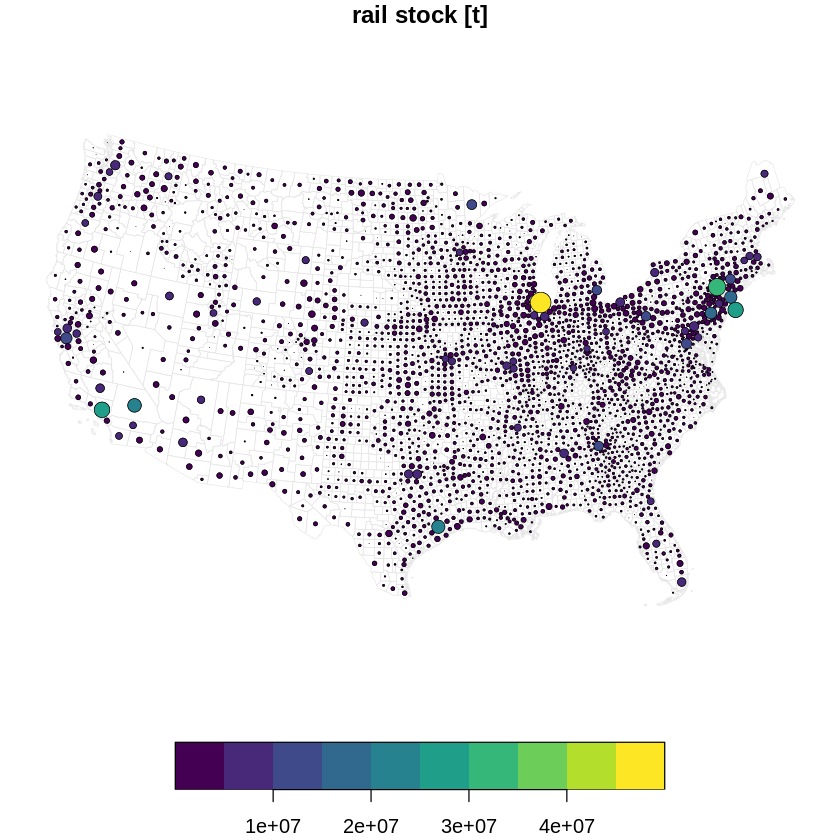

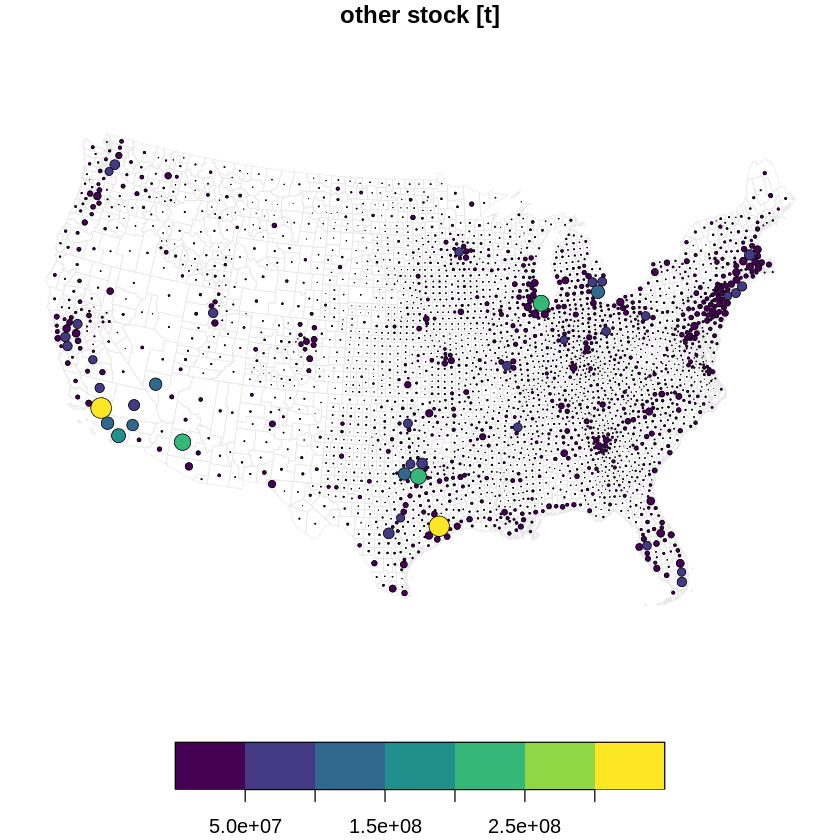

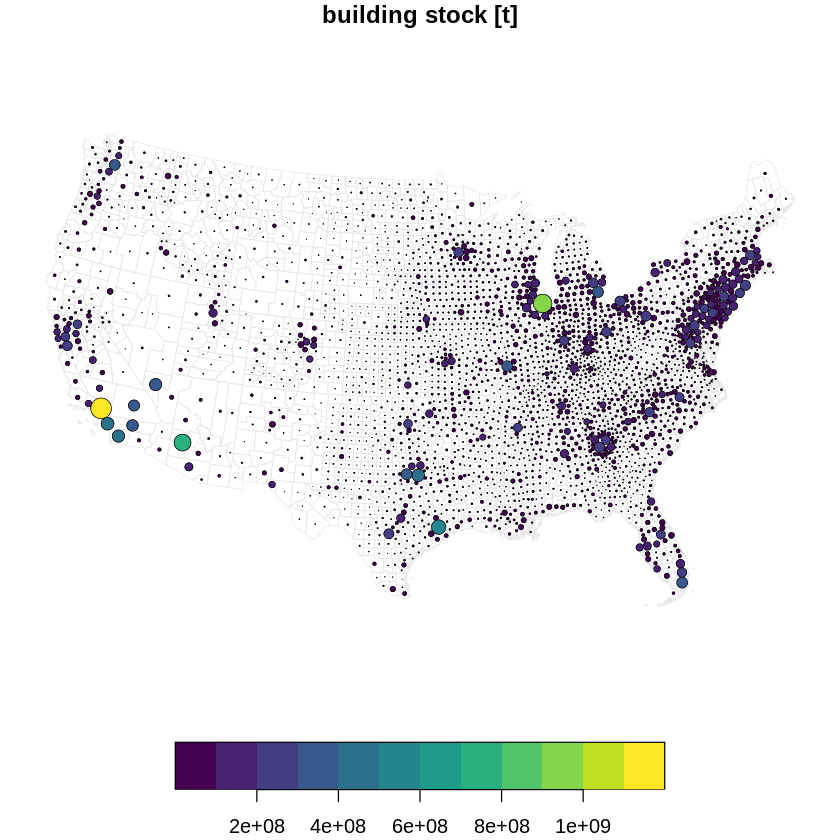

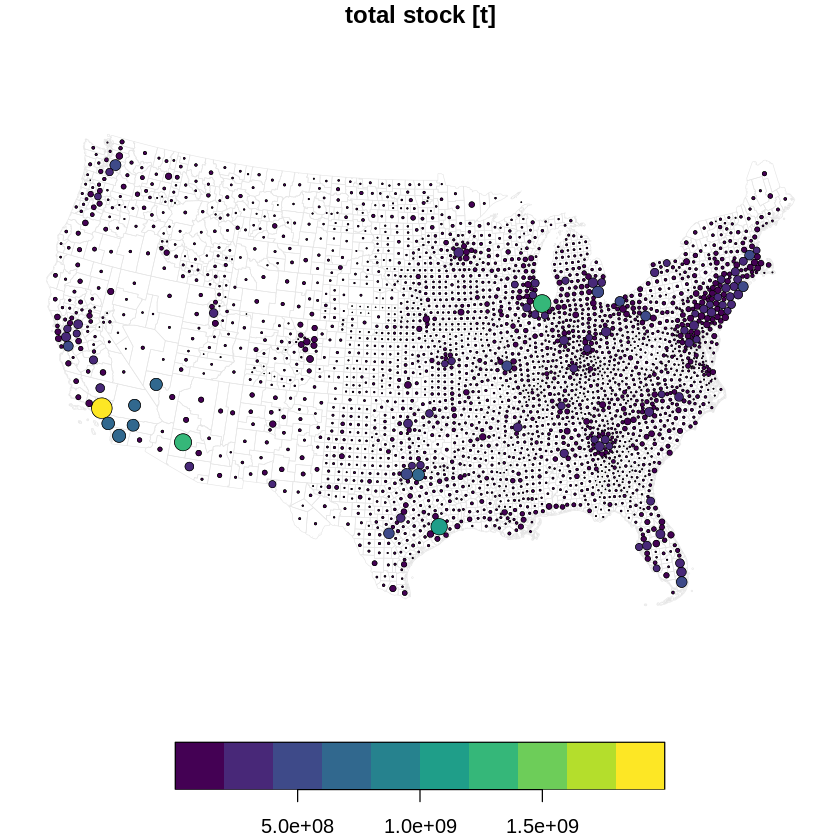

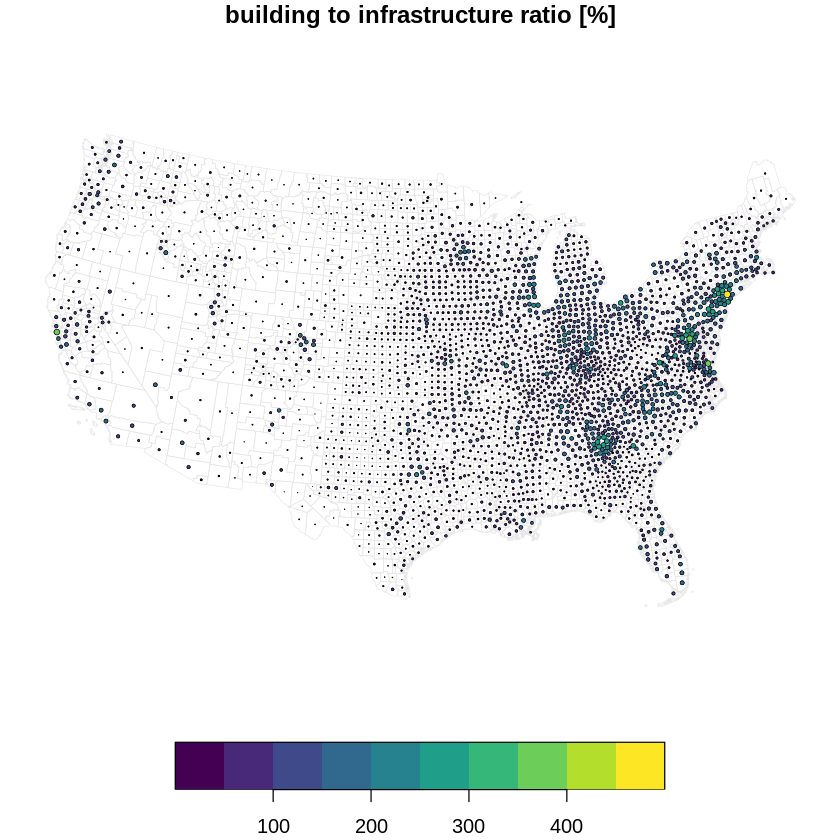

In [35]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t]", 
         "rail stock [t]", 
         "other stock [t]", 
         "building stock [t]", 
         "total stock [t]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    #mai  <- c(0.4, 0.2, 0.4, 0.2)
    
    sf_ <- sf

    #    tiff(file.path(dplot, sprintf("%s-tons-k%.1f.tif", name, k)),
    #    width = 8.8, height = 6, units = "cm", pointsize = 8,
    #    compression = "lzw", res = 600, type = "cairo", antialias = "subpixel")

    #par(mai = mai, cex = 1)

    if (sf_ %>% 
        st_drop_geometry %>% 
        select(names[i]) %>% 
        skewness() < 3) k <- 0.01 else k <- 0.1

    dor <- cartogram_dorling(sf_, names[i], k = k)
    plot(dor[names[i]], pal = viridis, key.width = 0.15,
        main = lab[i], reset = FALSE, lwd = 0.5)
    plot(st_geometry(sf_), border = "grey90", add = TRUE, lwd = 0.5)
    plot(dor[names[i]], pal = viridis, add = TRUE, lwd = 0.5)

    #    dev.off()

}

#### Maps for stocks per area
Higher for city-counties

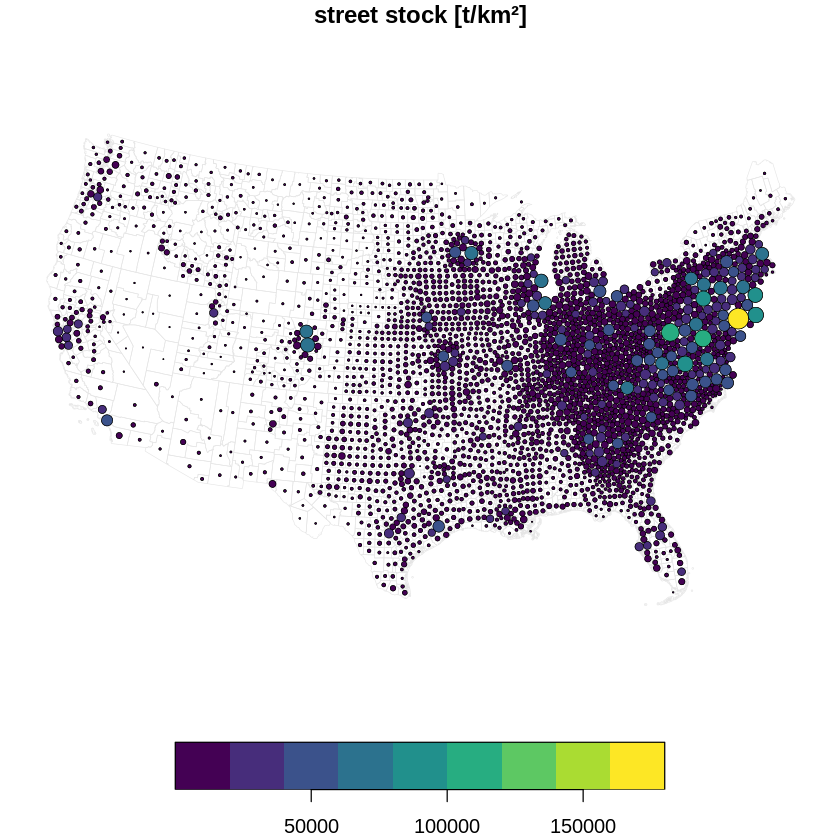

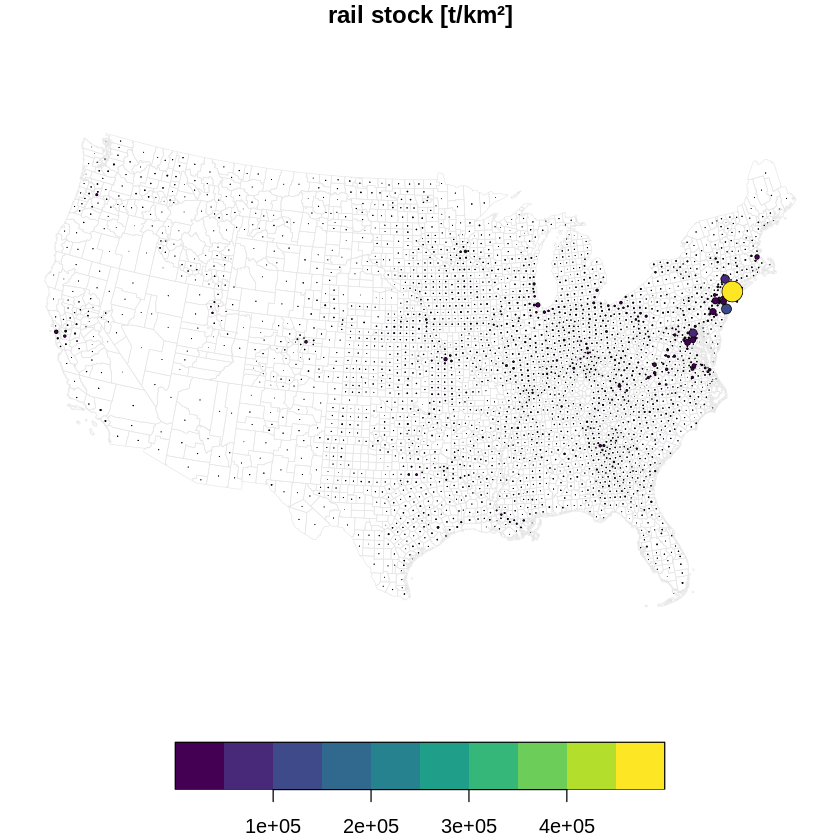

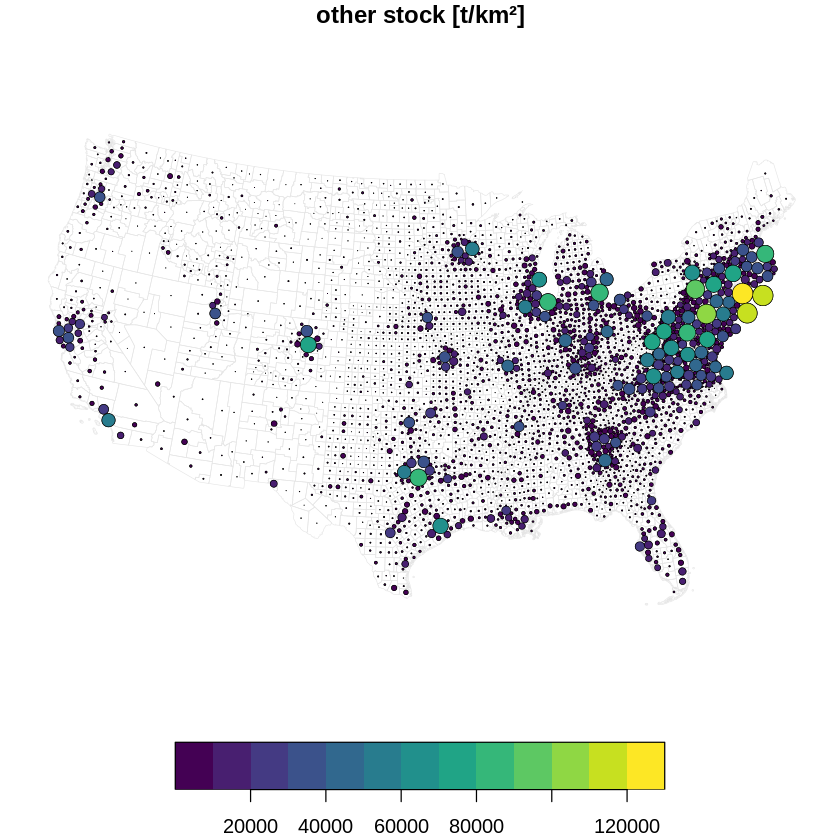

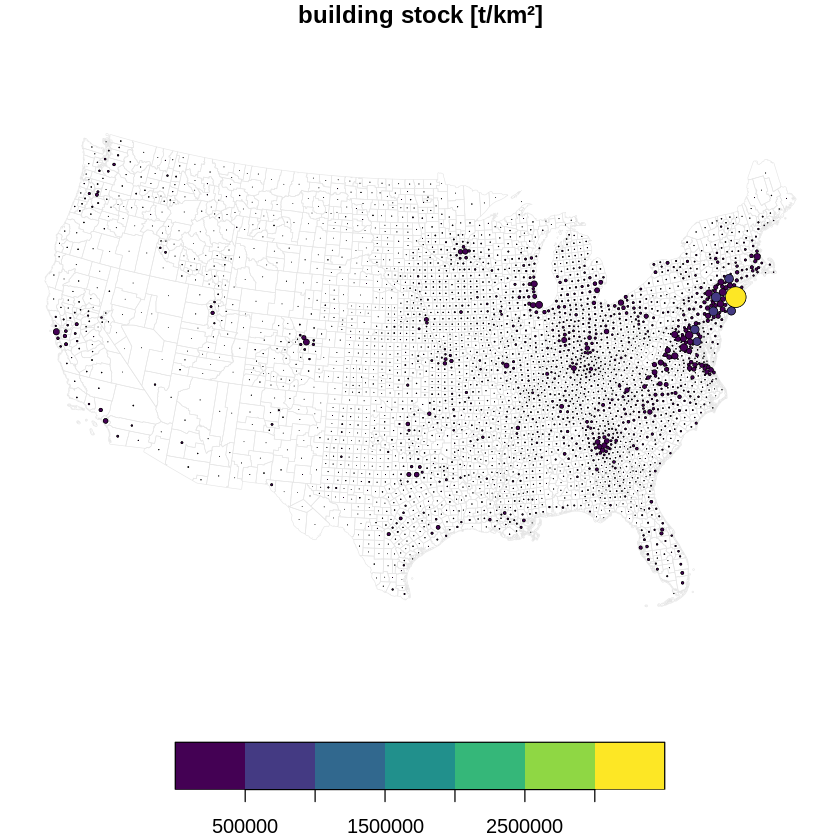

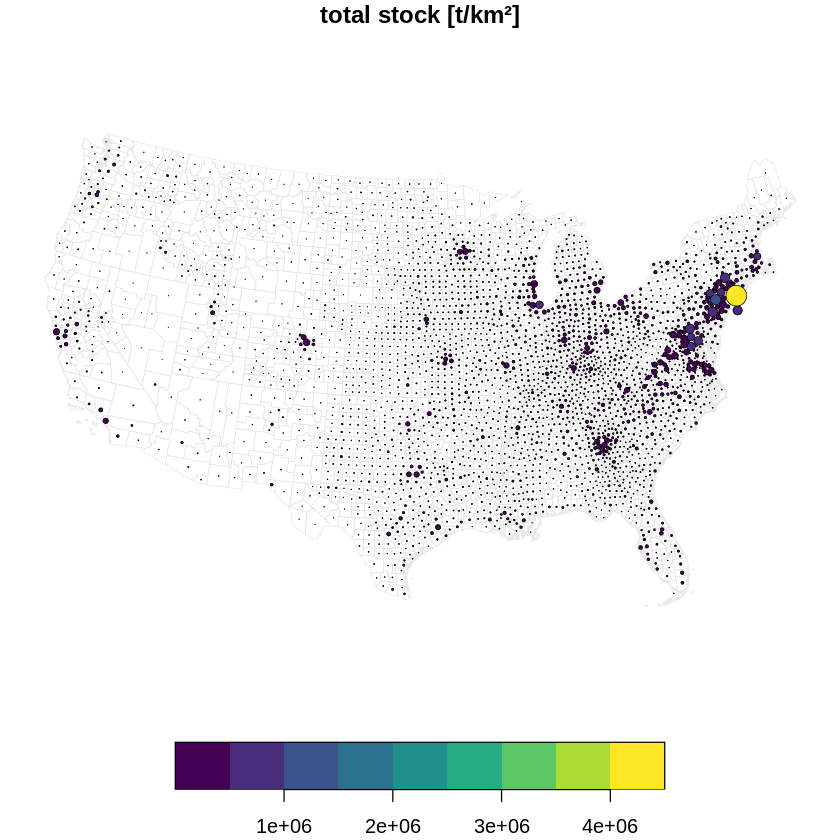

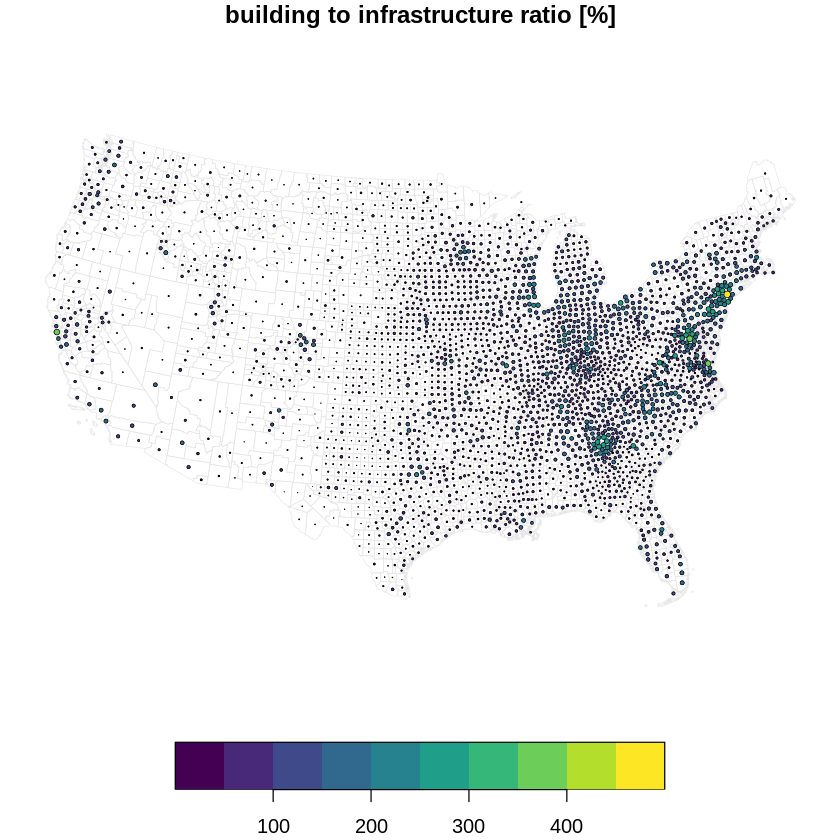

In [36]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t/km²]", 
         "rail stock [t/km²]", 
         "other stock [t/km²]", 
         "building stock [t/km²]", 
         "total stock [t/km²]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    #mai  <- c(0.4, 0.2, 0.4, 0.2)

    sf_ <- sf_area

    #    tiff(file.path(dplot, sprintf("%s-tons-k%.1f.tif", name, k)),
    #    width = 8.8, height = 6, units = "cm", pointsize = 8,
    #    compression = "lzw", res = 600, type = "cairo", antialias = "subpixel")

    #par(mai = mai, cex = 1)

    if (sf_ %>% 
        st_drop_geometry %>% 
        select(names[i]) %>% 
        skewness() < 3) k <- 0.01 else k <- 0.1

    dor <- cartogram_dorling(sf_, names[i], k = k)
    plot(dor[names[i]], pal = viridis, key.width = 0.15,
        main = lab[i], reset = FALSE, lwd = 0.5)
    plot(st_geometry(sf_), border = "grey90", add = TRUE, lwd = 0.5)
    plot(dor[names[i]], pal = viridis, add = TRUE, lwd = 0.5)

    #    dev.off()

}

#### Maps for stocks per cap
Lower for city-counties

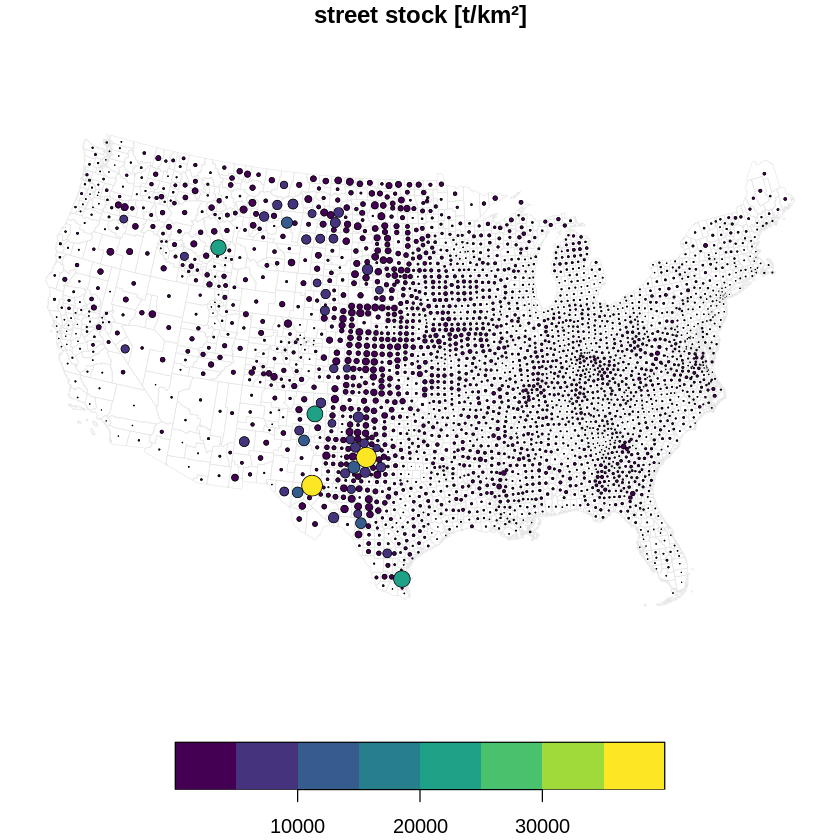

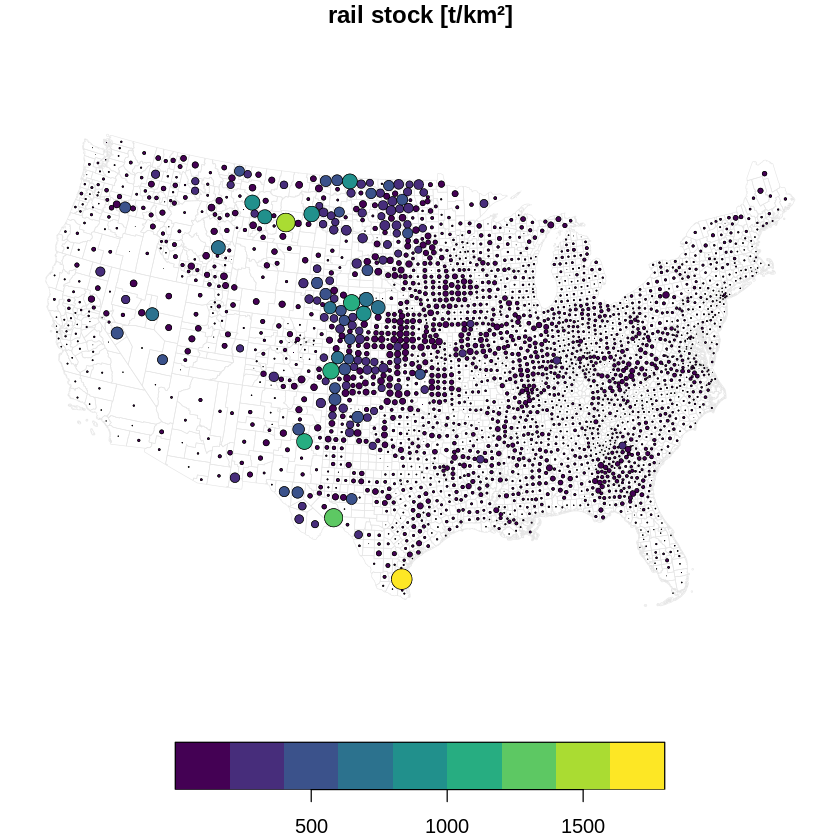

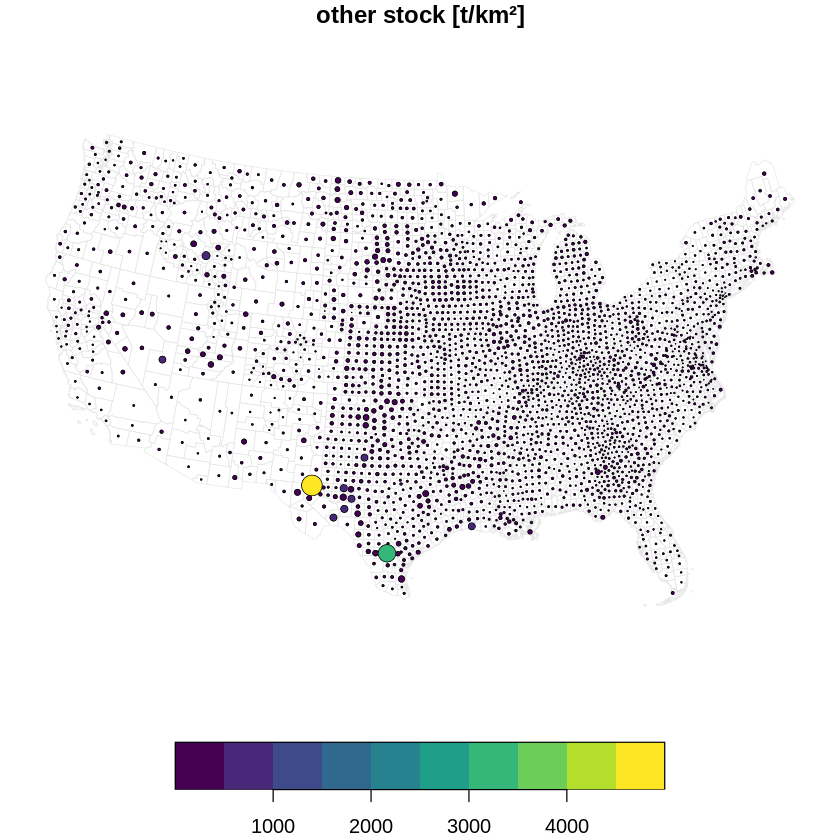

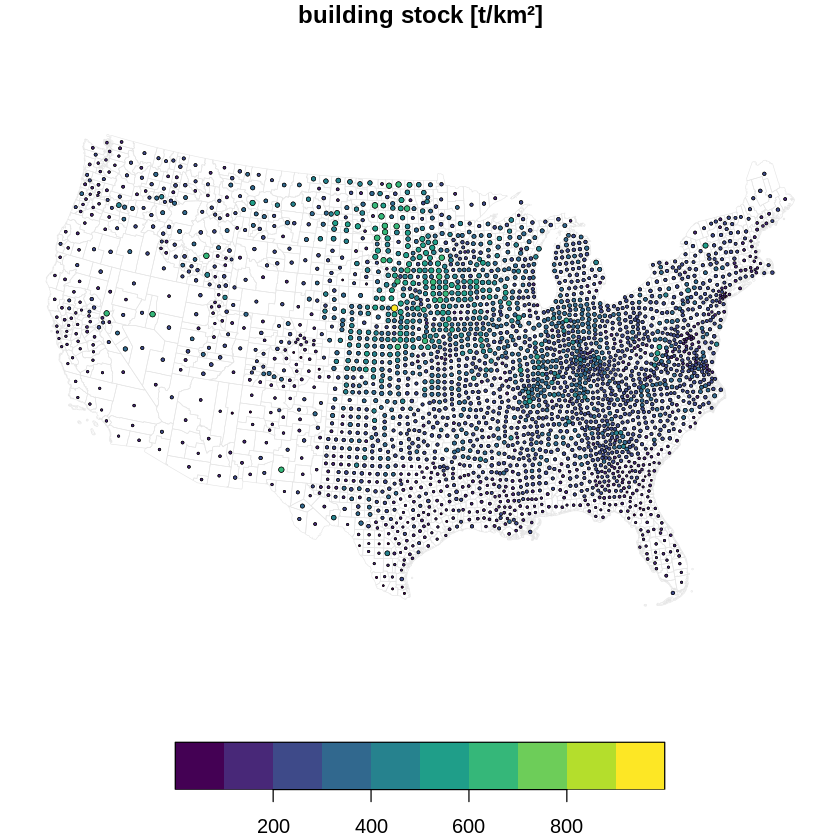

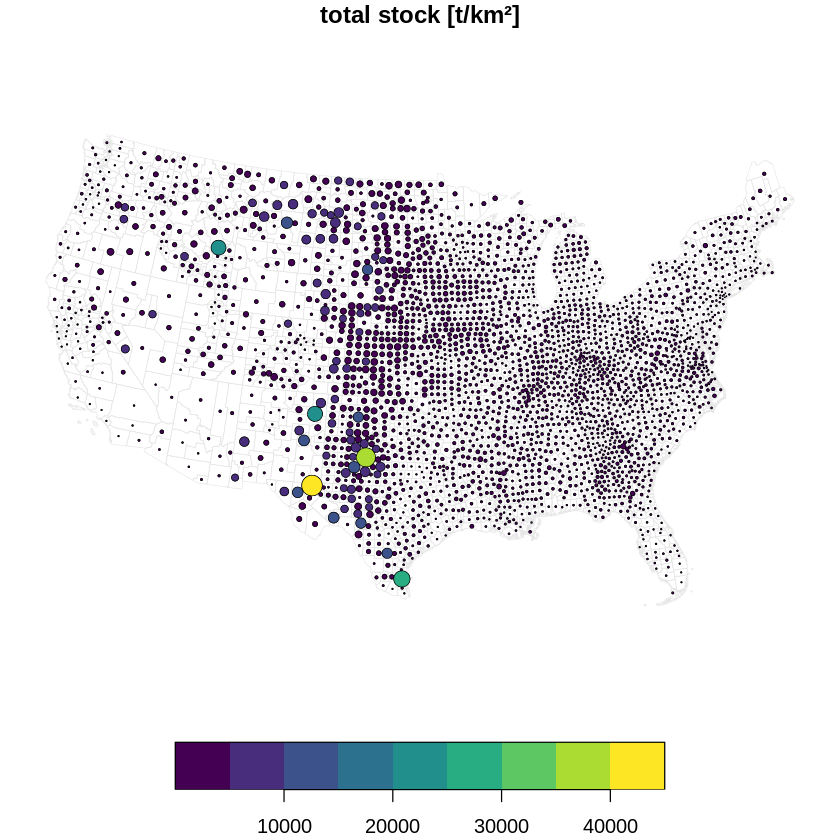

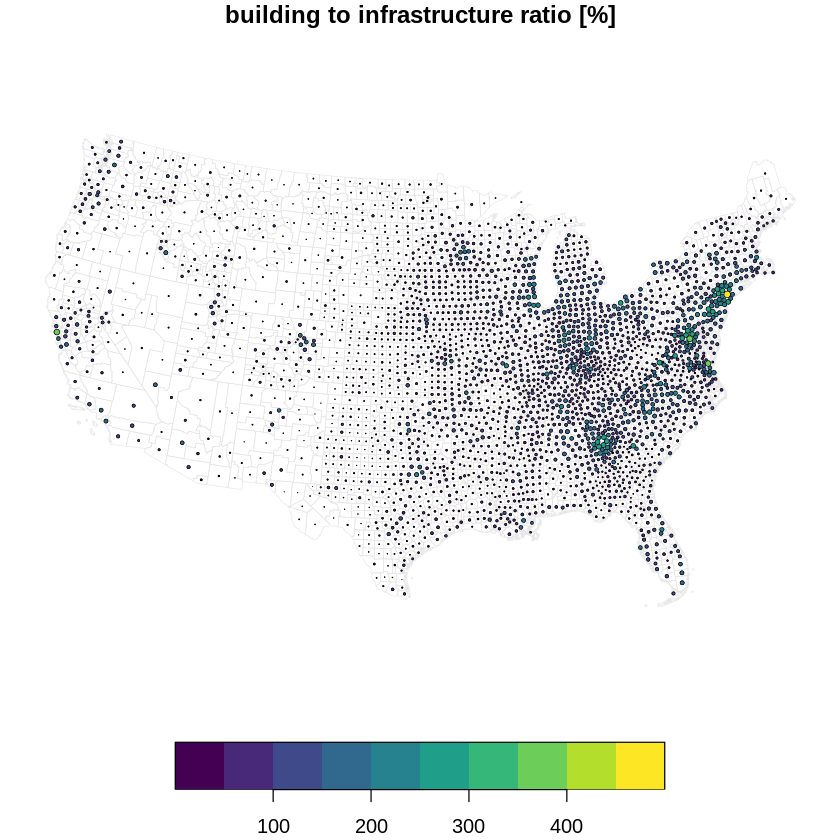

In [37]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t/km²]", 
         "rail stock [t/km²]", 
         "other stock [t/km²]", 
         "building stock [t/km²]", 
         "total stock [t/km²]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    #mai  <- c(0.4, 0.2, 0.4, 0.2)

    sf_ <- sf_pop

    #    tiff(file.path(dplot, sprintf("%s-tons-k%.1f.tif", name, k)),
    #    width = 8.8, height = 6, units = "cm", pointsize = 8,
    #    compression = "lzw", res = 600, type = "cairo", antialias = "subpixel")

    #par(mai = mai, cex = 1)

    if (sf_ %>% 
        st_drop_geometry %>% 
        select(names[i]) %>% 
        skewness() < 3) k <- 0.01 else k <- 0.1

    dor <- cartogram_dorling(sf_, names[i], k = k)
    plot(dor[names[i]], pal = viridis, key.width = 0.15,
        main = lab[i], reset = FALSE, lwd = 0.5)
    plot(st_geometry(sf_), border = "grey90", add = TRUE, lwd = 0.5)
    plot(dor[names[i]], pal = viridis, add = TRUE, lwd = 0.5)

    #    dev.off()

}

## Stocks vs population change
computed in % relative to 2000

change = (2018 - 2000) / 2000 * 100

In [8]:
sf_pop <- sf_pop %>% 
            mutate(delta_pop = (POPESTIMATE2018 - POPESTIMATE2000) / POPESTIMATE2000 * 100) %>%
            mutate(abs_delta_pop = abs(delta_pop))

In [46]:
sf_pop <- sf_pop %>% 
    mutate(rate_natural_increase = rowMeans(across(starts_with("RNATURALINC"))))
sf_pop <- sf_pop %>% 
    mutate(rate_death = rowMeans(across(starts_with("RDEATH"))))
sf_pop <- sf_pop %>% 
    mutate(rate_birth = rowMeans(across(starts_with("RBIRTH"))))
sf_pop <- sf_pop %>% 
    mutate(rate_net_migration = rowMeans(across(starts_with("RNETMIG"))))
sf_pop <- sf_pop %>% 
    mutate(rate_international_migration = rowMeans(across(starts_with("RINTERNATIONALMIG"))))
sf_pop <- sf_pop %>% 
    mutate(rate_domestic_migration = rowMeans(across(starts_with("RDOMESTICMIG"))))

In [ ]:
test <- data.frame(POPESTIMATE2018 = c(100,  50, 100, 100,  90),
                   POPESTIMATE2000 = c( 50, 100, 100,  90, 100))
test %>% 
    mutate(delta_pop = (POPESTIMATE2018 - POPESTIMATE2000) / POPESTIMATE2000 * 100) %>%
    mutate(abs_delta_pop = abs(delta_pop))

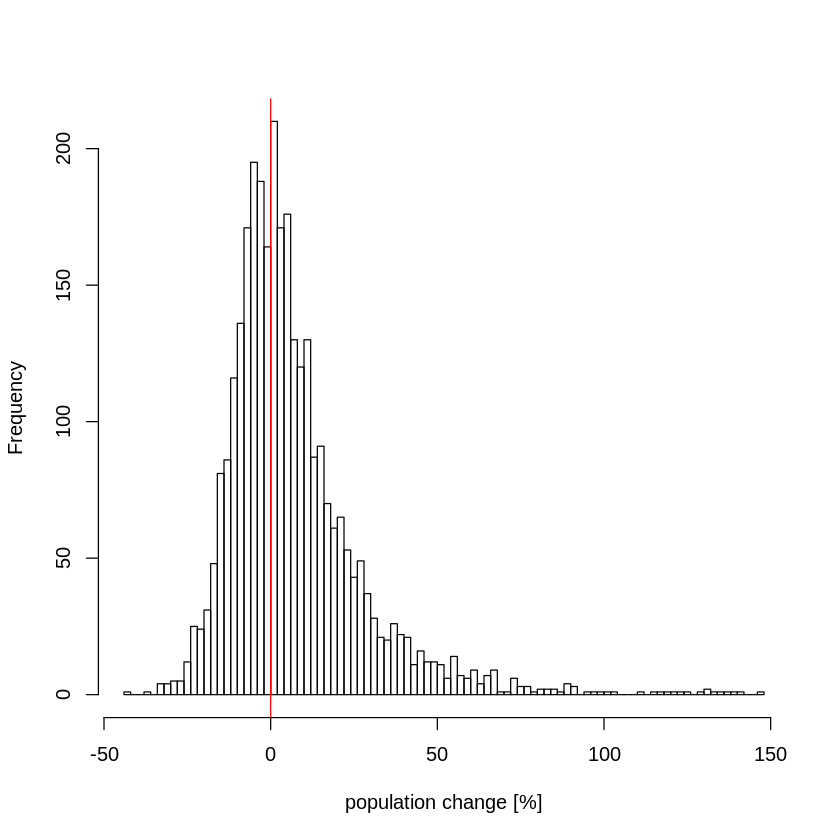

In [26]:
st_drop_geometry(sf_pop) %>%
select(delta_pop) %>%
unlist() %>%
hist(breaks = 100, 
     xlab = "population change [%]", main = "")
abline(v = 0, col = 2)

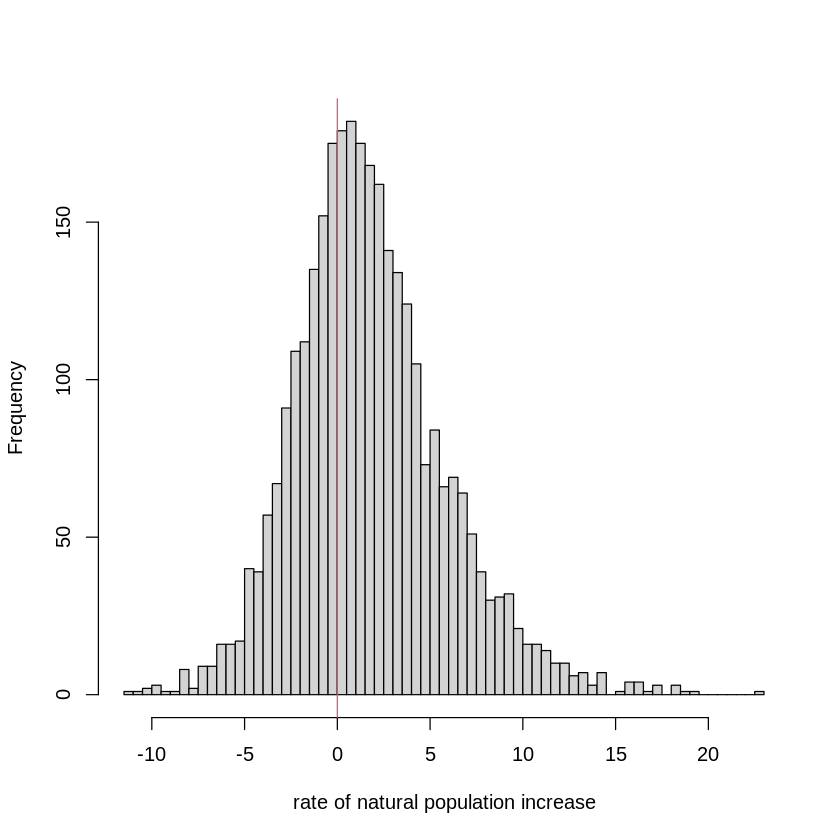

In [12]:
st_drop_geometry(sf_pop) %>%
select(rate_natural_increase) %>%
unlist() %>%
hist(breaks = 100, 
     xlab = "rate of natural population increase", main = "")
abline(v = 0, col = 2)

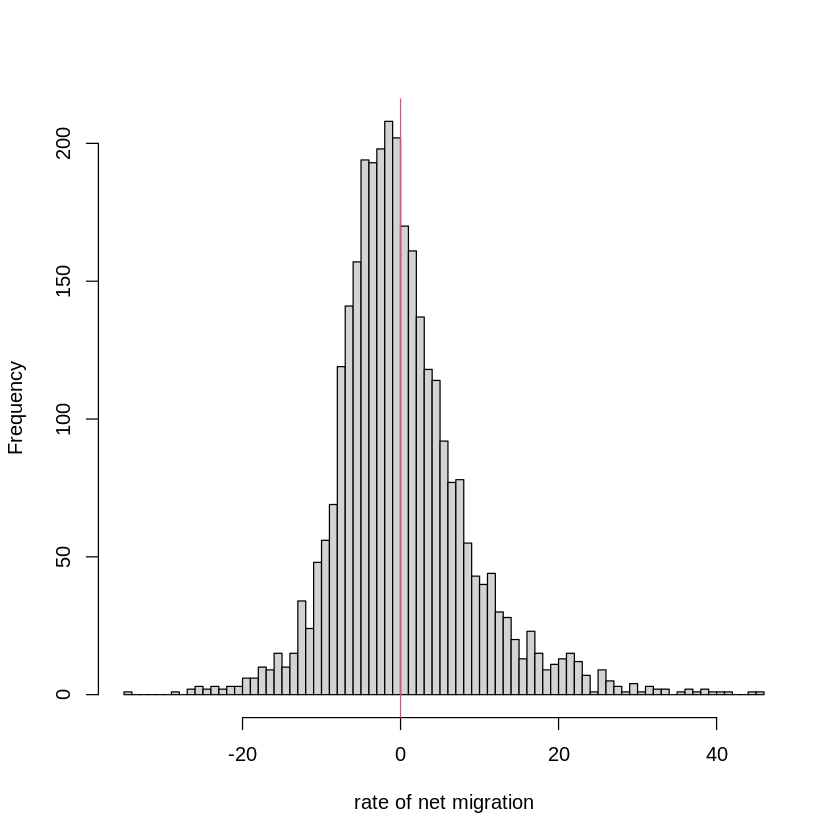

In [13]:
st_drop_geometry(sf_pop) %>%
select(rate_net_migration) %>%
unlist() %>%
hist(breaks = 100, 
     xlab = "rate of net migration", main = "")
abline(v = 0, col = 2)

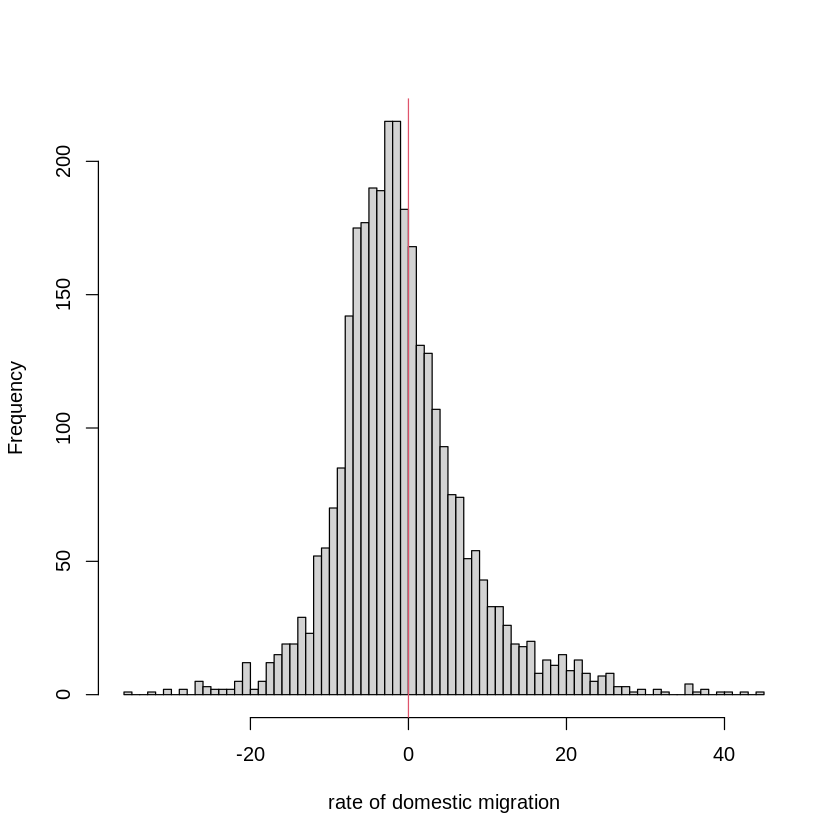

In [14]:
st_drop_geometry(sf_pop) %>%
select(rate_domestic_migration) %>%
unlist() %>%
hist(breaks = 100, 
     xlab = "rate of domestic migration", main = "")
abline(v = 0, col = 2)

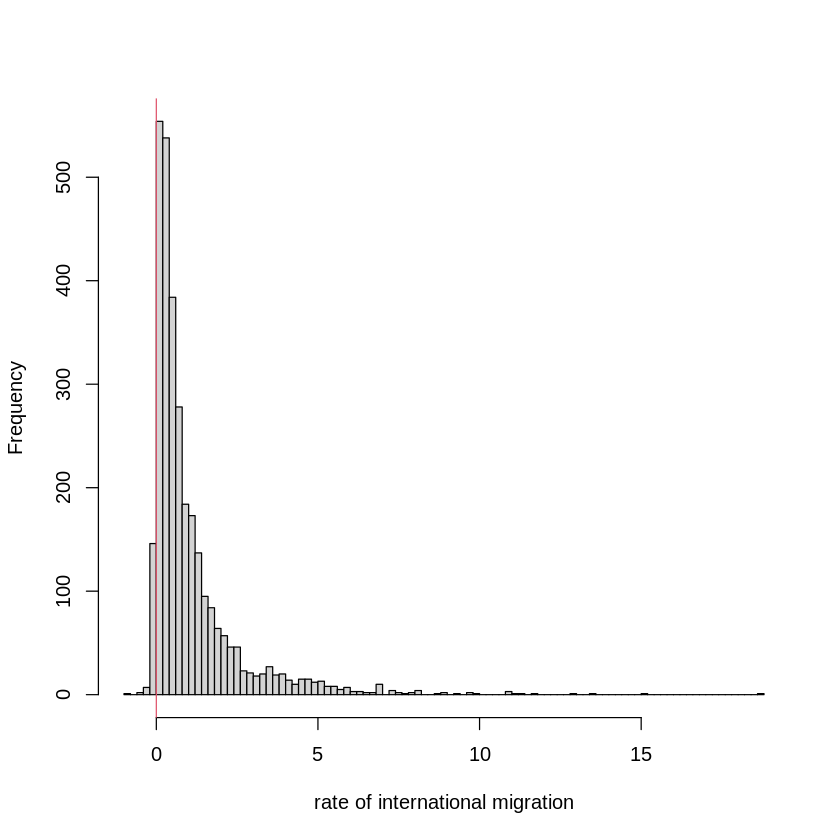

In [15]:
st_drop_geometry(sf_pop) %>%
select(rate_international_migration) %>%
unlist() %>%
hist(breaks = 100, 
     xlab = "rate of international migration", main = "")
abline(v = 0, col = 2)

#### counties with most extreme pop changes
- https://en.wikipedia.org/wiki/Pinal_County,_Arizona
- https://en.wikipedia.org/wiki/Issaquena_County,_Mississippi

In [ ]:
st_drop_geometry(sf_pop) %>% filter(delta_pop == max(delta_pop))
st_drop_geometry(sf_pop) %>% filter(delta_pop == min(delta_pop))

#### Regression

Can a part of stocks / cap be explained as a function of population loss?

There are two R² in the plot, which are two models.

1st R² = model based on pop_change only (this is what we are seeing as scatterplot)

log(stock) = a0 + a1 * pop_change + a2 * pop_change^2

2nd R² = model based on pop_change & pop_density

log(stock) = a0 + a1 * pop_change + a2 * pop_density + 
a3 * pop_change*pop_density + 
a4 * pop_change^2 + 
a5 * pop_density^2


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-5.1361 -0.5847 -0.0359  0.5373  4.9227 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  6.110e+00  1.812e-02  337.10   <2e-16 ***
x           -4.103e-02  1.300e-03  -31.55   <2e-16 ***
I(x * x)     2.845e-04  1.788e-05   15.92   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.9543 on 3096 degrees of freedom
Multiple R-squared:  0.2722,	Adjusted R-squared:  0.2717 
F-statistic: 578.8 on 2 and 3096 DF,  p-value: < 2.2e-16



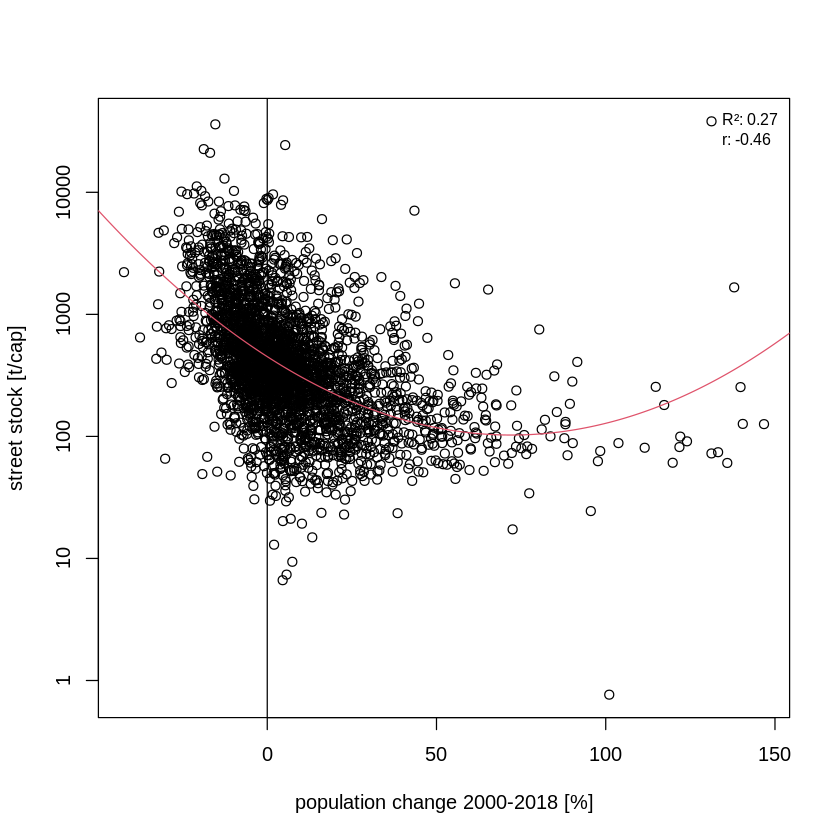


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-9.1975 -0.5606  0.1345  0.8088  4.5652 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.131e+00  2.982e-02 104.996   <2e-16 ***
x           -4.644e-02  2.158e-03 -21.519   <2e-16 ***
I(x * x)     2.932e-04  2.948e-05   9.947   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.491 on 2817 degrees of freedom
Multiple R-squared:  0.1702,	Adjusted R-squared:  0.1696 
F-statistic: 288.8 on 2 and 2817 DF,  p-value: < 2.2e-16



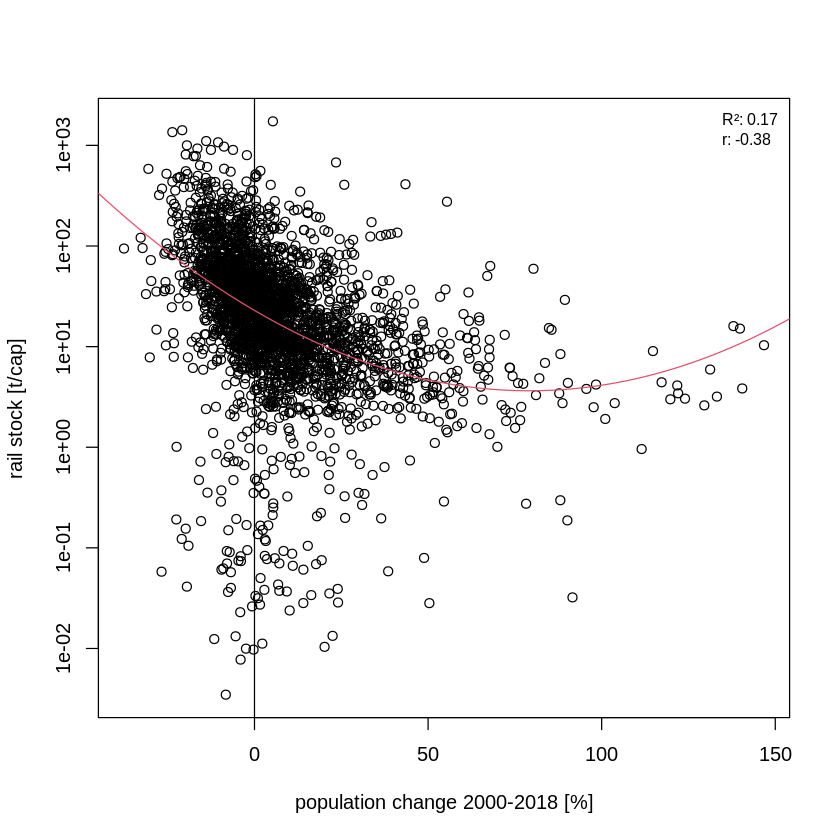


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.6932 -0.3400 -0.0042  0.3364  4.1543 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.982e+00  1.097e-02  362.95   <2e-16 ***
x           -1.184e-02  7.859e-04  -15.06   <2e-16 ***
I(x * x)     1.071e-04  1.066e-05   10.04   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.578 on 3098 degrees of freedom
Multiple R-squared:  0.06975,	Adjusted R-squared:  0.06915 
F-statistic: 116.1 on 2 and 3098 DF,  p-value: < 2.2e-16



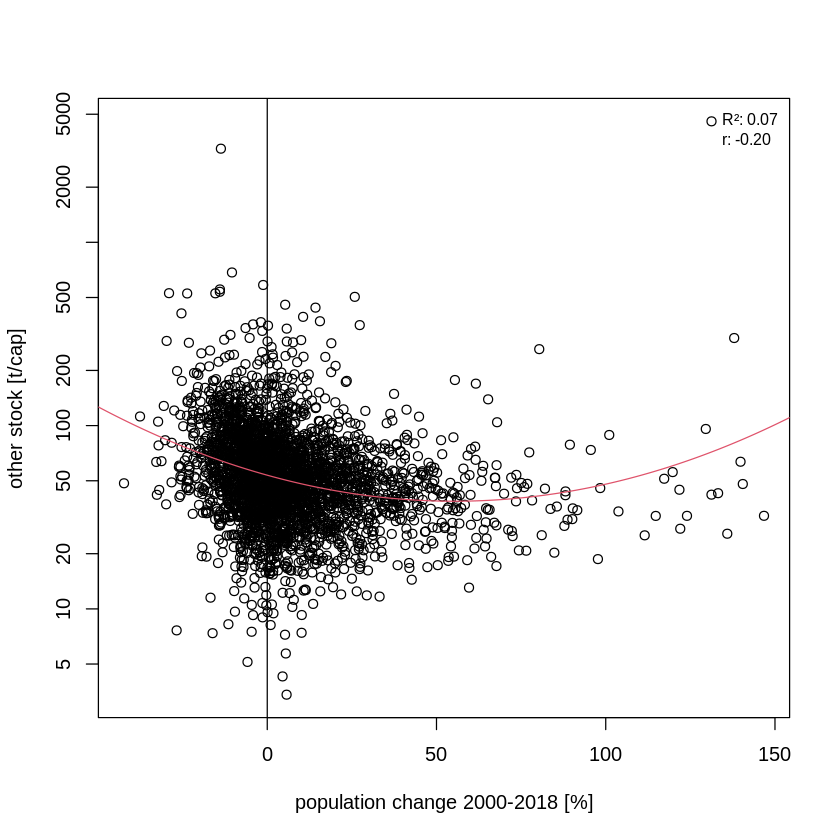


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
     Min       1Q   Median       3Q      Max 
-1.35605 -0.18979  0.02502  0.21075  1.10129 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.590e+00  5.778e-03  967.53   <2e-16 ***
x           -1.245e-02  4.139e-04  -30.09   <2e-16 ***
I(x * x)     7.358e-05  5.614e-06   13.11   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3044 on 3098 degrees of freedom
Multiple R-squared:   0.27,	Adjusted R-squared:  0.2696 
F-statistic:   573 on 2 and 3098 DF,  p-value: < 2.2e-16



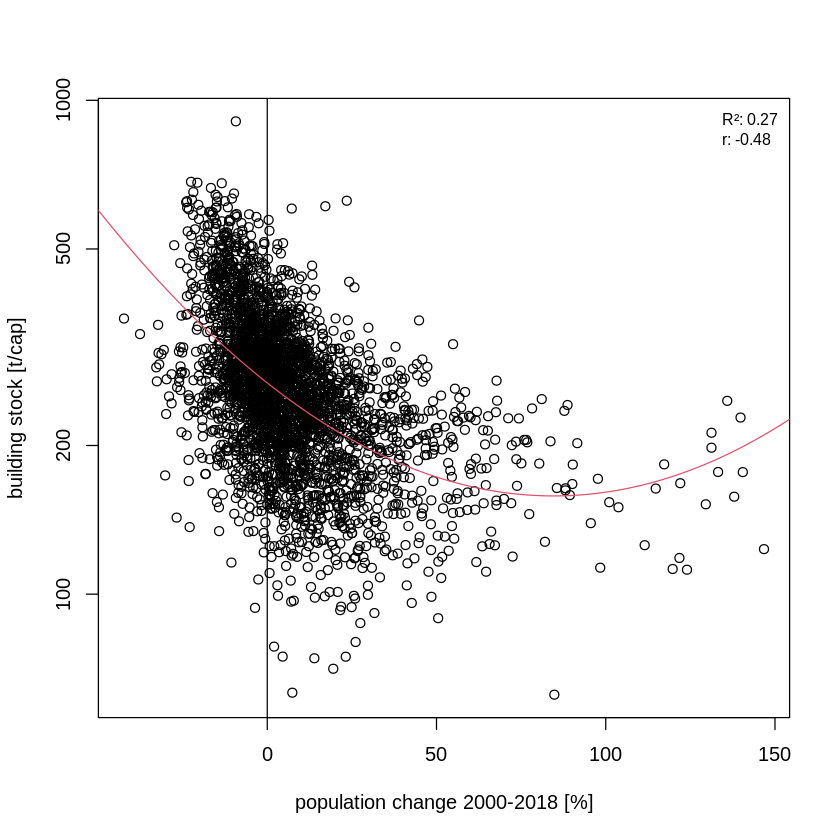


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.0827 -0.3980 -0.0834  0.2725  4.0821 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  6.796e+00  1.189e-02  571.52   <2e-16 ***
x           -2.954e-02  8.518e-04  -34.68   <2e-16 ***
I(x * x)     2.128e-04  1.155e-05   18.42   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.6265 on 3098 degrees of freedom
Multiple R-squared:  0.3058,	Adjusted R-squared:  0.3053 
F-statistic: 682.3 on 2 and 3098 DF,  p-value: < 2.2e-16



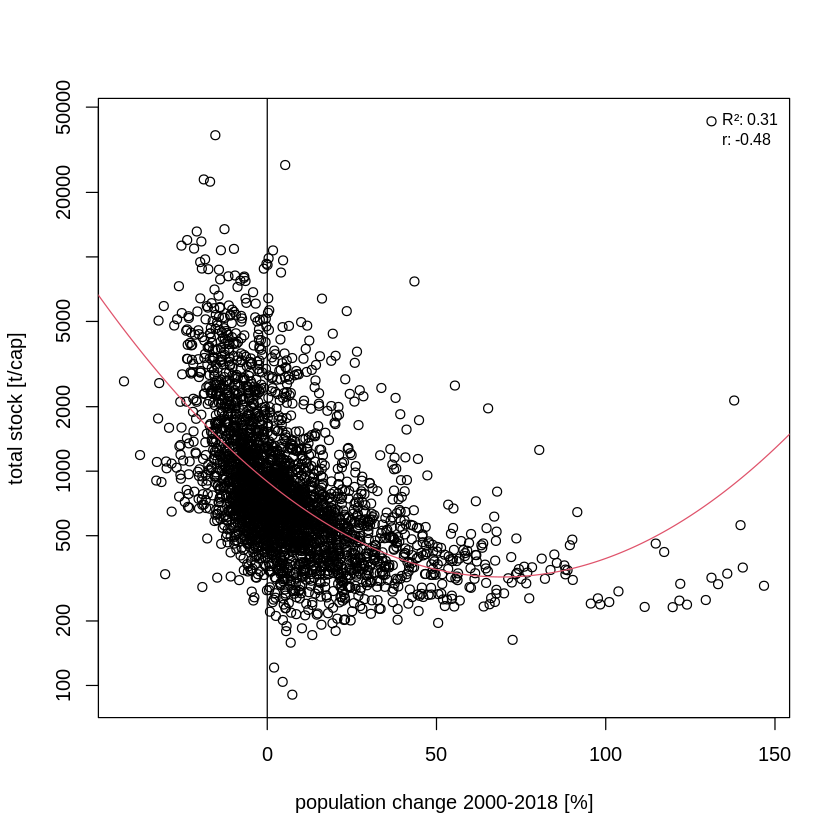


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-4.5184 -0.4325  0.1349  0.5396  2.2114 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.862e+00  1.524e-02  253.34   <2e-16 ***
x            2.512e-02  1.092e-03   23.01   <2e-16 ***
I(x * x)    -1.939e-04  1.481e-05  -13.09   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.8031 on 3098 degrees of freedom
Multiple R-squared:  0.1576,	Adjusted R-squared:  0.157 
F-statistic: 289.8 on 2 and 3098 DF,  p-value: < 2.2e-16



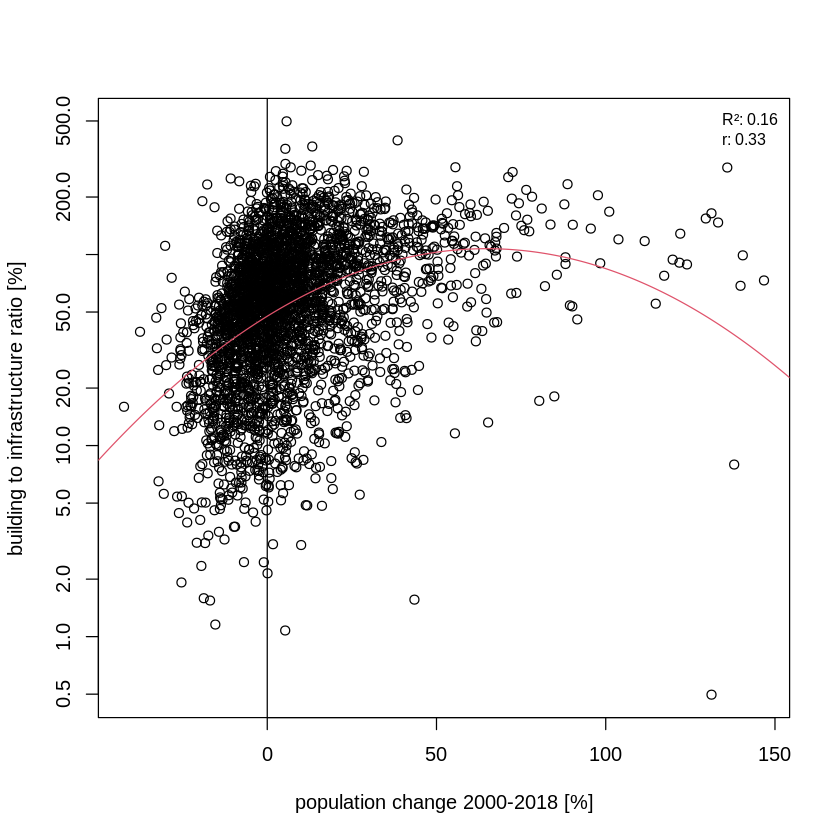

In [44]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t/cap]", 
         "rail stock [t/cap]", 
         "other stock [t/cap]", 
         "building stock [t/cap]", 
         "total stock [t/cap]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    #mai  <- c(0.4, 0.4, 0.2, 0.2)
    
    #    tiff(file.path(dplot, sprintf("%s-tons-vs-popchange.tif", name)),
    #    width = 8.8, height = 6, units = "cm", pointsize = 8,
    #    compression = "lzw", res = 600, type = "cairo", antialias = "subpixel")

#        par(mai = mai, cex = 1)

    sf_pop_ <- st_drop_geometry(sf_pop) %>% 
            select(c(delta_pop, names[i])) %>%
            filter(.data[[names[i]]] > 0)

    plot(sf_pop_, log = "y", 
            xlab = "population change 2000-2018 [%]",
            ylab = lab[i])
    #smoothScatter(sf_pop_, log = "y")

    abline(v = 0)

    x <- sf_pop_$delta_pop %>% unlist()
    y <- sf_pop_[names[i]] %>% unlist()

    if (sum(y <= 0) > 0){
        x <- x[-which(y <= 0)]
        y <- y[-which(y <= 0)]
    }

    y <- log(y)

    mod <- lm(y ~ x + I(x*x))
    print(summary(mod))

    newx <- seq(-100, 1000, 1)
    coef(mod)[1] + coef(mod)[2] * newx %>% exp()
    lines(newx, 
          exp(coef(mod)[1] + coef(mod)[2] * newx + coef(mod)[3] * newx*newx),
          col = 2)

    legend("topright", legend = c(
            sprintf("R²: %.2f", summary(mod)$r.squared),
            sprintf("r: %.2f", cor(x,y))
    ), 
        bty = "n", cex = 0.8)

#    dev.off()

}


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-5.5839 -0.6752 -0.1024  0.5398  4.8354 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  6.0904825  0.0211119 288.486  < 2e-16 ***
x           -0.1321992  0.0061078 -21.644  < 2e-16 ***
I(x * x)     0.0054939  0.0006729   8.165 4.64e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.033 on 3096 degrees of freedom
Multiple R-squared:  0.1478,	Adjusted R-squared:  0.1472 
F-statistic: 268.4 on 2 and 3096 DF,  p-value: < 2.2e-16



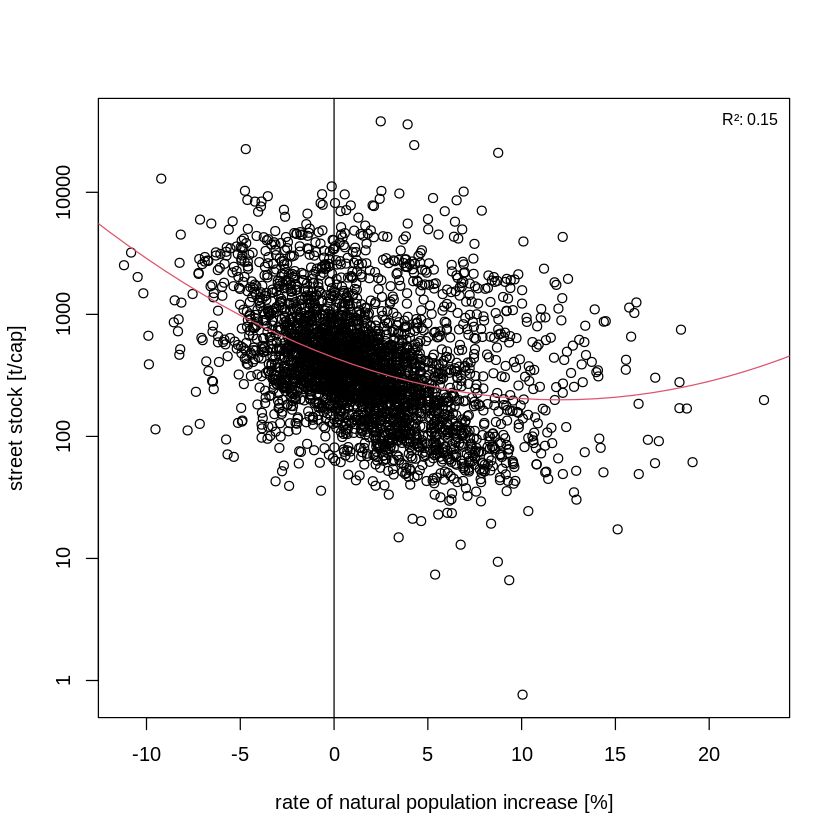


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-9.1086 -0.7037  0.1349  0.9477  4.7515 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.074047   0.034655  88.705   <2e-16 ***
x           -0.096251   0.010369  -9.282   <2e-16 ***
I(x * x)     0.002414   0.001139   2.120   0.0341 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.603 on 2817 degrees of freedom
Multiple R-squared:  0.04088,	Adjusted R-squared:  0.04019 
F-statistic: 60.03 on 2 and 2817 DF,  p-value: < 2.2e-16



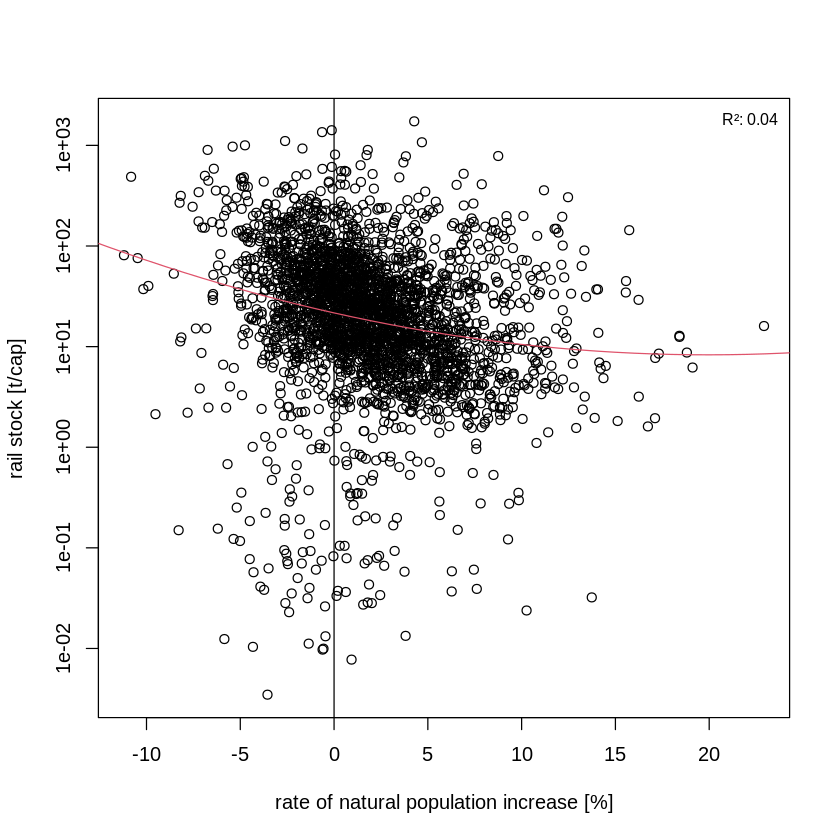


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.7007 -0.3501 -0.0151  0.3458  4.5086 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.937781   0.012210  322.51  < 2e-16 ***
x           -0.011901   0.003532   -3.37 0.000761 ***
I(x * x)     0.001786   0.000389    4.59  4.6e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5972 on 3098 degrees of freedom
Multiple R-squared:  0.006815,	Adjusted R-squared:  0.006174 
F-statistic: 10.63 on 2 and 3098 DF,  p-value: 2.509e-05



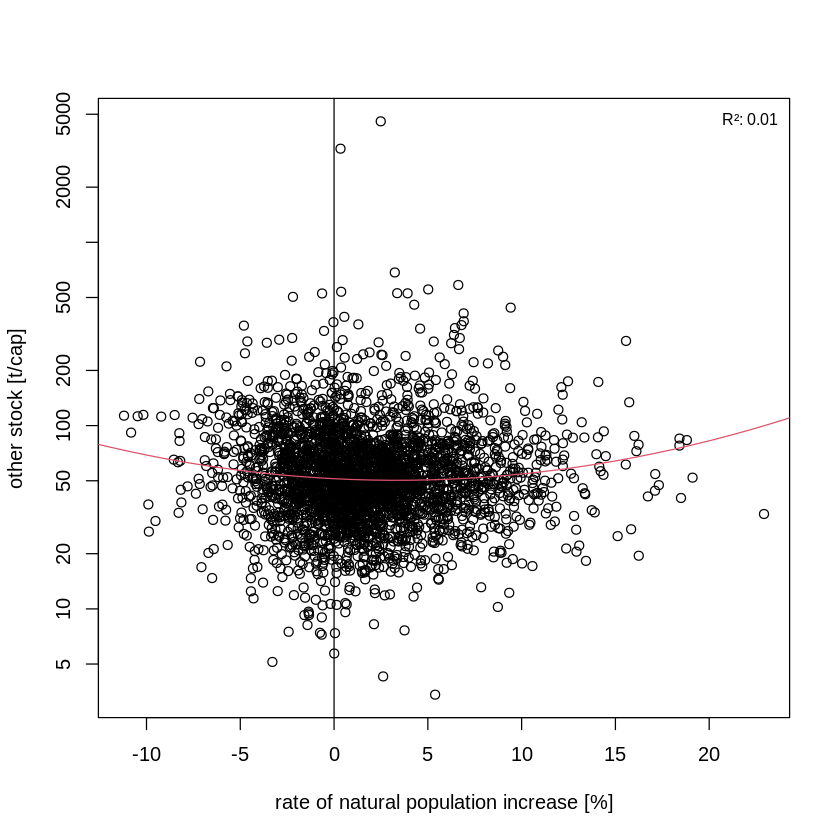


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
     Min       1Q   Median       3Q      Max 
-1.12437 -0.18703  0.00625  0.19754  1.26466 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.610e+00  6.515e-03 861.103   <2e-16 ***
x           -3.864e-02  1.885e-03 -20.501   <2e-16 ***
I(x * x)    -9.362e-05  2.076e-04  -0.451    0.652    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3187 on 3098 degrees of freedom
Multiple R-squared:  0.1998,	Adjusted R-squared:  0.1993 
F-statistic: 386.8 on 2 and 3098 DF,  p-value: < 2.2e-16



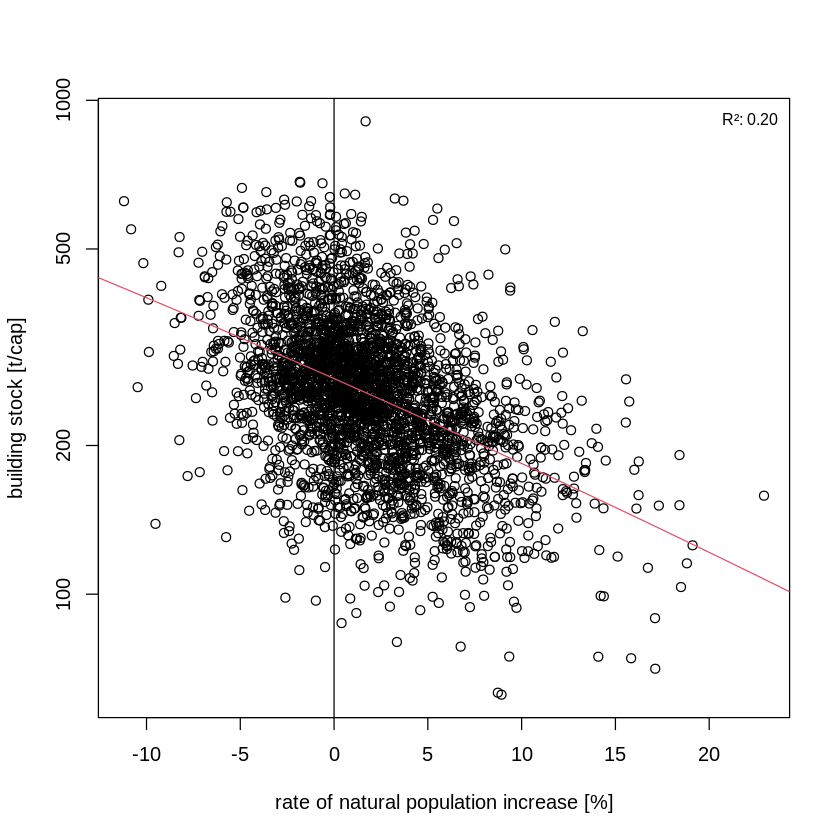


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.2927 -0.4641 -0.1353  0.3096  4.0846 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  6.7777558  0.0142287 476.344  < 2e-16 ***
x           -0.0876270  0.0041158 -21.290  < 2e-16 ***
I(x * x)     0.0036891  0.0004533   8.138 5.75e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.696 on 3098 degrees of freedom
Multiple R-squared:  0.1431,	Adjusted R-squared:  0.1426 
F-statistic: 258.8 on 2 and 3098 DF,  p-value: < 2.2e-16



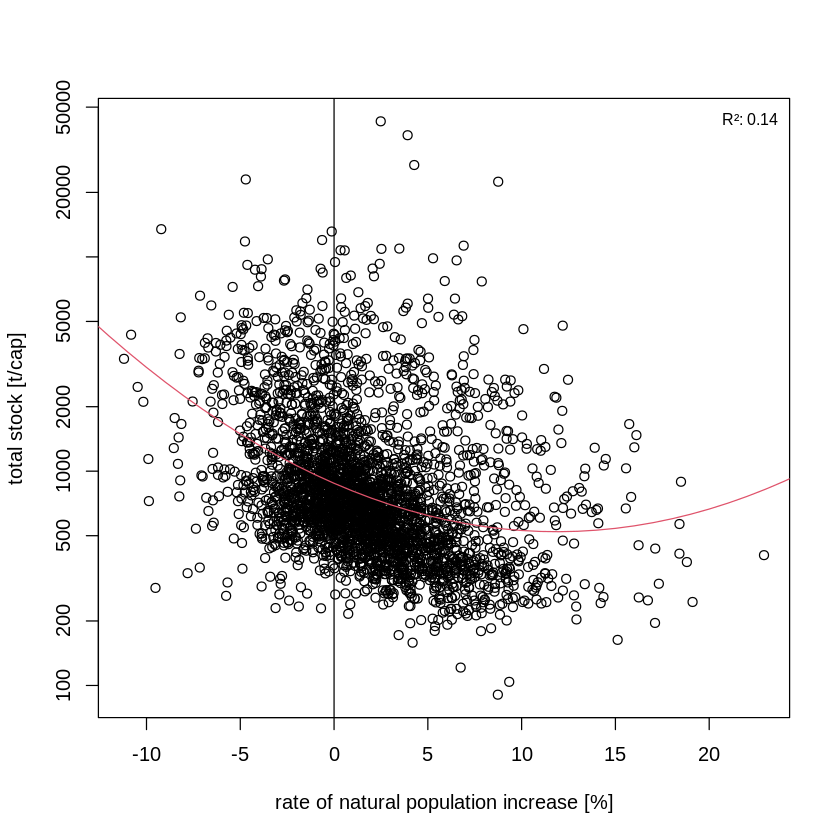


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-4.7676 -0.4553  0.1365  0.5973  2.0974 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.9119880  0.0172500 226.782   <2e-16 ***
x            0.0761448  0.0049898  15.260   <2e-16 ***
I(x * x)    -0.0053506  0.0005496  -9.736   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.8438 on 3098 degrees of freedom
Multiple R-squared:  0.06999,	Adjusted R-squared:  0.06939 
F-statistic: 116.6 on 2 and 3098 DF,  p-value: < 2.2e-16



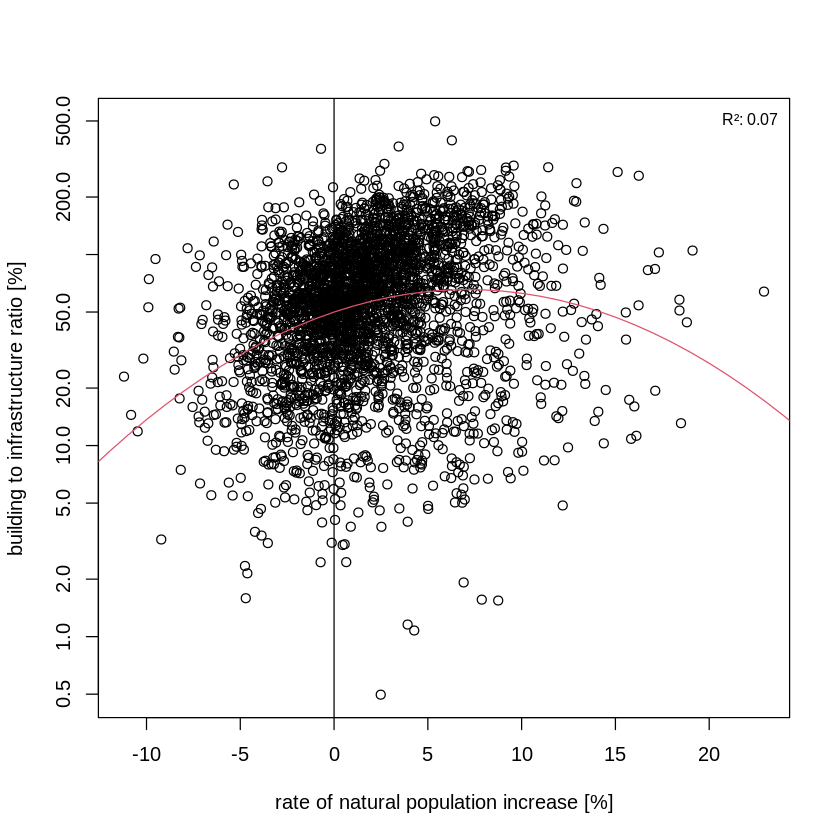

In [35]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t/cap]", 
         "rail stock [t/cap]", 
         "other stock [t/cap]", 
         "building stock [t/cap]", 
         "total stock [t/cap]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    #mai  <- c(0.4, 0.4, 0.2, 0.2)
    
    #    tiff(file.path(dplot, sprintf("%s-tons-vs-popchange.tif", name)),
    #    width = 8.8, height = 6, units = "cm", pointsize = 8,
    #    compression = "lzw", res = 600, type = "cairo", antialias = "subpixel")

#        par(mai = mai, cex = 1)

    sf_pop_ <- st_drop_geometry(sf_pop) %>% 
            select(c(rate_natural_increase, names[i])) %>%
            filter(.data[[names[i]]] > 0)

    plot(sf_pop_, log = "y", 
            xlab = "rate of natural population increase [%]",
            ylab = lab[i])
    #smoothScatter(sf_pop_, log = "y")

    abline(v = 0)

    x <- sf_pop_$rate_natural_increase %>% unlist()
    y <- sf_pop_[names[i]] %>% unlist()

    if (sum(y <= 0) > 0){
        x <- x[-which(y <= 0)]
        y <- y[-which(y <= 0)]
    }

    y <- log(y)

    mod <- lm(y ~ x + I(x*x))
    print(summary(mod))

    newx <- seq(-100, 1000, 1)
    coef(mod)[1] + coef(mod)[2] * newx %>% exp()
    lines(newx, 
          exp(coef(mod)[1] + coef(mod)[2] * newx + coef(mod)[3] * newx*newx),
          col = 2)

    legend("topright", legend = c(
            sprintf("R²: %.2f", summary(mod)$r.squared)
            ), 
        bty = "n", cex = 0.8)

#    dev.off()

}


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-5.2577 -0.5732 -0.0017  0.5604  5.8171 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.9094391  0.0198470 297.750  < 2e-16 ***
x           -0.0683376  0.0023820 -28.690  < 2e-16 ***
I(x * x)     0.0009619  0.0001313   7.327 2.99e-13 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.9906 on 3096 degrees of freedom
Multiple R-squared:  0.2158,	Adjusted R-squared:  0.2153 
F-statistic:   426 on 2 and 3096 DF,  p-value: < 2.2e-16



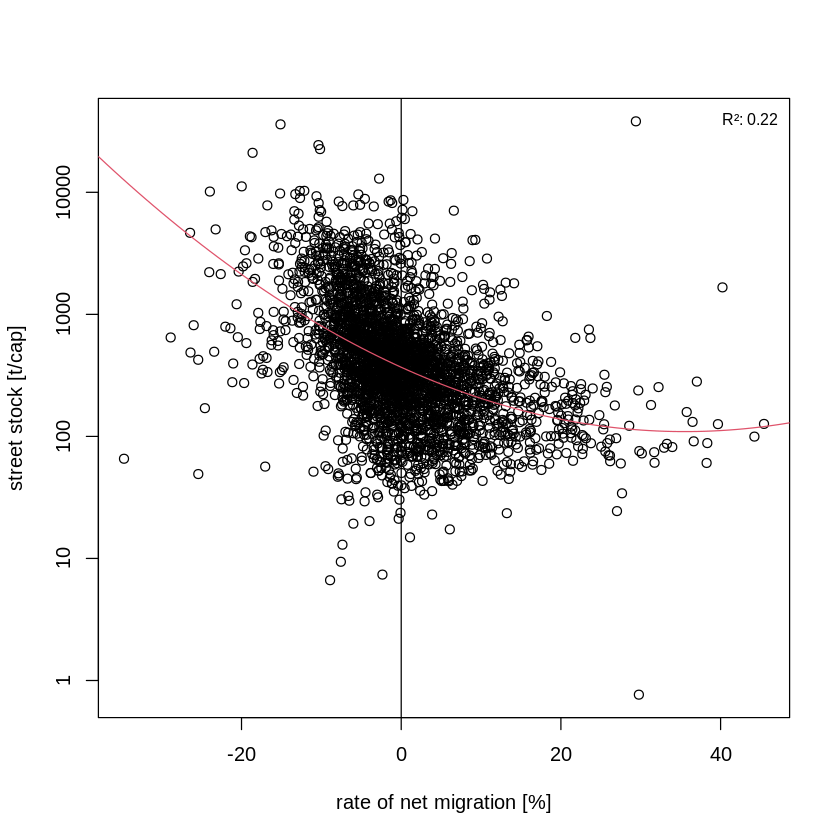


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-8.5548 -0.5845  0.1494  0.8653  3.9299 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  2.8961744  0.0313681  92.329  < 2e-16 ***
x           -0.0861652  0.0038826 -22.192  < 2e-16 ***
I(x * x)     0.0009055  0.0002087   4.339 1.48e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.5 on 2817 degrees of freedom
Multiple R-squared:  0.1601,	Adjusted R-squared:  0.1595 
F-statistic: 268.6 on 2 and 2817 DF,  p-value: < 2.2e-16



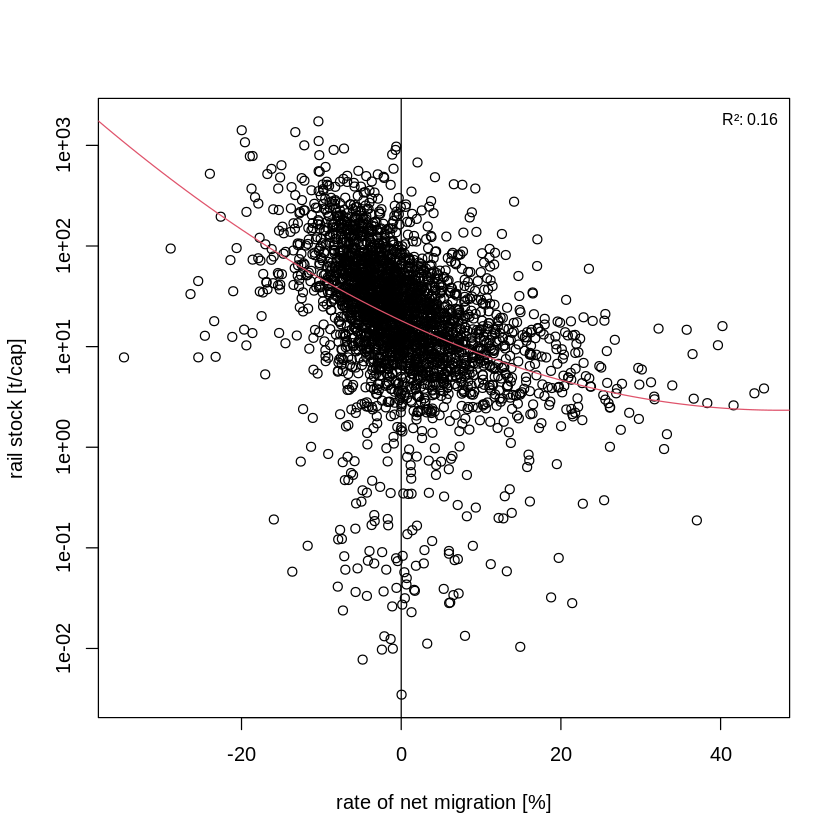


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.9392 -0.3363  0.0002  0.3306  4.7261 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.915e+00  1.139e-02 343.657  < 2e-16 ***
x           -2.484e-02  1.370e-03 -18.131  < 2e-16 ***
I(x * x)     5.984e-04  7.436e-05   8.047 1.19e-15 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5698 on 3098 degrees of freedom
Multiple R-squared:  0.09594,	Adjusted R-squared:  0.09536 
F-statistic: 164.4 on 2 and 3098 DF,  p-value: < 2.2e-16



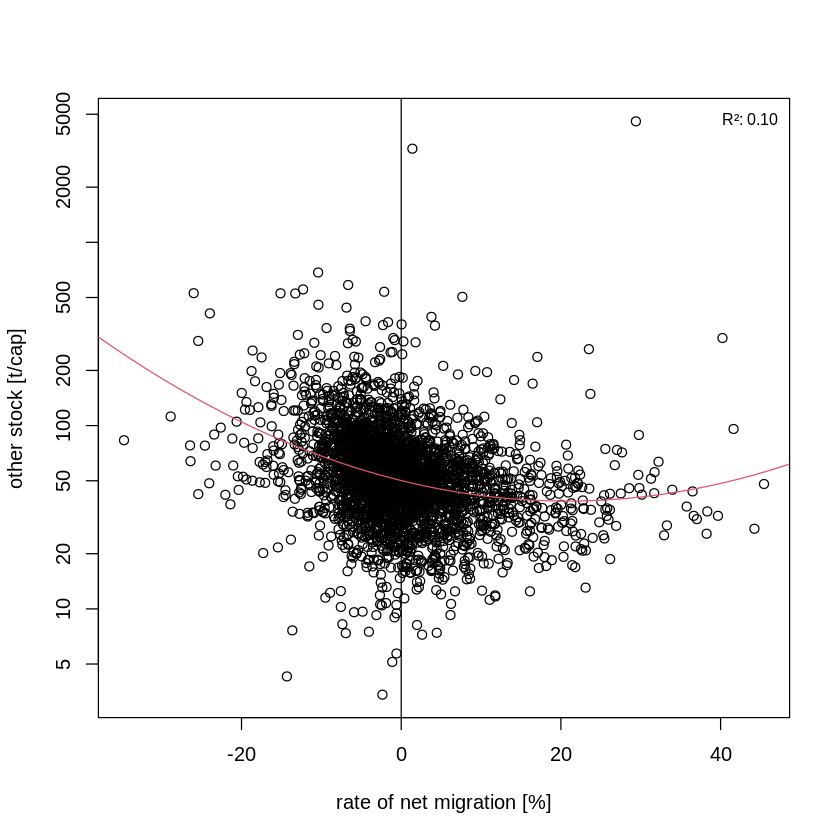


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
     Min       1Q   Median       3Q      Max 
-1.51498 -0.19850  0.02479  0.21355  1.14658 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.545e+00  6.614e-03 838.388   <2e-16 ***
x           -1.560e-02  7.956e-04 -19.605   <2e-16 ***
I(x * x)    -4.227e-05  4.317e-05  -0.979    0.328    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3308 on 3098 degrees of freedom
Multiple R-squared:  0.1376,	Adjusted R-squared:  0.1371 
F-statistic: 247.2 on 2 and 3098 DF,  p-value: < 2.2e-16



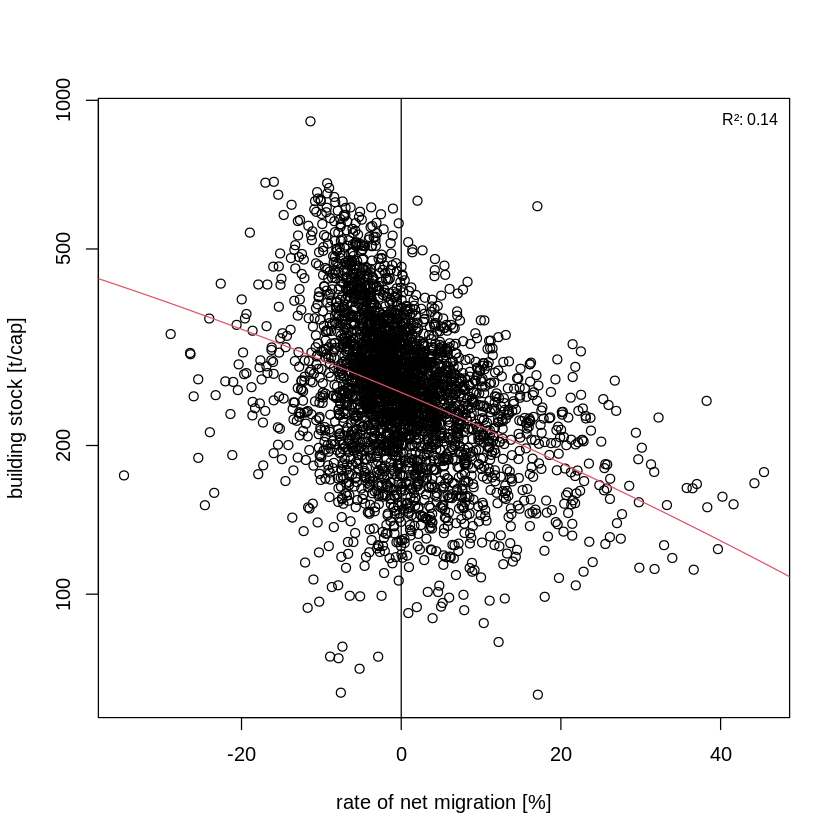


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-3.4697 -0.3915 -0.0710  0.2915  4.8259 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  6.652e+00  1.302e-02 510.728   <2e-16 ***
x           -4.952e-02  1.567e-03 -31.609   <2e-16 ***
I(x * x)     7.462e-04  8.501e-05   8.778   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.6515 on 3098 degrees of freedom
Multiple R-squared:  0.2493,	Adjusted R-squared:  0.2488 
F-statistic: 514.3 on 2 and 3098 DF,  p-value: < 2.2e-16



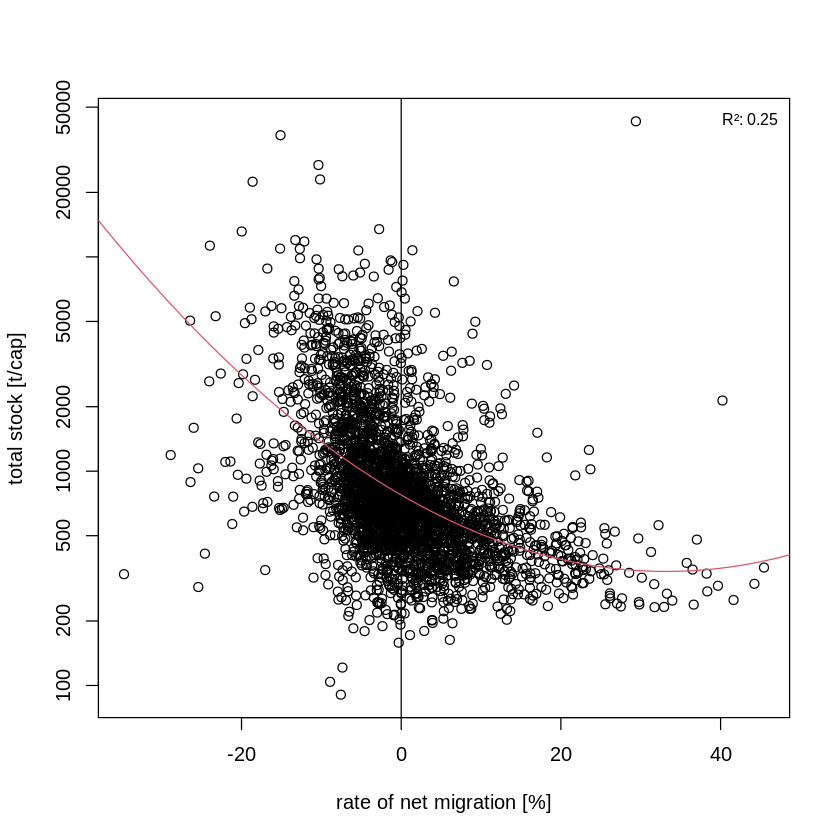


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-5.2473 -0.4553  0.0986  0.5221  3.6167 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  4.0036647  0.0159204 251.480   <2e-16 ***
x            0.0484615  0.0019149  25.308   <2e-16 ***
I(x * x)    -0.0010186  0.0001039  -9.802   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.7963 on 3098 degrees of freedom
Multiple R-squared:  0.1717,	Adjusted R-squared:  0.1711 
F-statistic: 321.1 on 2 and 3098 DF,  p-value: < 2.2e-16



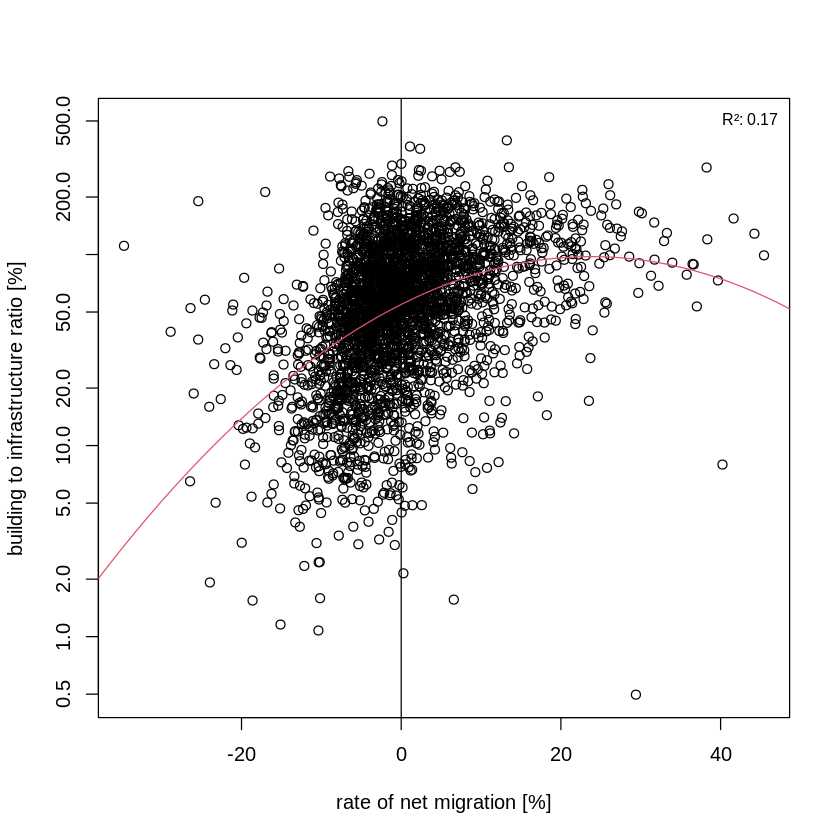

In [36]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t/cap]", 
         "rail stock [t/cap]", 
         "other stock [t/cap]", 
         "building stock [t/cap]", 
         "total stock [t/cap]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    #mai  <- c(0.4, 0.4, 0.2, 0.2)
    
    #    tiff(file.path(dplot, sprintf("%s-tons-vs-popchange.tif", name)),
    #    width = 8.8, height = 6, units = "cm", pointsize = 8,
    #    compression = "lzw", res = 600, type = "cairo", antialias = "subpixel")

#        par(mai = mai, cex = 1)

    sf_pop_ <- st_drop_geometry(sf_pop) %>% 
            select(c(rate_net_migration, names[i])) %>%
            filter(.data[[names[i]]] > 0)

    plot(sf_pop_, log = "y", 
            xlab = "rate of net migration [%]",
            ylab = lab[i])
    #smoothScatter(sf_pop_, log = "y")

    abline(v = 0)

    x <- sf_pop_$rate_net_migration %>% unlist()
    y <- sf_pop_[names[i]] %>% unlist()

    if (sum(y <= 0) > 0){
        x <- x[-which(y <= 0)]
        y <- y[-which(y <= 0)]
    }

    y <- log(y)

    mod <- lm(y ~ x + I(x*x))
    print(summary(mod))

    newx <- seq(-100, 1000, 1)
    coef(mod)[1] + coef(mod)[2] * newx %>% exp()
    lines(newx, 
          exp(coef(mod)[1] + coef(mod)[2] * newx + coef(mod)[3] * newx*newx),
          col = 2)

    legend("topright", legend = c(
            sprintf("R²: %.2f", summary(mod)$r.squared)
            ), 
        bty = "n", cex = 0.8)

#    dev.off()

}


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-5.1146 -0.5811  0.0069  0.5780  5.6746 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.8693149  0.0208700 281.233  < 2e-16 ***
x           -0.0566579  0.0023079 -24.550  < 2e-16 ***
I(x * x)     0.0006336  0.0001324   4.785 1.79e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.023 on 3096 degrees of freedom
Multiple R-squared:  0.1637,	Adjusted R-squared:  0.1631 
F-statistic: 302.9 on 2 and 3096 DF,  p-value: < 2.2e-16



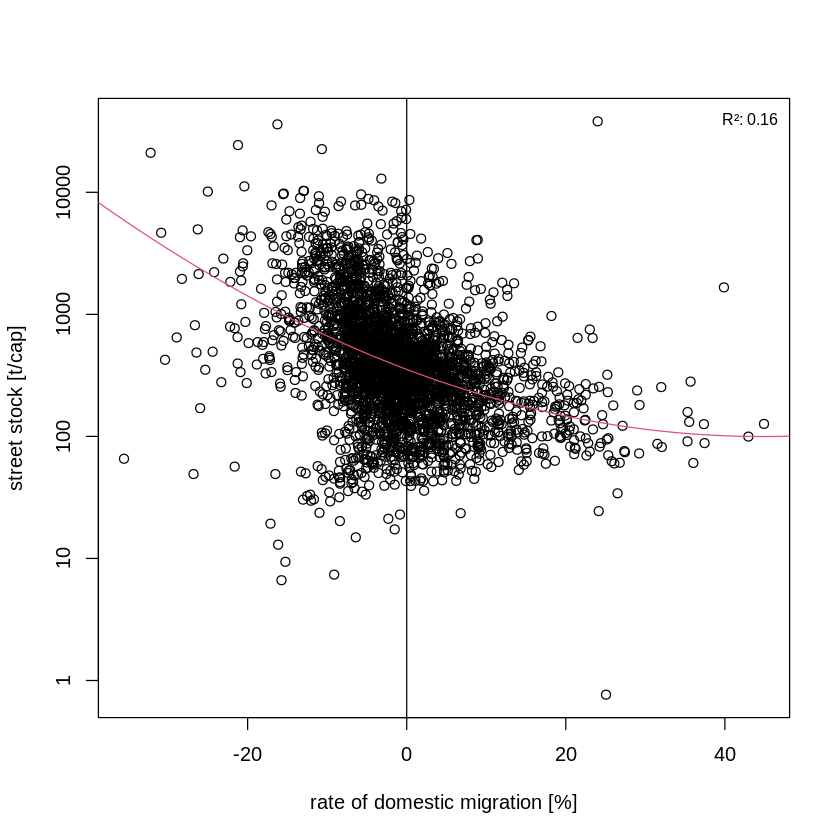


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-8.6487 -0.6075  0.1740  0.8799  3.9541 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  2.8293976  0.0325026  87.052  < 2e-16 ***
x           -0.0753136  0.0036687 -20.529  < 2e-16 ***
I(x * x)     0.0006136  0.0002057   2.982  0.00288 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.524 on 2817 degrees of freedom
Multiple R-squared:  0.1333,	Adjusted R-squared:  0.1326 
F-statistic: 216.5 on 2 and 2817 DF,  p-value: < 2.2e-16



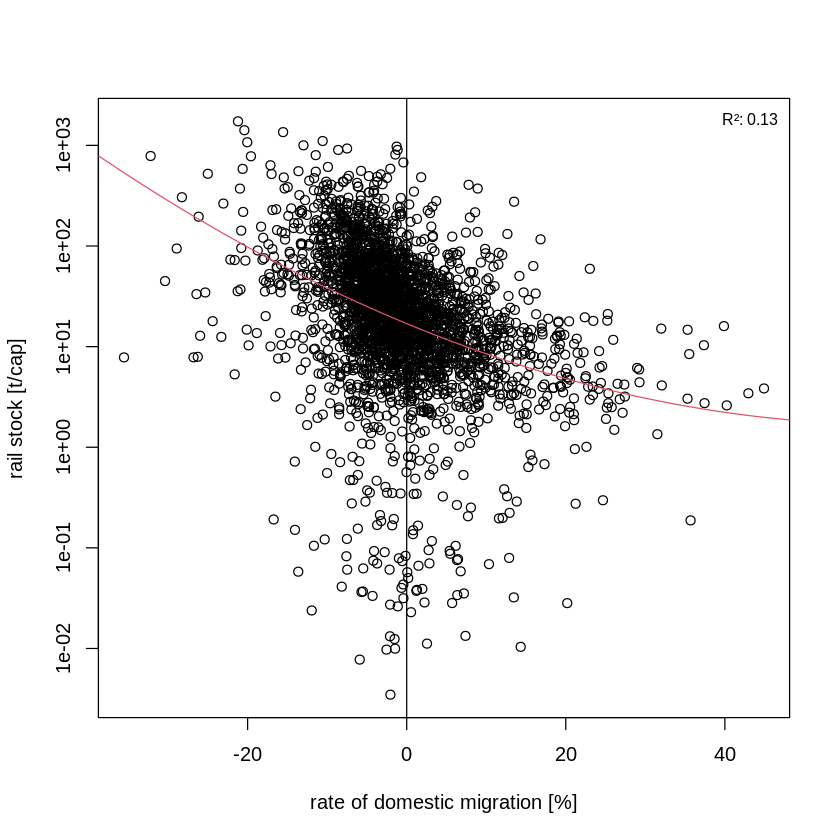


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.9215 -0.3308  0.0007  0.3285  4.7773 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.895e+00  1.162e-02 335.153  < 2e-16 ***
x           -2.278e-02  1.286e-03 -17.709  < 2e-16 ***
I(x * x)     5.246e-04  7.275e-05   7.212 6.92e-13 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5706 on 3098 degrees of freedom
Multiple R-squared:  0.09348,	Adjusted R-squared:  0.0929 
F-statistic: 159.7 on 2 and 3098 DF,  p-value: < 2.2e-16



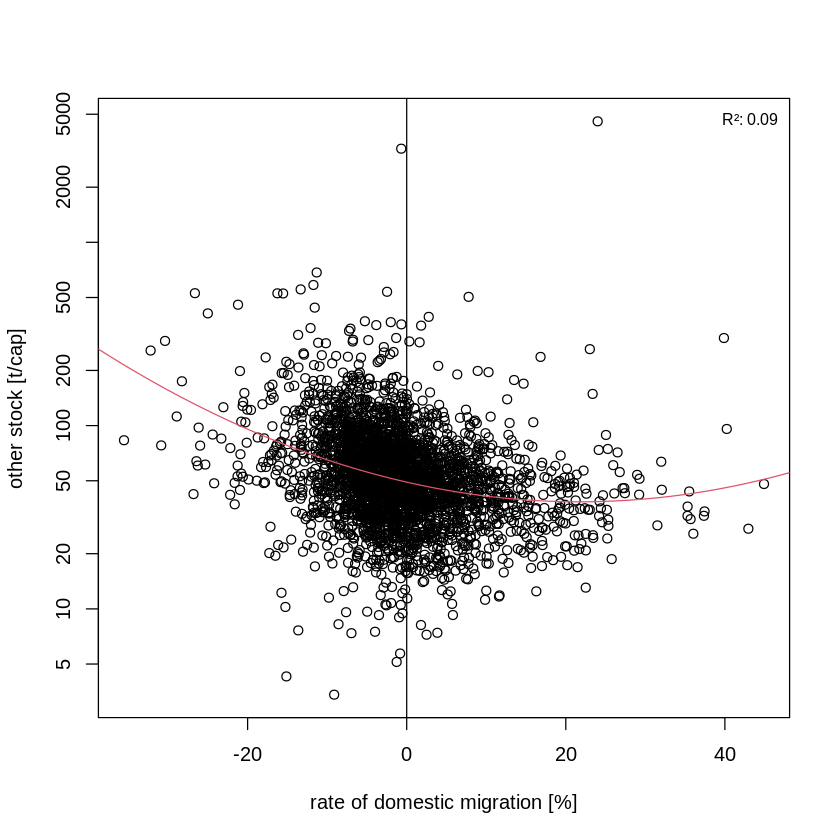


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
     Min       1Q   Median       3Q      Max 
-1.55054 -0.20416  0.02594  0.21665  1.14234 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.5398079  0.0068691 806.478  < 2e-16 ***
x           -0.0127674  0.0007602 -16.794  < 2e-16 ***
I(x * x)    -0.0001637  0.0000430  -3.807 0.000144 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3373 on 3098 degrees of freedom
Multiple R-squared:  0.1039,	Adjusted R-squared:  0.1033 
F-statistic: 179.5 on 2 and 3098 DF,  p-value: < 2.2e-16



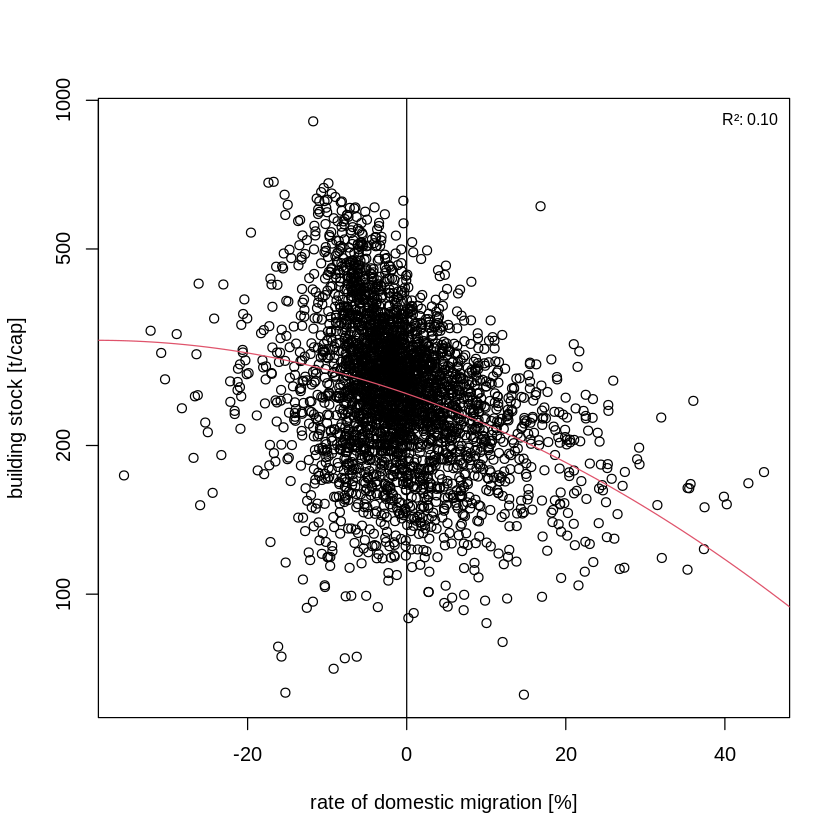


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.9957 -0.3992 -0.0701  0.3039  4.7563 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  6.620e+00  1.368e-02 483.870  < 2e-16 ***
x           -4.232e-02  1.514e-03 -27.950  < 2e-16 ***
I(x * x)     5.323e-04  8.564e-05   6.216  5.8e-10 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.6717 on 3098 degrees of freedom
Multiple R-squared:  0.2019,	Adjusted R-squared:  0.2014 
F-statistic: 391.8 on 2 and 3098 DF,  p-value: < 2.2e-16



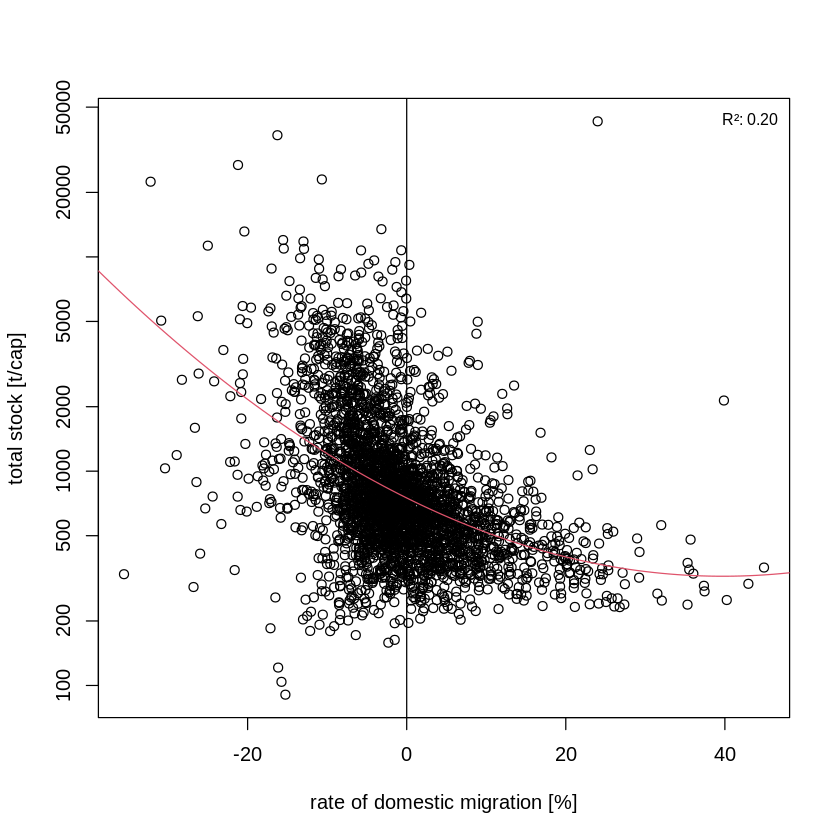


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-5.2381 -0.4684  0.0933  0.5224  3.2114 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  4.0378485  0.0165031 244.672  < 2e-16 ***
x            0.0412571  0.0018265  22.589  < 2e-16 ***
I(x * x)    -0.0008493  0.0001033  -8.221 2.92e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.8103 on 3098 degrees of freedom
Multiple R-squared:  0.1424,	Adjusted R-squared:  0.1419 
F-statistic: 257.3 on 2 and 3098 DF,  p-value: < 2.2e-16



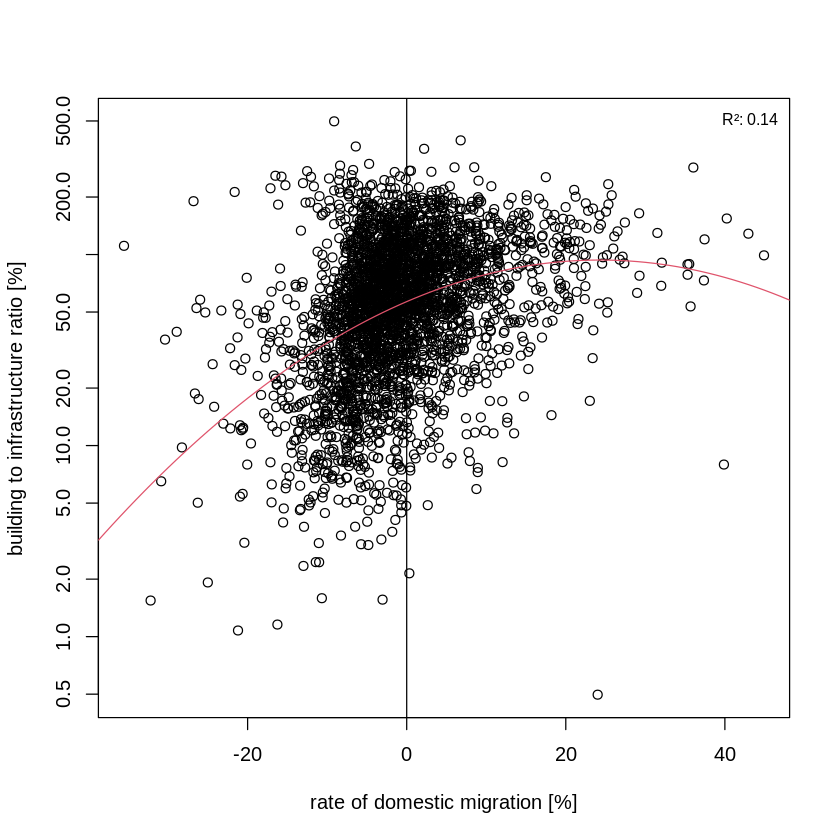

In [37]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t/cap]", 
         "rail stock [t/cap]", 
         "other stock [t/cap]", 
         "building stock [t/cap]", 
         "total stock [t/cap]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    #mai  <- c(0.4, 0.4, 0.2, 0.2)
    
    #    tiff(file.path(dplot, sprintf("%s-tons-vs-popchange.tif", name)),
    #    width = 8.8, height = 6, units = "cm", pointsize = 8,
    #    compression = "lzw", res = 600, type = "cairo", antialias = "subpixel")

#        par(mai = mai, cex = 1)

    sf_pop_ <- st_drop_geometry(sf_pop) %>% 
            select(c(rate_domestic_migration, names[i])) %>%
            filter(.data[[names[i]]] > 0)

    plot(sf_pop_, log = "y", 
            xlab = "rate of domestic migration [%]",
            ylab = lab[i])
    #smoothScatter(sf_pop_, log = "y")

    abline(v = 0)

    x <- sf_pop_$rate_domestic_migration %>% unlist()
    y <- sf_pop_[names[i]] %>% unlist()

    if (sum(y <= 0) > 0){
        x <- x[-which(y <= 0)]
        y <- y[-which(y <= 0)]
    }

    y <- log(y)

    mod <- lm(y ~ x + I(x*x))
    print(summary(mod))

    newx <- seq(-100, 1000, 1)
    coef(mod)[1] + coef(mod)[2] * newx %>% exp()
    lines(newx, 
          exp(coef(mod)[1] + coef(mod)[2] * newx + coef(mod)[3] * newx*newx),
          col = 2)

    legend("topright", legend = c(
            sprintf("R²: %.2f", summary(mod)$r.squared)
        ), 
        bty = "n", cex = 0.8)

#    dev.off()

}


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-5.2507 -0.7367 -0.1482  0.5507  5.6698 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  6.298521   0.026486 237.805  < 2e-16 ***
x           -0.388451   0.024328 -15.967  < 2e-16 ***
I(x * x)     0.023195   0.002817   8.234 2.63e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.059 on 3096 degrees of freedom
Multiple R-squared:  0.1042,	Adjusted R-squared:  0.1036 
F-statistic: 180.1 on 2 and 3096 DF,  p-value: < 2.2e-16



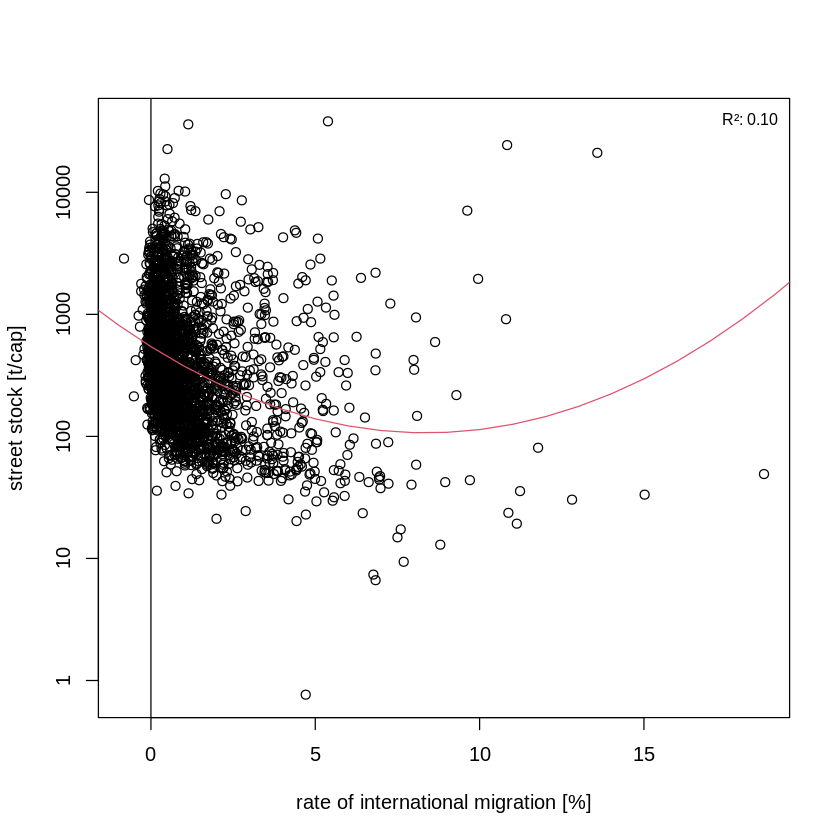


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-8.2496 -0.7057  0.0538  0.9300  5.2192 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.255765   0.042407  76.775  < 2e-16 ***
x           -0.373510   0.037928  -9.848  < 2e-16 ***
I(x * x)     0.025809   0.004325   5.968 2.71e-09 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.603 on 2817 degrees of freedom
Multiple R-squared:  0.04067,	Adjusted R-squared:  0.03998 
F-statistic: 59.71 on 2 and 2817 DF,  p-value: < 2.2e-16



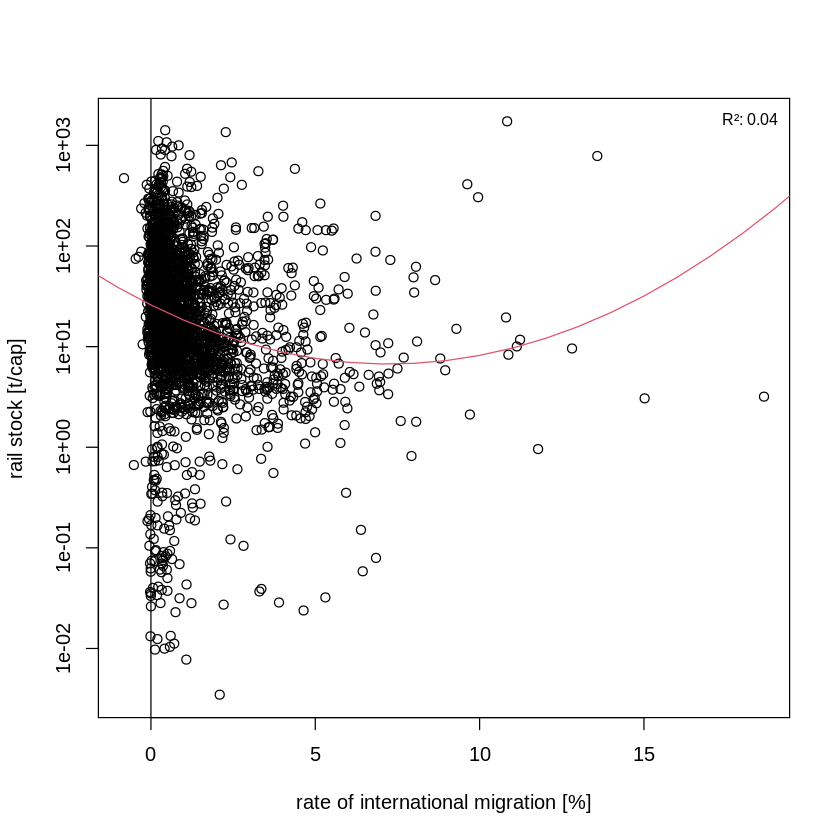


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.7534 -0.3550 -0.0282  0.3451  4.4078 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.913236   0.014936 262.004  < 2e-16 ***
x            0.059662   0.013715   4.350 1.40e-05 ***
I(x * x)    -0.007397   0.001589  -4.656 3.35e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5971 on 3098 degrees of freedom
Multiple R-squared:  0.007118,	Adjusted R-squared:  0.006477 
F-statistic:  11.1 on 2 and 3098 DF,  p-value: 1.564e-05



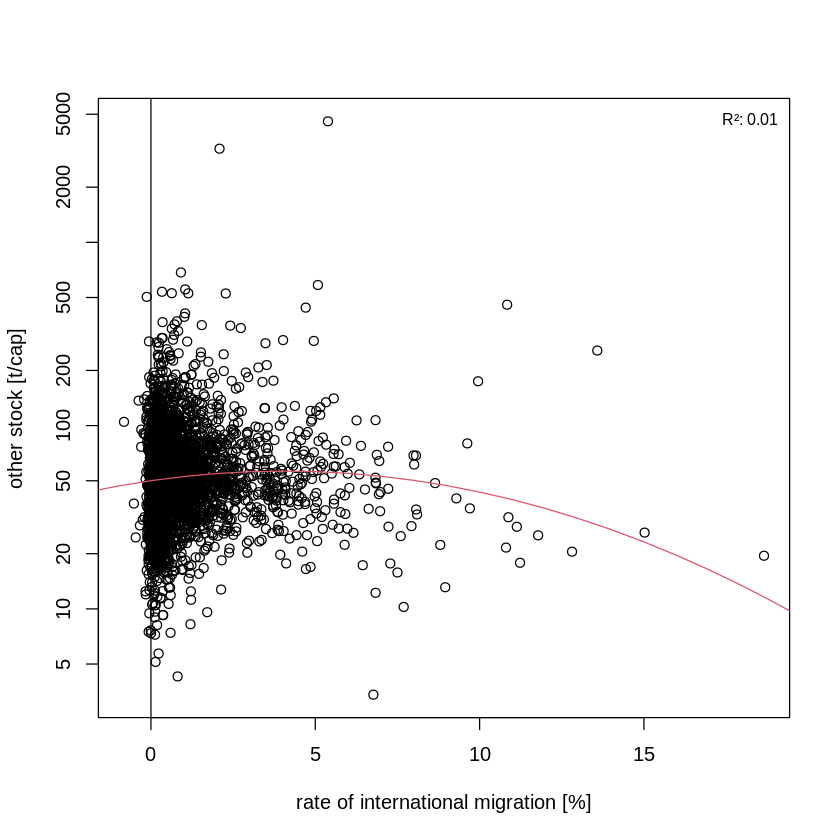


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
     Min       1Q   Median       3Q      Max 
-1.34393 -0.20713  0.00191  0.20297  1.21935 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.6421281  0.0084363 668.792  < 2e-16 ***
x           -0.1145198  0.0077465 -14.783  < 2e-16 ***
I(x * x)     0.0057668  0.0008974   6.426 1.51e-10 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3373 on 3098 degrees of freedom
Multiple R-squared:  0.1037,	Adjusted R-squared:  0.1031 
F-statistic: 179.2 on 2 and 3098 DF,  p-value: < 2.2e-16



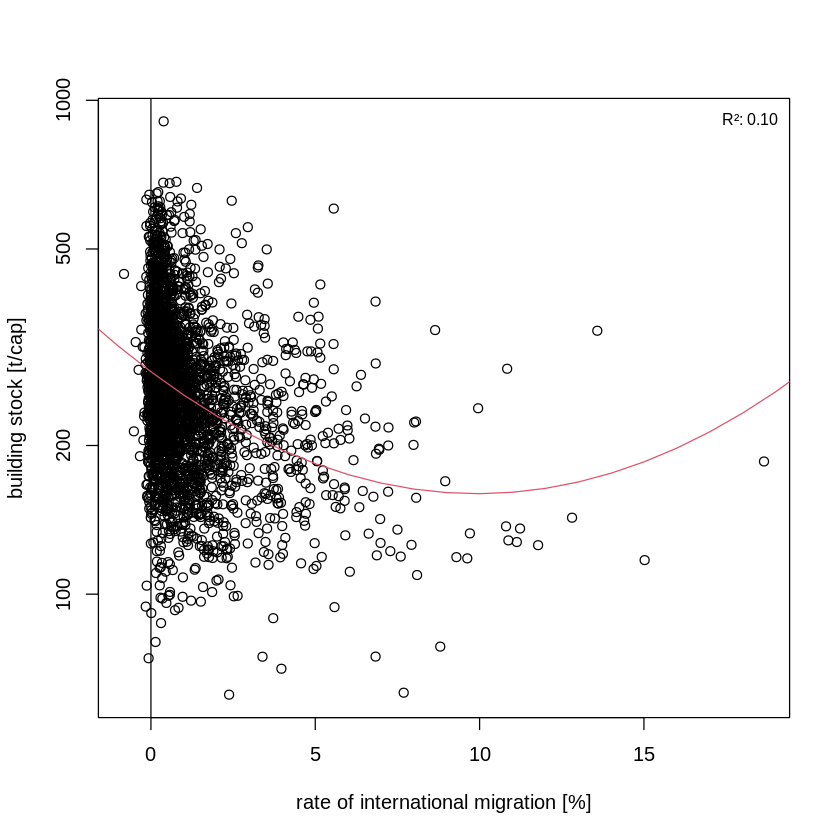


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.1001 -0.4923 -0.1806  0.3019  4.5616 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  6.88061    0.01814 379.265  < 2e-16 ***
x           -0.21910    0.01666 -13.153  < 2e-16 ***
I(x * x)     0.01396    0.00193   7.235 5.86e-13 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.7253 on 3098 degrees of freedom
Multiple R-squared:  0.0694,	Adjusted R-squared:  0.0688 
F-statistic: 115.5 on 2 and 3098 DF,  p-value: < 2.2e-16



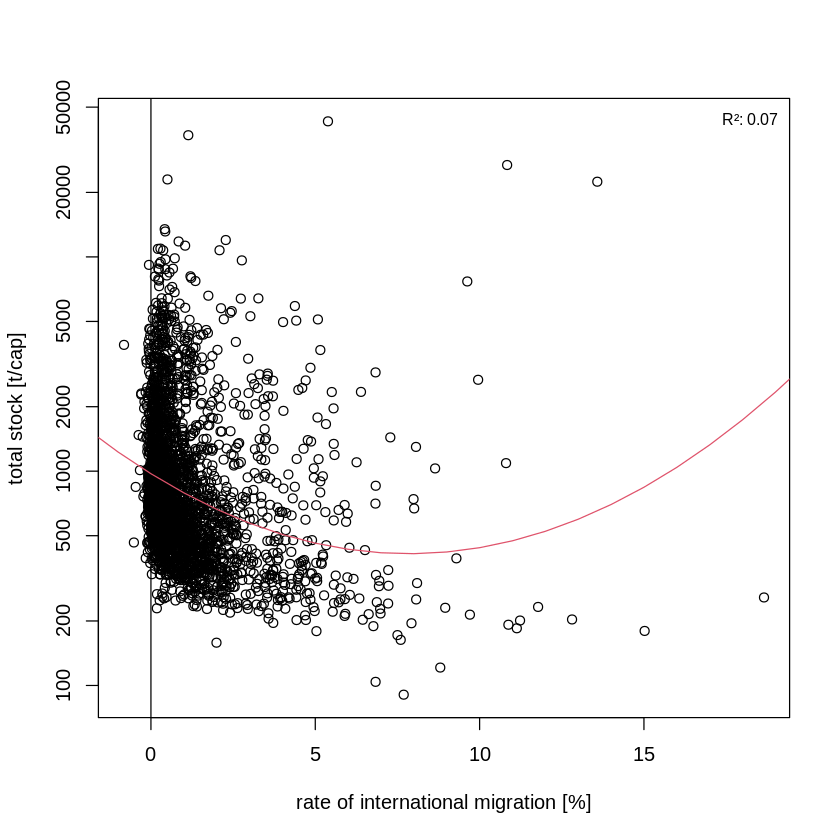


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-5.1419 -0.4628  0.1744  0.6272  2.6485 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.781381   0.021469 176.130  < 2e-16 ***
x            0.191661   0.019714   9.722  < 2e-16 ***
I(x * x)    -0.012791   0.002284  -5.601 2.32e-08 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.8584 on 3098 degrees of freedom
Multiple R-squared:  0.03759,	Adjusted R-squared:  0.03697 
F-statistic:  60.5 on 2 and 3098 DF,  p-value: < 2.2e-16



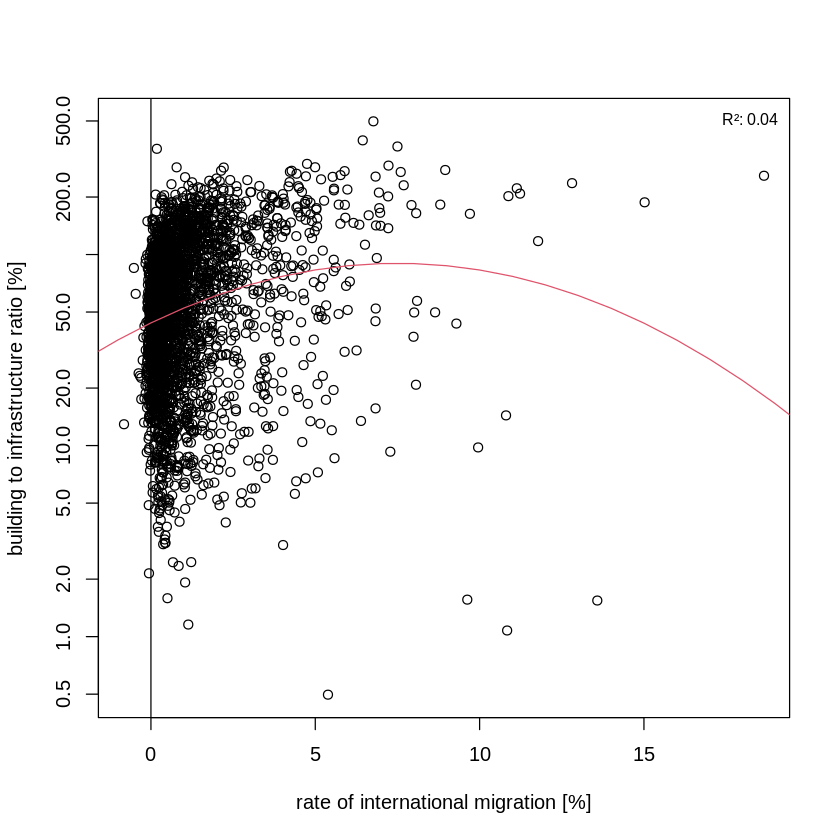

In [42]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t/cap]", 
         "rail stock [t/cap]", 
         "other stock [t/cap]", 
         "building stock [t/cap]", 
         "total stock [t/cap]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    #mai  <- c(0.4, 0.4, 0.2, 0.2)
    
    #    tiff(file.path(dplot, sprintf("%s-tons-vs-popchange.tif", name)),
    #    width = 8.8, height = 6, units = "cm", pointsize = 8,
    #    compression = "lzw", res = 600, type = "cairo", antialias = "subpixel")

#        par(mai = mai, cex = 1)

    sf_pop_ <- st_drop_geometry(sf_pop) %>% 
            select(c(rate_international_migration, names[i])) %>%
            filter(.data[[names[i]]] > 0)

    plot(sf_pop_, log = "y", 
            xlab = "rate of international migration [%]",
            ylab = lab[i])
    #smoothScatter(sf_pop_, log = "y")

    abline(v = 0)

    x <- sf_pop_$rate_international_migration %>% unlist()
    y <- sf_pop_[names[i]] %>% unlist()

    if (sum(y <= 0) > 0){
        x <- x[-which(y <= 0)]
        y <- y[-which(y <= 0)]
    }

    y <- log(y)

    mod <- lm(y ~ x + I(x*x))
    print(summary(mod))

    newx <- seq(-100, 1000, 1)
    coef(mod)[1] + coef(mod)[2] * newx  %>% exp()
    lines(newx, 
          exp(coef(mod)[1] + coef(mod)[2] * newx + coef(mod)[3] * newx*newx),
          col = 2)

    legend("topright", legend = c(
            sprintf("R²: %.2f", summary(mod)$r.squared)
            ), 
        bty = "n", cex = 0.8)

#    dev.off()

}


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-5.0922 -0.6572 -0.1282  0.4986  5.4914 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.938894   0.197388  19.955  < 2e-16 ***
x            0.233416   0.037523   6.221 5.62e-10 ***
I(x * x)    -0.003446   0.001763  -1.955   0.0507 .  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.042 on 3096 degrees of freedom
Multiple R-squared:  0.1325,	Adjusted R-squared:  0.1319 
F-statistic: 236.4 on 2 and 3096 DF,  p-value: < 2.2e-16



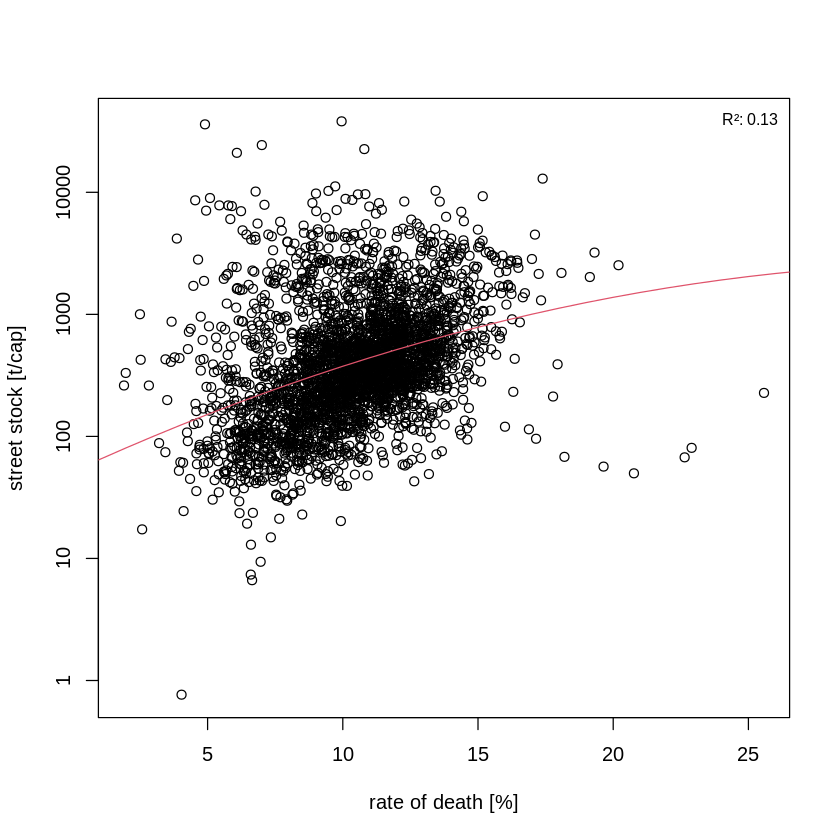


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-9.4088 -0.6718  0.0783  0.8668  5.1469 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.130846   0.308184   0.425 0.671182    
x            0.380617   0.058671   6.487 1.03e-10 ***
I(x * x)    -0.009901   0.002765  -3.581 0.000348 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.574 on 2817 degrees of freedom
Multiple R-squared:  0.07503,	Adjusted R-squared:  0.07438 
F-statistic: 114.3 on 2 and 2817 DF,  p-value: < 2.2e-16



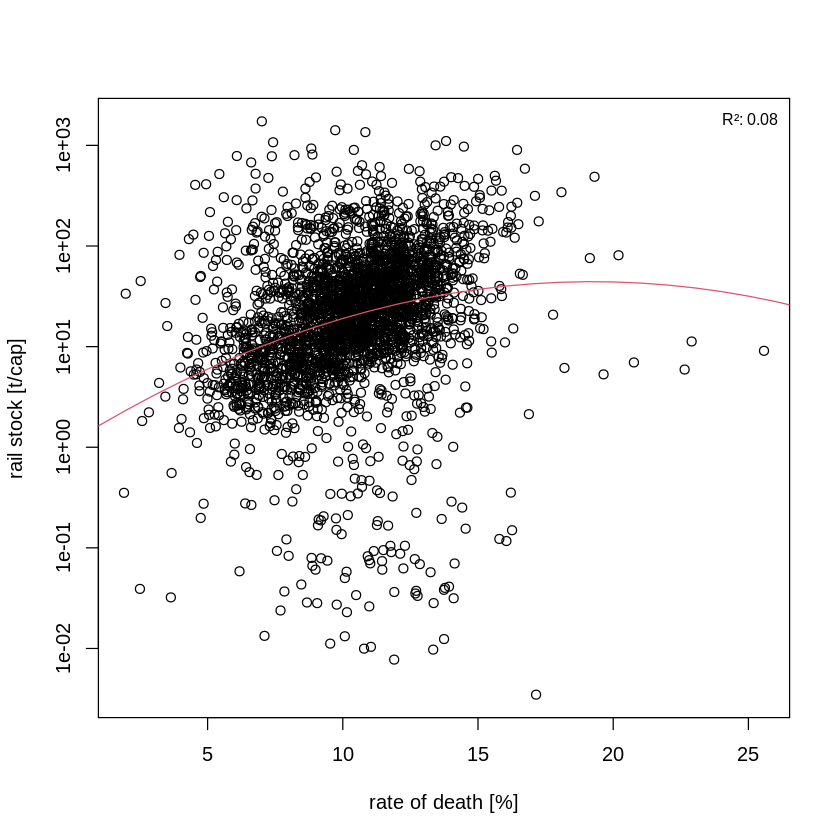


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.6694 -0.3556 -0.0168  0.3452  4.4969 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.961239   0.112924  35.079   <2e-16 ***
x           -0.024164   0.021475  -1.125   0.2606    
I(x * x)     0.002121   0.001009   2.102   0.0356 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5967 on 3098 degrees of freedom
Multiple R-squared:  0.008496,	Adjusted R-squared:  0.007856 
F-statistic: 13.27 on 2 and 3098 DF,  p-value: 1.82e-06



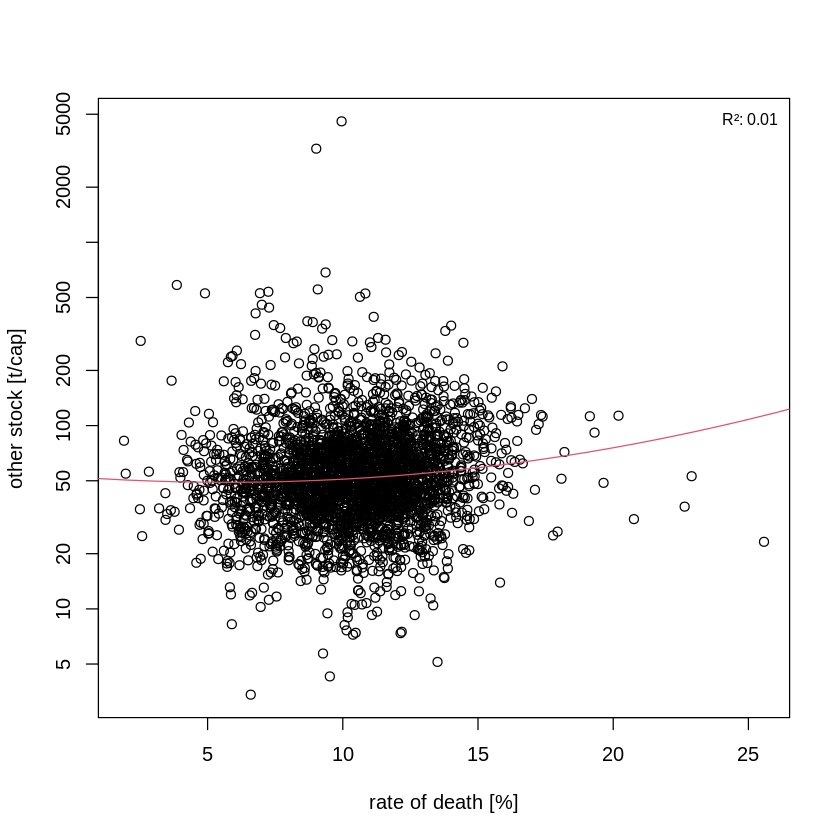


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
     Min       1Q   Median       3Q      Max 
-1.20060 -0.19237  0.00353  0.19364  1.40374 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  4.7087582  0.0609748  77.225  < 2e-16 ***
x            0.1029102  0.0115957   8.875  < 2e-16 ***
I(x * x)    -0.0020629  0.0005449  -3.786 0.000156 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3222 on 3098 degrees of freedom
Multiple R-squared:  0.182,	Adjusted R-squared:  0.1815 
F-statistic: 344.7 on 2 and 3098 DF,  p-value: < 2.2e-16



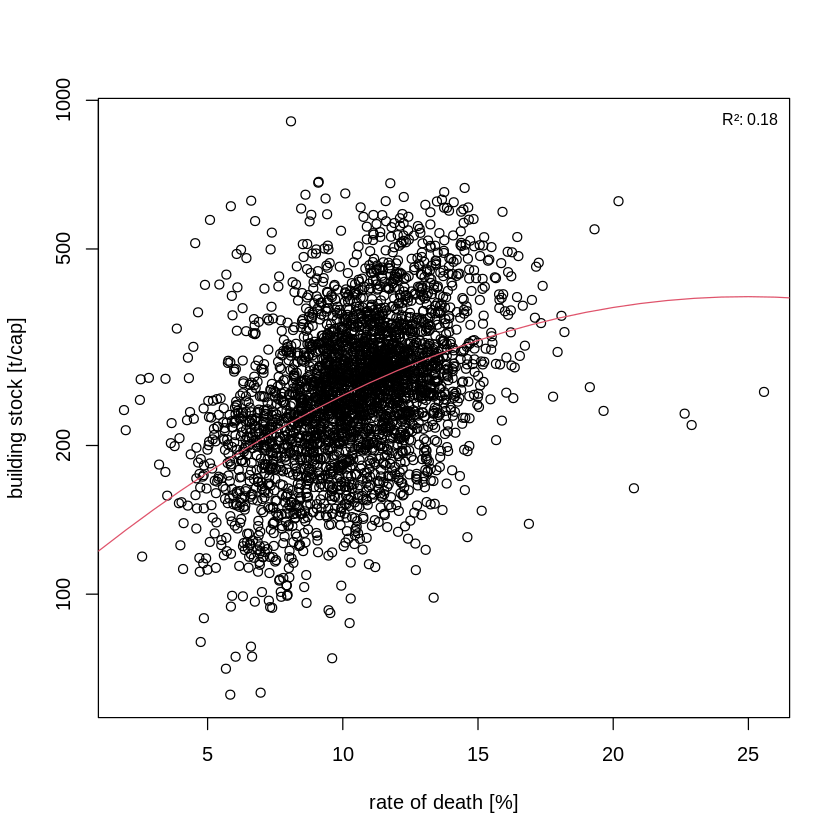


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.2386 -0.4567 -0.1639  0.2823  4.3957 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.5977356  0.1333514  41.977  < 2e-16 ***
x            0.1077747  0.0253596   4.250  2.2e-05 ***
I(x * x)    -0.0001617  0.0011917  -0.136    0.892    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.7047 on 3098 degrees of freedom
Multiple R-squared:  0.1216,	Adjusted R-squared:  0.1211 
F-statistic: 214.5 on 2 and 3098 DF,  p-value: < 2.2e-16



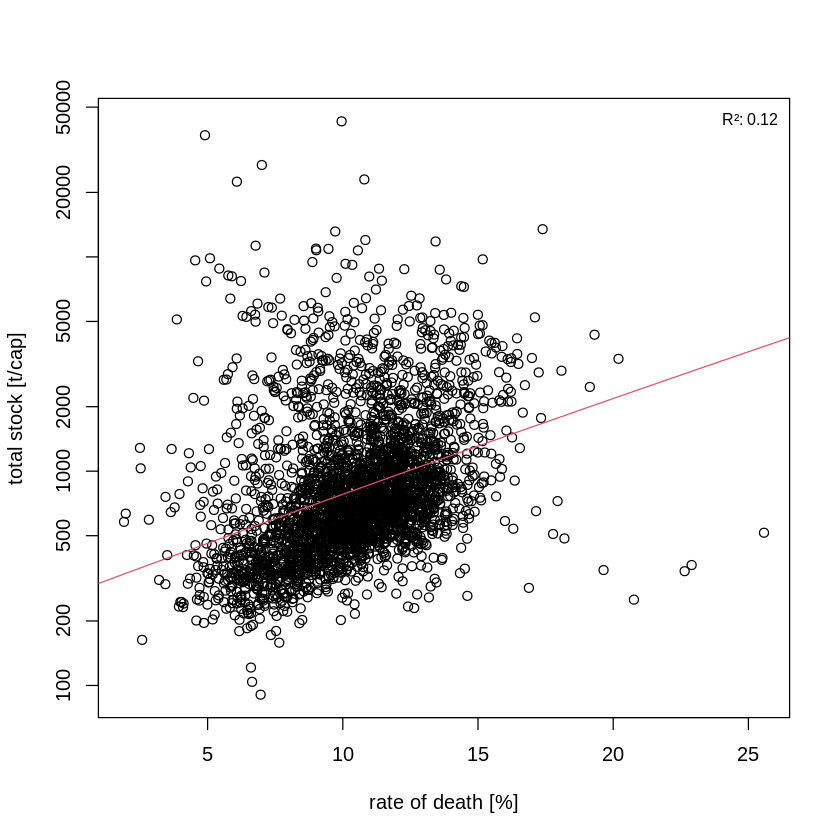


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-4.6766 -0.4287  0.1637  0.5963  2.4823 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  4.6748429  0.1613456  28.974   <2e-16 ***
x           -0.0626591  0.0306833  -2.042   0.0412 *  
I(x * x)    -0.0007441  0.0014418  -0.516   0.6058    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.8526 on 3098 degrees of freedom
Multiple R-squared:  0.05045,	Adjusted R-squared:  0.04983 
F-statistic: 82.29 on 2 and 3098 DF,  p-value: < 2.2e-16



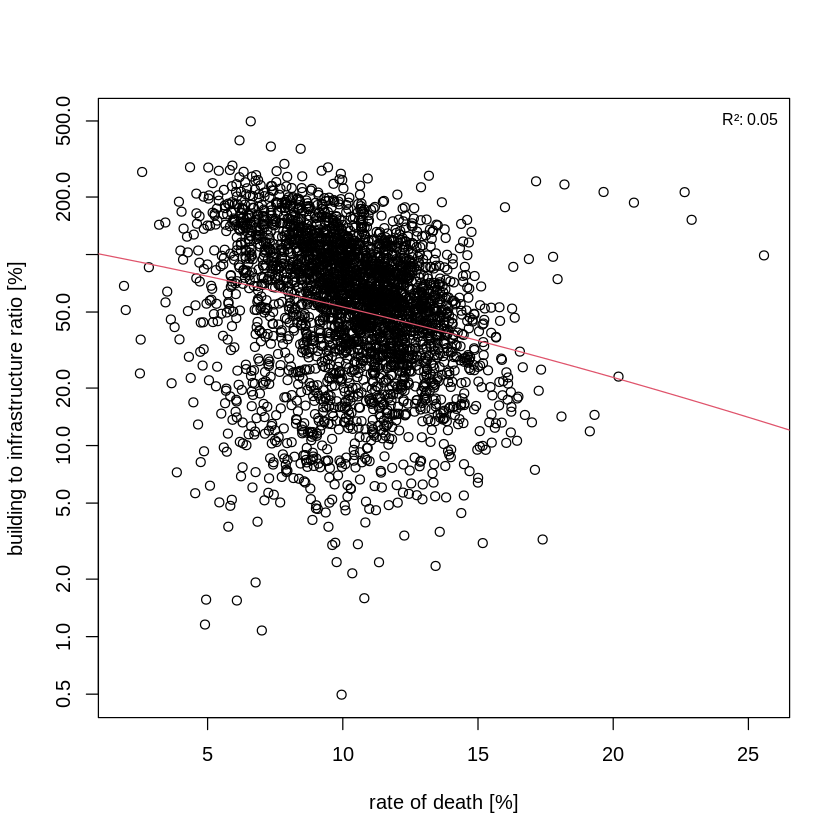

In [47]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t/cap]", 
         "rail stock [t/cap]", 
         "other stock [t/cap]", 
         "building stock [t/cap]", 
         "total stock [t/cap]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    #mai  <- c(0.4, 0.4, 0.2, 0.2)
    
    #    tiff(file.path(dplot, sprintf("%s-tons-vs-popchange.tif", name)),
    #    width = 8.8, height = 6, units = "cm", pointsize = 8,
    #    compression = "lzw", res = 600, type = "cairo", antialias = "subpixel")

#        par(mai = mai, cex = 1)

    sf_pop_ <- st_drop_geometry(sf_pop) %>% 
            select(c(rate_death, names[i])) %>%
            filter(.data[[names[i]]] > 0)

    plot(sf_pop_, log = "y", 
            xlab = "rate of death [%]",
            ylab = lab[i])
    #smoothScatter(sf_pop_, log = "y")

    abline(v = 0)

    x <- sf_pop_$rate_death %>% unlist()
    y <- sf_pop_[names[i]] %>% unlist()

    if (sum(y <= 0) > 0){
        x <- x[-which(y <= 0)]
        y <- y[-which(y <= 0)]
    }

    y <- log(y)

    mod <- lm(y ~ x + I(x*x))
    print(summary(mod))

    newx <- seq(-100, 1000, 1)
    coef(mod)[1] + coef(mod)[2] * newx  %>% exp()
    lines(newx, 
          exp(coef(mod)[1] + coef(mod)[2] * newx + coef(mod)[3] * newx*newx),
          col = 2)

    legend("topright", legend = c(
            sprintf("R²: %.2f", summary(mod)$r.squared)
            ), 
        bty = "n", cex = 0.8)

#    dev.off()

}


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-5.9443 -0.7310 -0.0502  0.6426  4.6961 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  9.114738   0.265033   34.39  < 2e-16 ***
x           -0.399288   0.038619  -10.34  < 2e-16 ***
I(x * x)     0.011022   0.001379    7.99 1.88e-15 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.08 on 3096 degrees of freedom
Multiple R-squared:  0.06692,	Adjusted R-squared:  0.06632 
F-statistic:   111 on 2 and 3096 DF,  p-value: < 2.2e-16



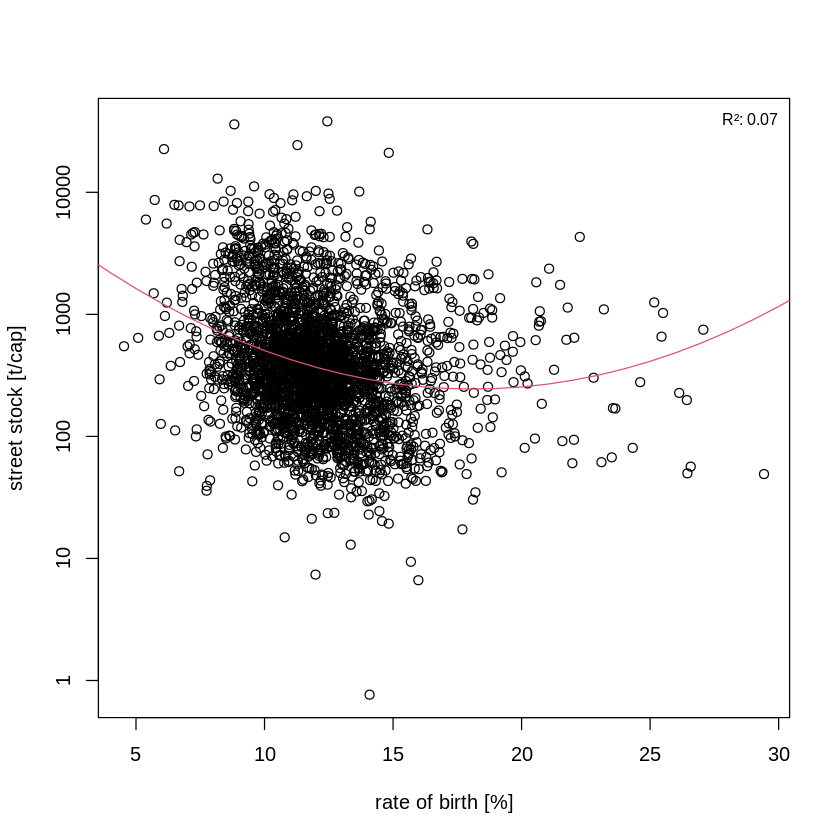


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-8.5585 -0.7650  0.1283  0.9861  4.4869 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.152588   0.449930   7.007 3.04e-12 ***
x           -0.002460   0.065704  -0.037    0.970    
I(x * x)    -0.001207   0.002357  -0.512    0.609    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.635 on 2817 degrees of freedom
Multiple R-squared:  0.002916,	Adjusted R-squared:  0.002208 
F-statistic:  4.12 on 2 and 2817 DF,  p-value: 0.01635



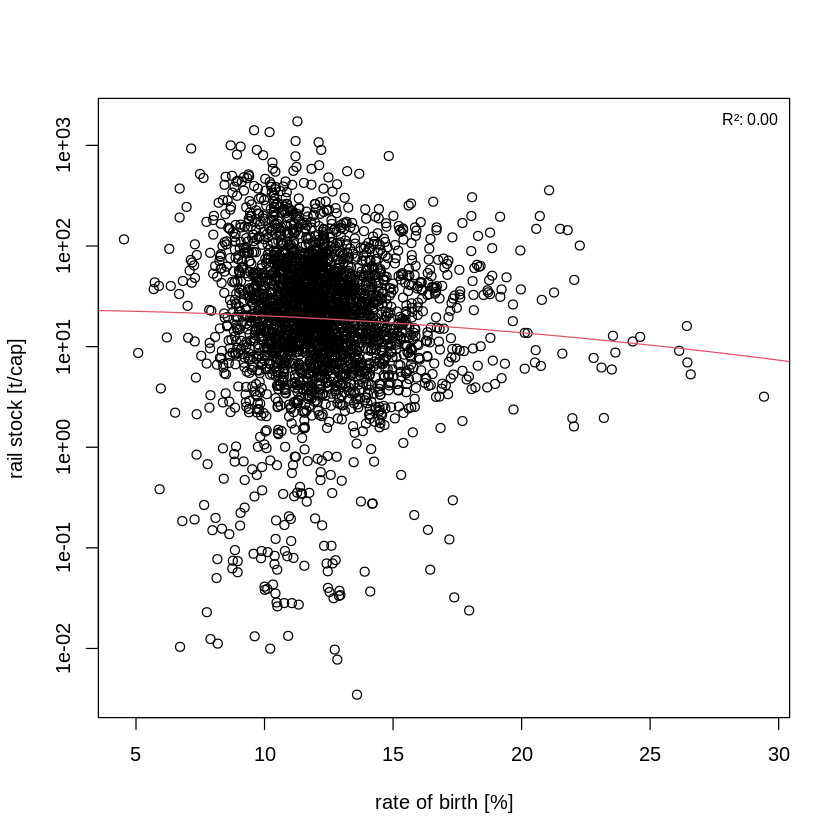


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.7280 -0.3571 -0.0290  0.3409  4.4664 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.6413937  0.1465941  24.840   <2e-16 ***
x            0.0329759  0.0213610   1.544    0.123    
I(x * x)    -0.0005833  0.0007630  -0.764    0.445    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5977 on 3098 degrees of freedom
Multiple R-squared:  0.005286,	Adjusted R-squared:  0.004644 
F-statistic: 8.231 on 2 and 3098 DF,  p-value: 0.0002721



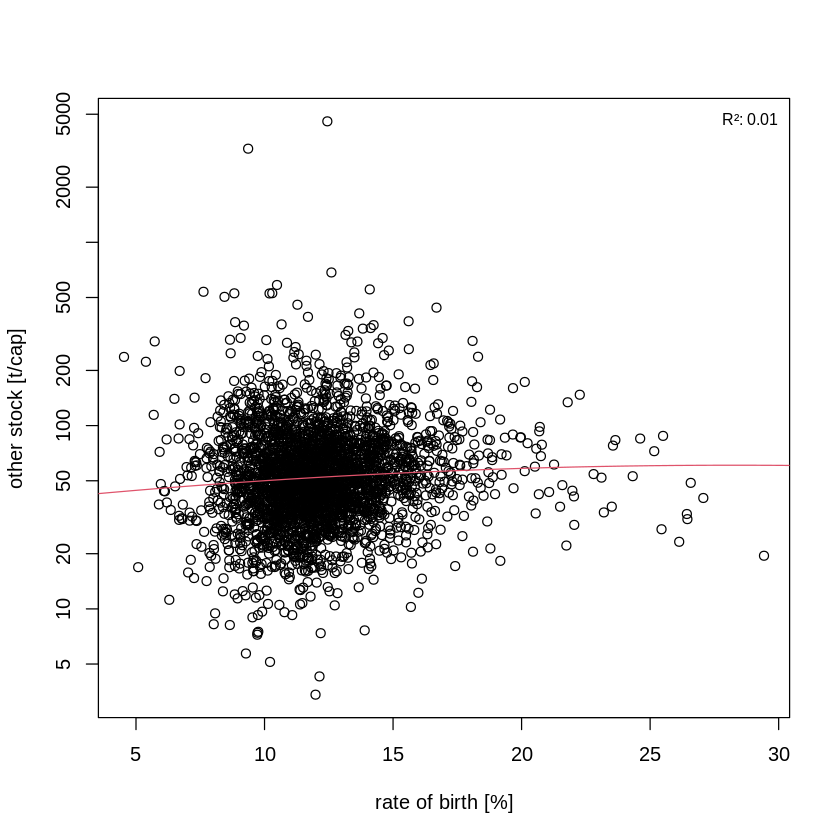


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
     Min       1Q   Median       3Q      Max 
-1.31822 -0.20508  0.00414  0.21433  1.17293 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.9746853  0.0833531  71.679   <2e-16 ***
x           -0.0303382  0.0121458  -2.498   0.0125 *  
I(x * x)    -0.0004375  0.0004338  -1.008   0.3133    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3398 on 3098 degrees of freedom
Multiple R-squared:  0.09005,	Adjusted R-squared:  0.08947 
F-statistic: 153.3 on 2 and 3098 DF,  p-value: < 2.2e-16



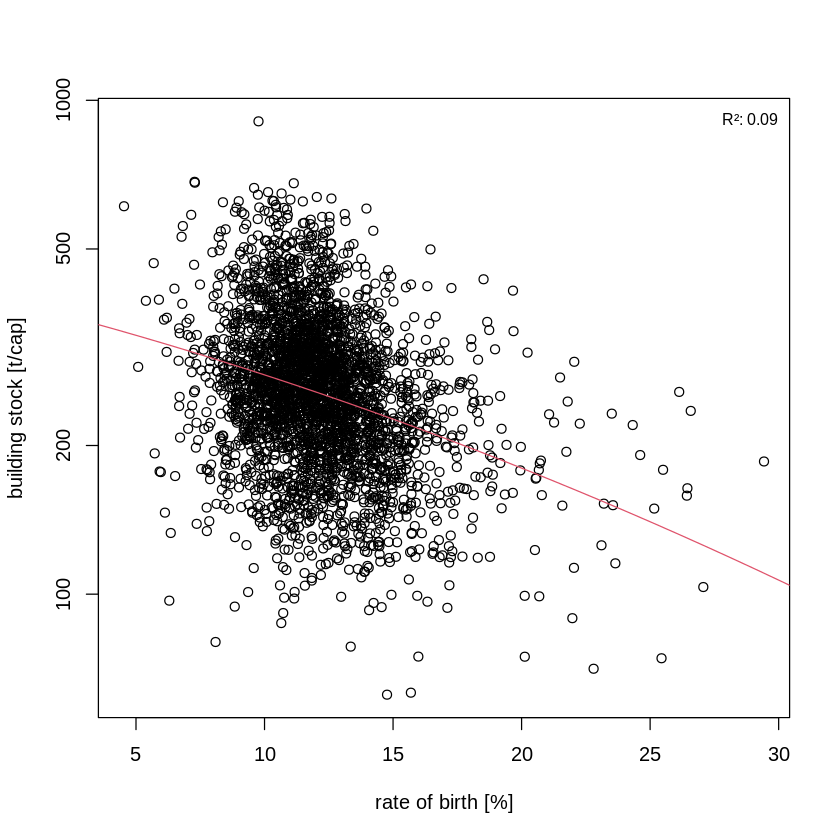


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-1.9175 -0.4952 -0.1177  0.3687  4.0441 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  8.7427975  0.1782106  49.059  < 2e-16 ***
x           -0.2568431  0.0259680  -9.891  < 2e-16 ***
I(x * x)     0.0069506  0.0009276   7.493 8.71e-14 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.7266 on 3098 degrees of freedom
Multiple R-squared:  0.06613,	Adjusted R-squared:  0.06553 
F-statistic: 109.7 on 2 and 3098 DF,  p-value: < 2.2e-16



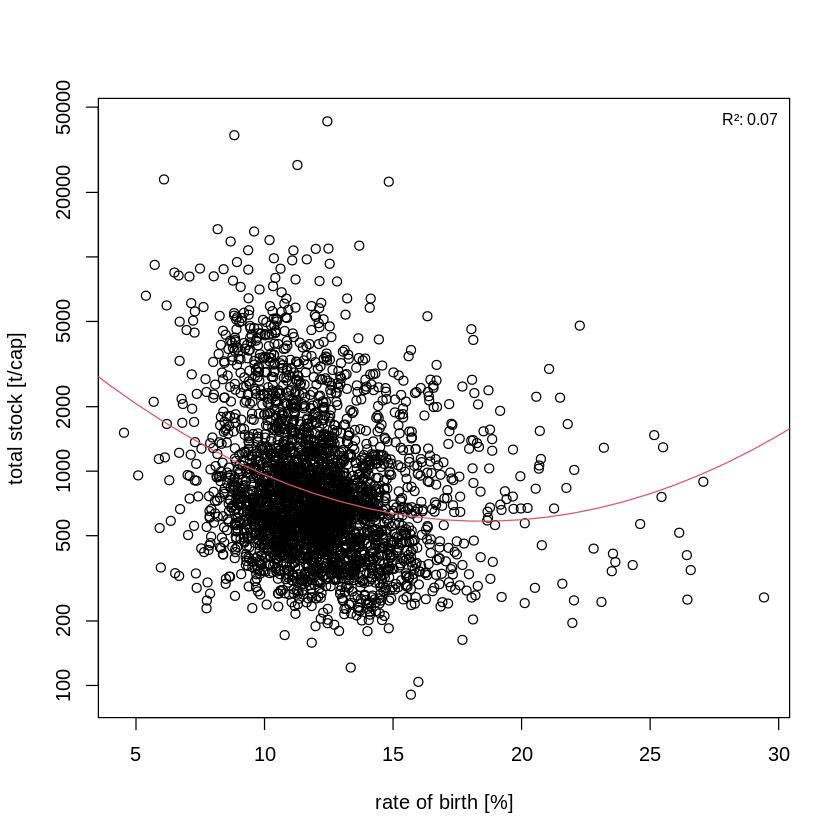


Call:
lm(formula = y ~ x + I(x * x))

Residuals:
    Min      1Q  Median      3Q     Max 
-4.7249 -0.5039  0.1171  0.6307  3.3402 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  1.725715   0.210661   8.192 3.72e-16 ***
x            0.308064   0.030697  10.036  < 2e-16 ***
I(x * x)    -0.009903   0.001096  -9.032  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.8589 on 3098 degrees of freedom
Multiple R-squared:  0.03636,	Adjusted R-squared:  0.03574 
F-statistic: 58.45 on 2 and 3098 DF,  p-value: < 2.2e-16



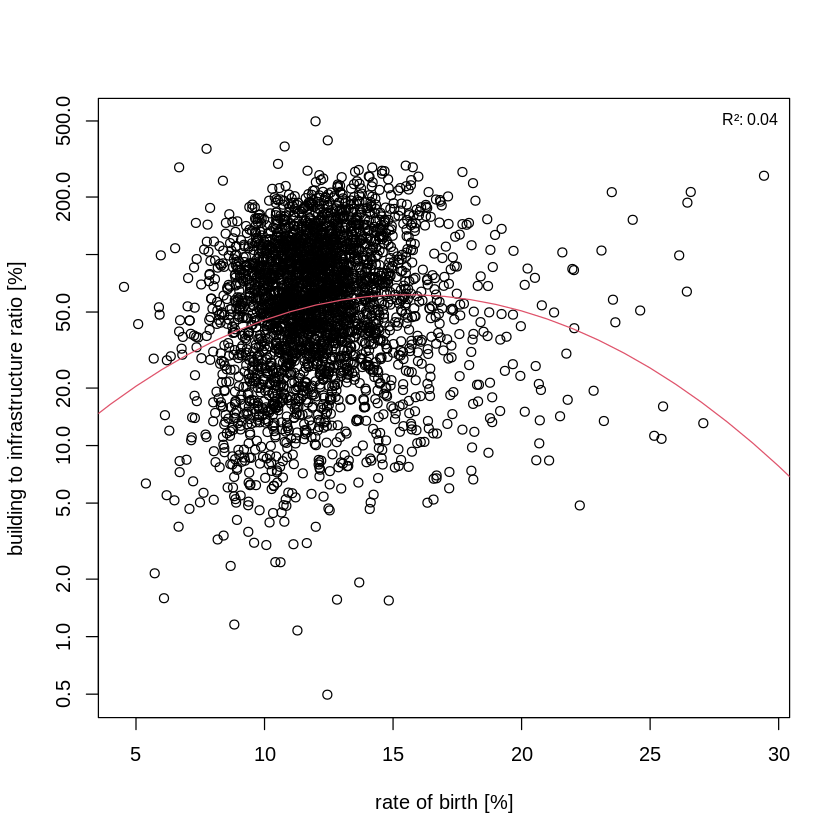

In [48]:
names <- c("mass_street", 
           "mass_rail", 
           "mass_other", 
           "mass_building", 
           "mass_grand_t_10m2",
           "ratio")

lab <- c("street stock [t/cap]", 
         "rail stock [t/cap]", 
         "other stock [t/cap]", 
         "building stock [t/cap]", 
         "total stock [t/cap]",
         "building to infrastructure ratio [%]")

for (i in 1:length(names)){

    #mai  <- c(0.4, 0.4, 0.2, 0.2)
    
    #    tiff(file.path(dplot, sprintf("%s-tons-vs-popchange.tif", name)),
    #    width = 8.8, height = 6, units = "cm", pointsize = 8,
    #    compression = "lzw", res = 600, type = "cairo", antialias = "subpixel")

#        par(mai = mai, cex = 1)

    sf_pop_ <- st_drop_geometry(sf_pop) %>% 
            select(c(rate_birth, names[i])) %>%
            filter(.data[[names[i]]] > 0)

    plot(sf_pop_, log = "y", 
            xlab = "rate of birth [%]",
            ylab = lab[i])
    #smoothScatter(sf_pop_, log = "y")

    abline(v = 0)

    x <- sf_pop_$rate_birth %>% unlist()
    y <- sf_pop_[names[i]] %>% unlist()

    if (sum(y <= 0) > 0){
        x <- x[-which(y <= 0)]
        y <- y[-which(y <= 0)]
    }

    y <- log(y)

    mod <- lm(y ~ x + I(x*x))
    print(summary(mod))

    newx <- seq(-100, 1000, 1)
    coef(mod)[1] + coef(mod)[2] * newx  %>% exp()
    lines(newx, 
          exp(coef(mod)[1] + coef(mod)[2] * newx + coef(mod)[3] * newx*newx),
          col = 2)

    legend("topright", legend = c(
            sprintf("R²: %.2f", summary(mod)$r.squared)
            ), 
        bty = "n", cex = 0.8)

#    dev.off()

}

## building vs. street stocks

I believe Dominik wanted to see plots like this?


Call:
lm(formula = mass_building ~ mass_street, data = .)

Residuals:
    Min      1Q  Median      3Q     Max 
-4.0373 -0.3238  0.0643  0.3910  8.8180 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -9.59119    0.14593  -65.72   <2e-16 ***
mass_street  2.04459    0.01657  123.36   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.659 on 3098 degrees of freedom
Multiple R-squared:  0.8309,	Adjusted R-squared:  0.8308 
F-statistic: 1.522e+04 on 1 and 3098 DF,  p-value: < 2.2e-16


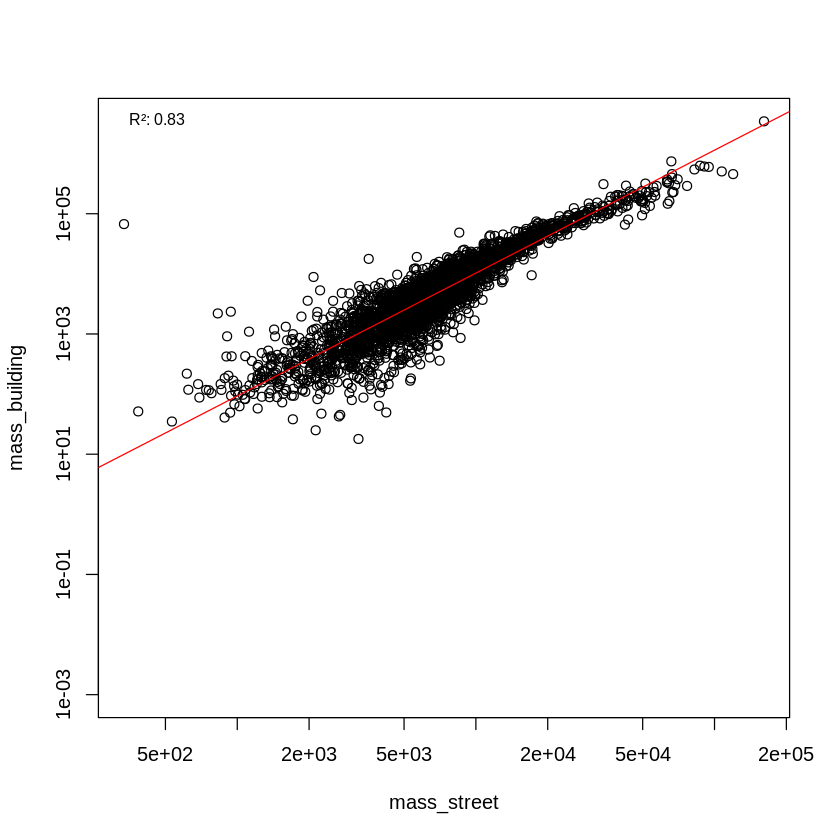

In [29]:
sf_ <- st_drop_geometry(sf_area) %>% 
       filter(mass_street > 0)

sf_ %>% select(mass_street, mass_building) %>%
plot(log = "xy", ylim = c(0.001, max(sf_area$mass_building)))

lsf_  <- sf_ %>% mutate(across(where(is.numeric), log))

line <- data.frame(mass_street = seq(0,1e2,0.1))

mod <- lsf_ %>% lm(mass_building ~ mass_street, data = .) 
summary(mod)
    mod %>% 
     predict(newdata = line) %>% exp() %>%
     lines(exp(line$mass_street), ., col = "red")

legend("topleft", legend = 
        sprintf("R²: %.2f", summary(mod)$r.squared), 
    bty = "n", cex = 0.8)

not really polished, but below is the same thing, but split by building type

- RES-LR: light green
- RES-MR: dark green
- IMU: yellow
- IMU-HR: orange
- IMU-SKY: blue
- C/I: red
- MLB: cyan

not really sure what this tells us, but the curves for mid-rise residential buildings and C/I are a bit steeper

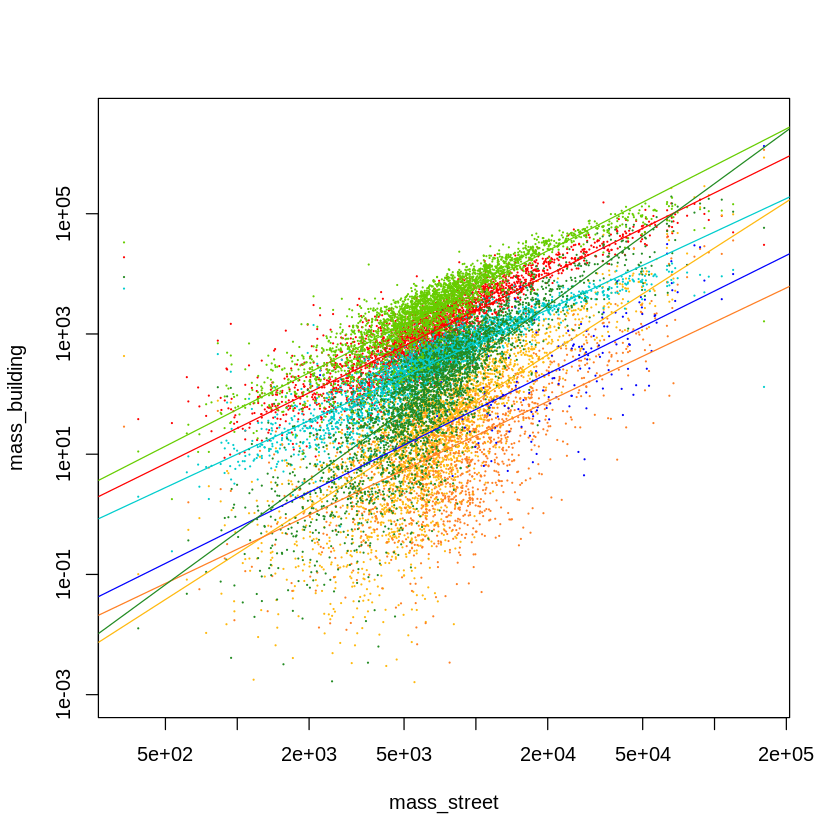

In [30]:
sf_ <- st_drop_geometry(sf_area) %>% 
       filter(mass_street > 0)

sf_ %>% select(mass_street, mass_building) %>%
plot(type = "n", log = "xy", ylim = c(0.001, max(sf_area$mass_building)))


sf_ %>% select(mass_street, mass_building_commercial_industrial) %>%
        points(pch = 19, cex = 0.1, col = "red")
sf_ %>% select(mass_street, mass_building_commercial_innercity) %>%
        points(pch = 19, cex = 0.1, col = "darkgoldenrod1")
sf_ %>% select(mass_street, mass_building_highrise) %>%
        points(pch = 19, cex = 0.1, col = "chocolate1")
sf_ %>% select(mass_street, mass_building_skyscraper) %>%
        points(pch = 19, cex = 0.1, col = "blue")
sf_ %>% select(mass_street, mass_building_lightweight) %>%
        points(pch = 19, cex = 0.1, col = "cyan3")
sf_ %>% select(mass_street, mass_building_multifamily) %>%
        points(pch = 19, cex = 0.1, col = "forestgreen")
sf_ %>% select(mass_street, mass_building_singlefamily) %>%
        points(pch = 19, cex = 0.1, col = "chartreuse3")

lsf_  <- sf_ %>% mutate(across(where(is.numeric), log))

line <- data.frame(mass_street = seq(0,1e2,0.1))

lsf_ %>% filter(mass_building_commercial_industrial > 0) %>%
         lm(mass_building_commercial_industrial ~ mass_street, data = .) %>% 
         predict(newdata = line) %>% exp() %>%
         lines(exp(line$mass_street), ., col = "red")
lsf_ %>% filter(mass_building_commercial_innercity > 0) %>%
         lm(mass_building_commercial_innercity ~ mass_street, data = .) %>% 
         predict(newdata = line) %>% exp() %>%
         lines(exp(line$mass_street), ., col = "darkgoldenrod1")
lsf_ %>% filter(mass_building_highrise > 0) %>%
         lm(mass_building_highrise ~ mass_street, data = .) %>% 
         predict(newdata = line) %>% exp() %>%
         lines(exp(line$mass_street), ., col = "chocolate1")
lsf_ %>% filter(mass_building_skyscraper > 0) %>%
         lm(mass_building_skyscraper ~ mass_street, data = .) %>% 
         predict(newdata = line) %>% exp() %>%
         lines(exp(line$mass_street), ., col = "blue")
lsf_ %>% filter(mass_building_lightweight > 0) %>%
         lm(mass_building_lightweight ~ mass_street, data = .) %>% 
         predict(newdata = line) %>% exp() %>%
         lines(exp(line$mass_street), ., col = "cyan3")
lsf_ %>% filter(mass_building_multifamily > 0) %>%
         lm(mass_building_multifamily ~ mass_street, data = .) %>% 
         predict(newdata = line) %>% exp() %>%
         lines(exp(line$mass_street), ., col = "forestgreen")
lsf_ %>% filter(mass_building_singlefamily > 0) %>%
         lm(mass_building_singlefamily ~ mass_street, data = .) %>% 
         predict(newdata = line) %>% exp() %>%
         lines(exp(line$mass_street), ., col = "chartreuse3")

#### Mass per cap for types dependent on climate (per climate zone)

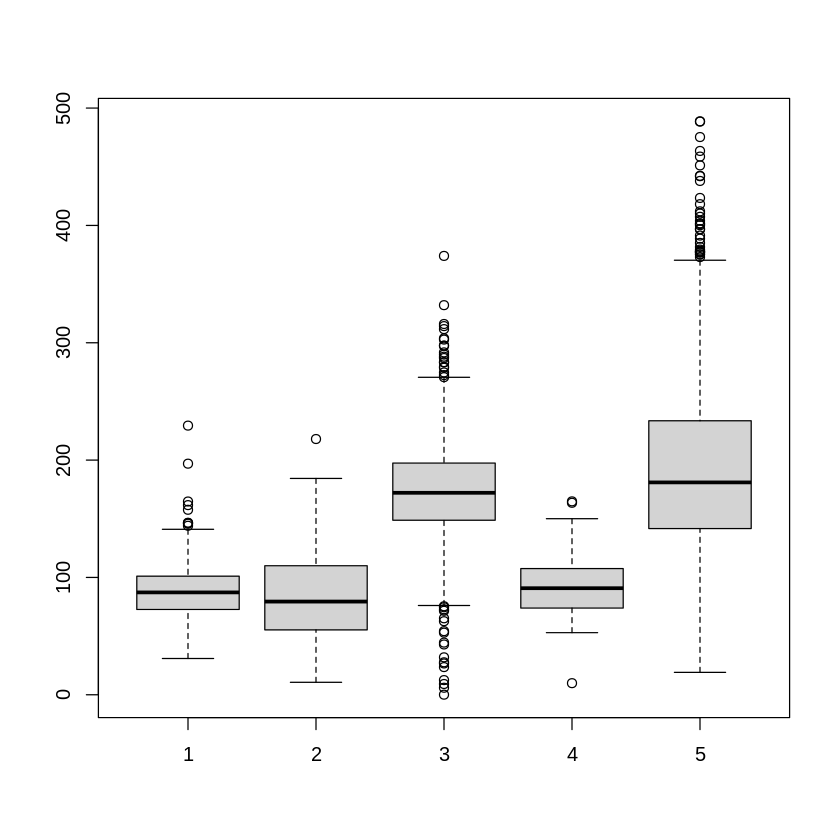

In [23]:
split(sf_pop$mass_building_singlefamily, 
      sf$building_z) %>%
boxplot()

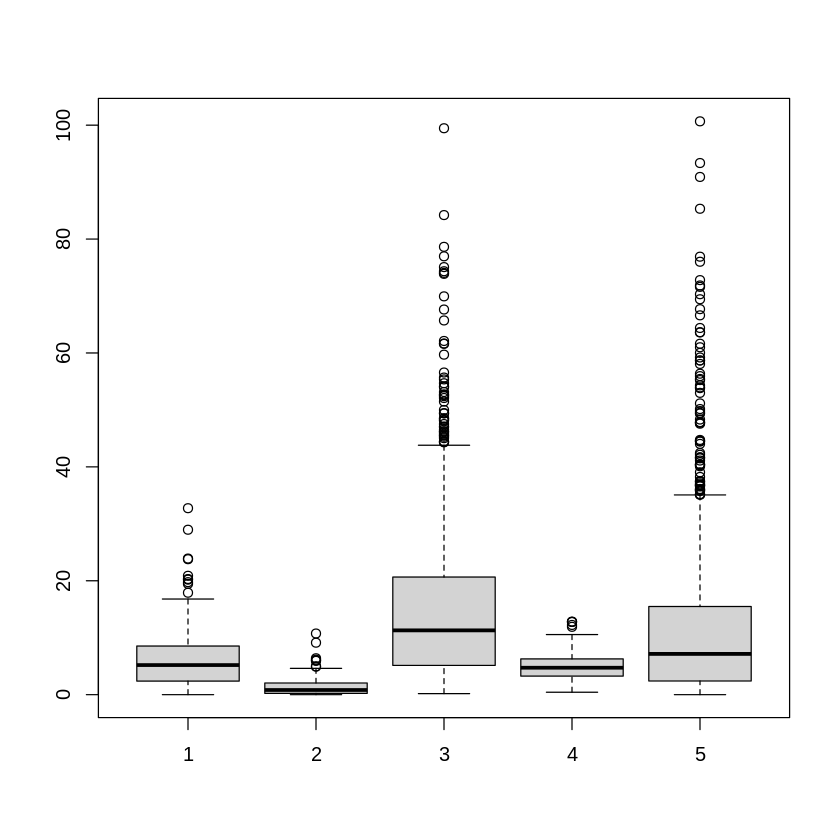

In [36]:
split(sf_pop$mass_building_multifamily, 
      sf$building_z) %>%
boxplot()

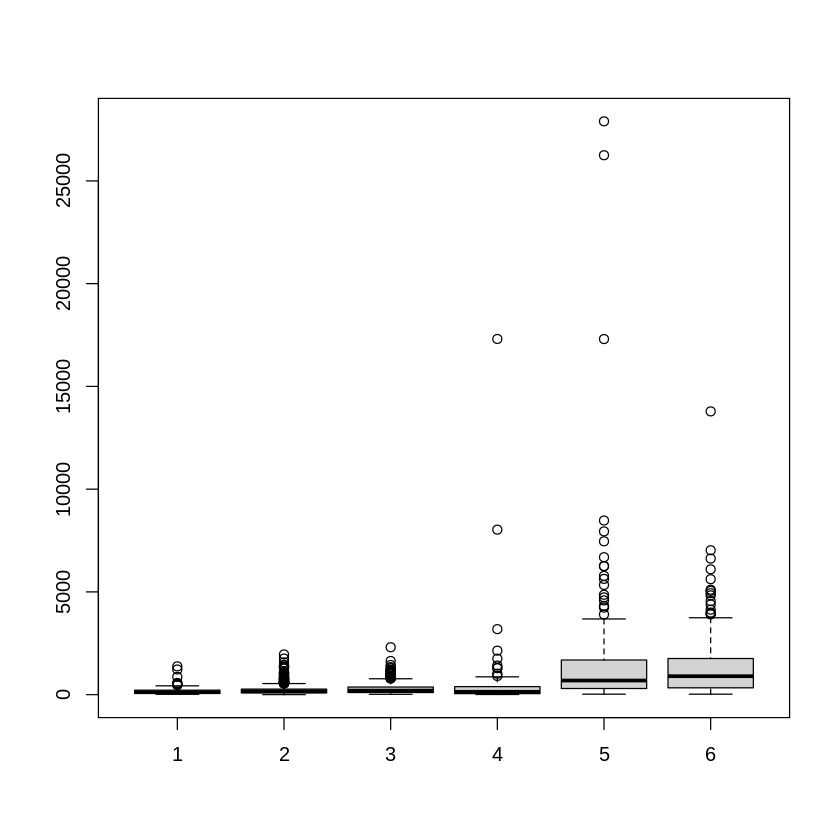

In [27]:
split(sf_pop$mass_street_local, 
      sf$road_zone) %>%
boxplot()

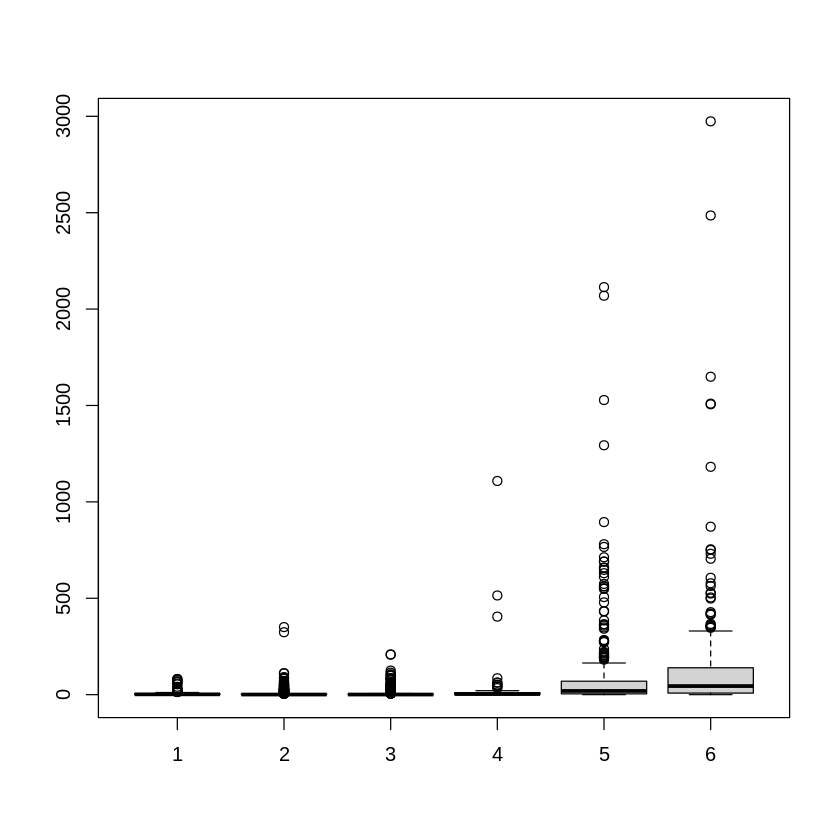

In [28]:
split(sf_pop$mass_street_track, 
      sf$road_zone) %>%
boxplot()